<h1><center>Crypto Regression</center></h1>



**Goals:**



1.       Data Summary: Describe the dataset size, key variables, and target variable.
             I already had knowledge of the data being the open, high, low, close, volumn and correlated usd token for XRP. Here I will engineer features including, momentum, volatlity, intracandle information as well as bollinger bands and atr values.

2. Objective of the Analysis: Clearly state what the analysis aims to achieve.
             Objective: Take trailing and current indicators common to the stock market technical analysis as well as volume and trailing price values and use them to predict price using regression models and lasso and ridge regression.

3.  Model Comparison: Compare variations of linear regression and select the best one.

4. Key Findings: Present meaningful insights that align with the objective.

5.  Limitations and Next Steps: Identify model flaws and outline future improvements
              A lot of data contained bimodal distributions and I read this may be a good data set for random forrests.




In [1]:
# @title
!pip install -U scikit-learn
!pip install pandas
!pip install numpy
!pip install seaborn
!pip install matplotlib

In [2]:
# @title
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# **1. Data Summary**

**Loading Data from CSV**

In [3]:
# @title
#Data summary, essentially price, open, high, low, close and volume values. I will
#engineer my own variables as well.

#upload data.
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))


data = pd.read_csv(fn)
data.head()


Saving XRP.csv to XRP.csv
User uploaded file "XRP.csv" with length 112141 bytes


,unix,date,symbol,open,high,low,close,Volume XRP,Volume USDT
0,1.640560e+12,12-27-2021,XRP-USDT,0.9200,0.9237,0.9200,0.9226,2384512.0,2.198450e+06
1,1.640480e+12,12-26-2021,XRP-USDT,0.9252,0.9334,0.9052,0.9200,163438501.0,1.499400e+08
2,1.640390e+12,12-25-2021,XRP-USDT,0.9114,0.9350,0.8981,0.9252,250074945.0,2.302303e+08
3,1.640300e+12,12-24-2021,XRP-USDT,0.9941,0.9966,0.8964,0.9115,567234092.0,5.377035e+08
4,1.640220e+12,12-23-2021,XRP-USDT,0.9538,1.0167,0.9372,0.9941,479436230.0,4.729372e+08


**Feature Engineering**

In [4]:
# @title
import numpy as np
import pandas as pd

def build_features(data):
    """
    Feature engineering pipeline: trailing lags, MAs/STDs, candle shapes,
    patterns, ATR on lagged data, Bollinger Bands vs Close, and RSI.
    Returns enriched DataFrame.
    """
    # Make a copy
    feat_eng = data.copy()

    # --- Clean Volume ---
    def clean_volume(vol):
        if isinstance(vol, str):
            vol = vol.replace(',', '')
            if 'B' in vol:
                return float(vol.replace('B', '')) * 1e9
            elif 'M' in vol:
                return float(vol.replace('M', '')) * 1e6
        try:
            return float(vol)
        except (ValueError, TypeError):
            return np.nan

    feat_eng['Volume XRP'] = feat_eng['Volume XRP'].apply(clean_volume)
    feat_eng['Volume XRP'] = pd.to_numeric(feat_eng['Volume XRP'], errors='coerce')

    # === Feature containers ===
    new_cols = {}

    lags = [5, 15, 30, 50]
    ma_periods = [3, 5, 8, 15, 21, 30, 50, 100]
    bb_periods = [15, 30, 50]
    rsi_periods = [5, 14, 30]

    # --- Lag features ---
    for k in lags:
        new_cols[f"close_lag_{k}"] = feat_eng["close"].shift(k)
        new_cols[f"volume_lag_{k}"] = feat_eng["Volume XRP"].shift(k)

    # Add lagged features to feat_eng DataFrame
    feat_eng = pd.concat([feat_eng, pd.DataFrame(new_cols, index=feat_eng.index)], axis=1)

    # --- Moving averages & std deviations ---
    lag_nms = [f"close_lag_{k}" for k in lags] + [f"volume_lag_{k}" for k in lags]

    for col in lag_nms:
        for r in ma_periods:
            new_cols[f"{col}_ma_{r}"] = feat_eng[col].rolling(r).mean()
            new_cols[f"{col}_std_{r}"] = feat_eng[col].rolling(r).std()

    # --- Faster deltas ---
    prev = None
    lag_ma_std_cols = [k for k in new_cols.keys() if "_ma_" in k or "_std_" in k]
    for col in lag_ma_std_cols:
        if prev is not None:
            new_cols[f"{col}_delta"] = new_cols[col] - new_cols[prev]
        prev = col

    # --- Candle shape features ---
    body = abs(feat_eng["close"] - feat_eng["open"])
    high_low = feat_eng["high"] - feat_eng["low"]
    upper_wick = feat_eng["high"] - feat_eng[["close", "open"]].max(axis=1)
    lower_wick = feat_eng[["close", "open"]].min(axis=1) - feat_eng["low"]

    new_cols["candle_body"] = body
    new_cols["candle_range"] = high_low
    new_cols["candle_body_ratio"] = body / high_low
    new_cols["upper_wick"] = upper_wick
    new_cols["lower_wick"] = lower_wick
    new_cols["upper_wick_ratio"] = upper_wick / high_low
    new_cols["lower_wick_ratio"] = lower_wick / high_low
    new_cols["range_pct_prev_close"] = high_low / feat_eng["close"].shift(1)

    # --- Candle patterns ---
    bullish_engulf = (
        (feat_eng["close"].shift(1) < feat_eng["open"].shift(1)) &
        (feat_eng["close"] > feat_eng["open"]) &
        (feat_eng["close"] > feat_eng["open"].shift(1)) &
        (feat_eng["open"] < feat_eng["close"].shift(1))
    ).astype(int)

    spinning_top = (
        (new_cols["candle_body_ratio"] < 0.3) &
        (new_cols["upper_wick_ratio"] > 0.3) &
        (new_cols["lower_wick_ratio"] > 0.3)
    ).astype(int)

    new_cols["bullish_engulfing"] = bullish_engulf
    new_cols["spinning_top"] = spinning_top


    # --- ATR on lagged candles ---
    for k in lags:
        high_lag = feat_eng["high"].shift(k)
        low_lag = feat_eng["low"].shift(k)
        close_prev_lag = feat_eng["close"].shift(k + 1)

        tr_lag = pd.concat([
            high_lag - low_lag,
            (high_lag - close_prev_lag).abs(),
            (low_lag - close_prev_lag).abs()
        ], axis=1).max(axis=1)

        for n in ma_periods:
            new_cols[f"atr_lag{k}_{n}"] = tr_lag.rolling(n).mean()

    # --- Bollinger Bands vs Close ---
    for n in bb_periods:
        ma = feat_eng["close"].rolling(n).mean()
        std = feat_eng["close"].rolling(n).std()
        upper_bb = ma + 2 * std
        lower_bb = ma - 2 * std
        new_cols[f"upper_bb_{n}_minus_close"] = upper_bb - feat_eng["close"]
        new_cols[f"lower_bb_{n}_minus_close"] = lower_bb - feat_eng["close"]

        # --- Bollinger Bands (current & lagged) ---
        new_cols[f"upper_bb_{n}"] = upper_bb
        new_cols[f"lower_bb_{n}"] = lower_bb

        # lagged by 1
        new_cols[f"upper_bb_{n}_minus_close_lag_1"] = new_cols[f"upper_bb_{n}_minus_close"].shift(1)
        new_cols[f"lower_bb_{n}_minus_close_lag_1"] = new_cols[f"lower_bb_{n}_minus_close"].shift(1)

        # NEW: Bollinger band width
        new_cols[f"bollinger_bandwidth_{n}"] = upper_bb - lower_bb
        new_cols[f"bollinger_bandwidth_{n}_lag_1"] = (upper_bb - lower_bb).shift(1)


    # --- RSI ---
    delta = feat_eng["close"].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)

    for n in rsi_periods:
        avg_gain = gain.rolling(n).mean()
        avg_loss = loss.rolling(n).mean()
        rs = avg_gain / avg_loss
        rsi = 100 - (100 / (1 + rs))
        new_cols[f"rsi_{n}"] = rsi


    # --- Concatenate all new features ---
    feat_eng = pd.concat([feat_eng, pd.DataFrame(new_cols, index=feat_eng.index)], axis=1)

    return feat_eng

def drop_na_rows(df):
    """
    Drops all rows with any NaN values from the DataFrame.
    Prints how many rows were dropped.
    Returns the cleaned DataFrame.
    """
    before = len(df)
    df_clean = df.dropna().reset_index(drop=True)
    after = len(df_clean)
    print(f"✅ Dropped {before - after} rows containing NaN. Remaining rows: {after}")
    return df_clean


feat_eng = build_features(data)

feat_eng = drop_na_rows(feat_eng)

display(feat_eng.tail())

✅ Dropped 149 rows containing NaN. Remaining rows: 1185


,unix,date,symbol,open,high,low,close,Volume XRP,Volume USDT,close_lag_5,...,lower_bb_50_minus_close,upper_bb_50,lower_bb_50,upper_bb_50_minus_close_lag_1,lower_bb_50_minus_close_lag_1,bollinger_bandwidth_50,bollinger_bandwidth_50_lag_1,rsi_5,rsi_14,rsi_30
1180,1.525740e+12,5-8-2018,XRP-USDT,0.82490,0.84802,0.79200,0.80667,12971303.18,10571844.13,0.72999,...,-0.355616,0.784994,0.451054,-0.020498,-0.346536,0.333940,0.326038,70.784994,71.069904,58.344644
1181,1.525650e+12,5-7-2018,XRP-USDT,0.86482,0.86886,0.80000,0.82490,17303486.40,14192279.73,0.68522,...,-0.369508,0.795532,0.455392,-0.021676,-0.355616,0.340140,0.333940,94.224924,69.544428,59.563916
1182,1.525560e+12,5-6-2018,XRP-USDT,0.90280,0.91800,0.83774,0.86483,16002035.80,13997141.56,0.67610,...,-0.409637,0.811075,0.455193,-0.029368,-0.369508,0.355883,0.340140,100.000000,70.820852,61.488095
1183,1.525480e+12,5-5-2018,XRP-USDT,0.88980,0.93500,0.88800,0.90280,16816165.30,15282000.08,0.74558,...,-0.448728,0.829375,0.454072,-0.053755,-0.409637,0.375303,0.355883,100.000000,78.029470,64.638311
1184,1.525390e+12,5-4-2018,XRP-USDT,0.50000,1.50000,0.50000,0.88990,20890213.82,18946724.69,0.79481,...,-0.435377,0.844918,0.454523,-0.073425,-0.448728,0.390394,0.375303,89.329142,75.396066,62.123198



Columns with skew > 1.0:

upper_wick: skewness before = 12.76


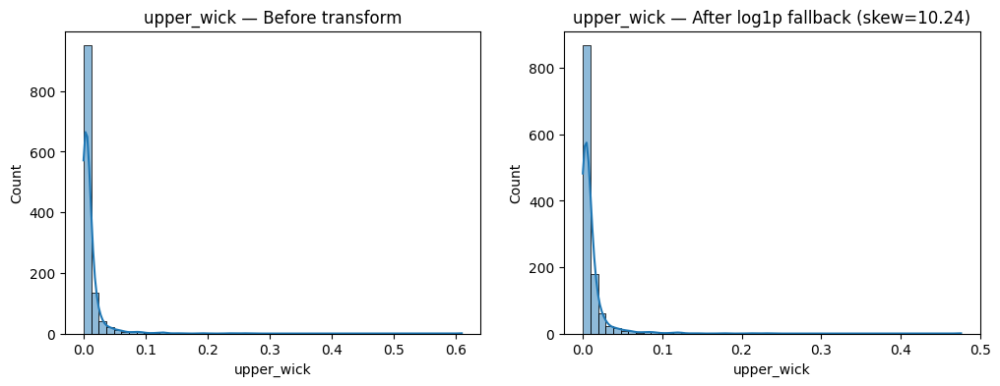

volume_lag_5_std_3: skewness before = 6.57


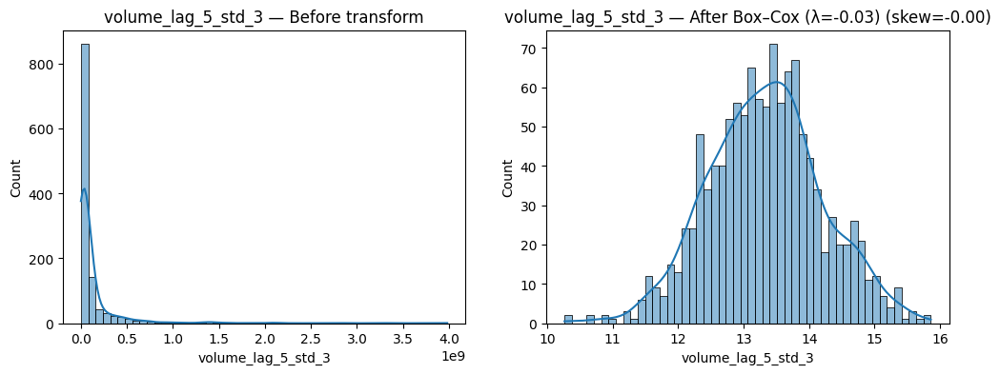

volume_lag_30_std_3: skewness before = 6.54


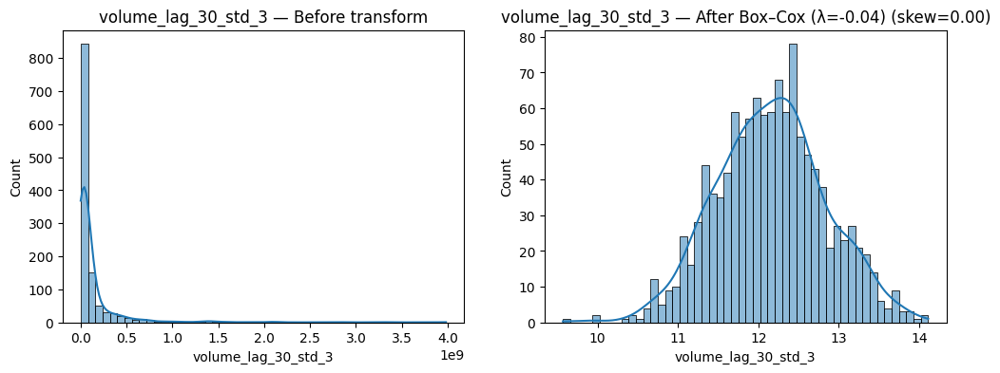

volume_lag_15_std_3: skewness before = 6.54


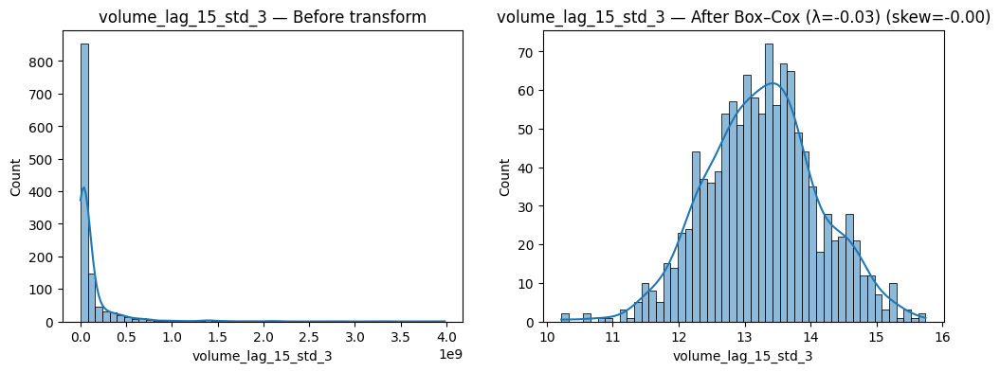

volume_lag_50_std_3: skewness before = 6.49


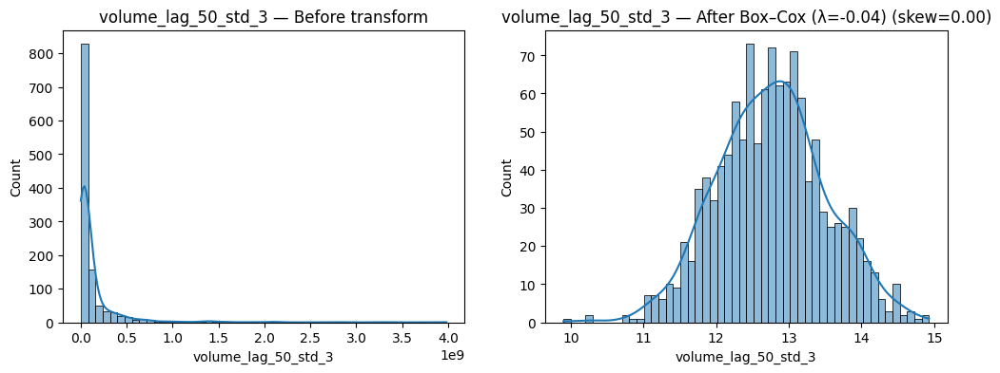

candle_body: skewness before = 6.21


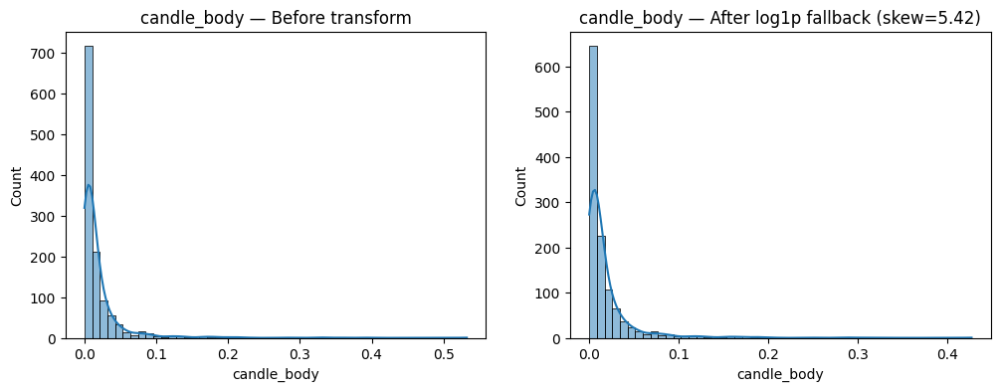

lower_wick: skewness before = 5.94


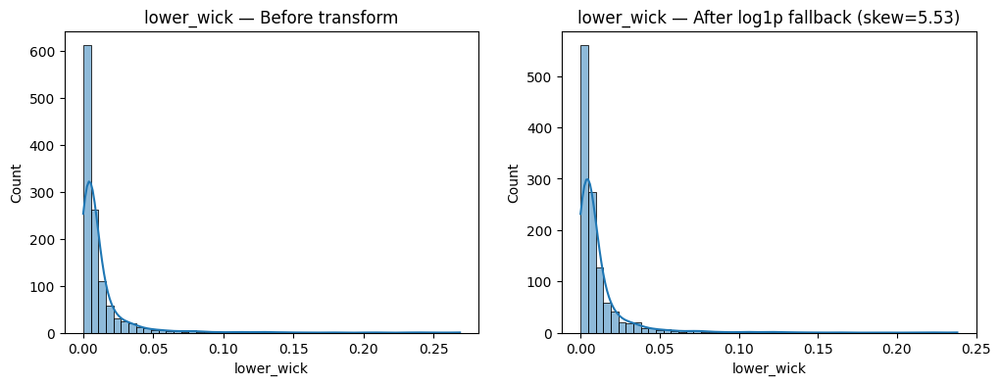

candle_range: skewness before = 5.82


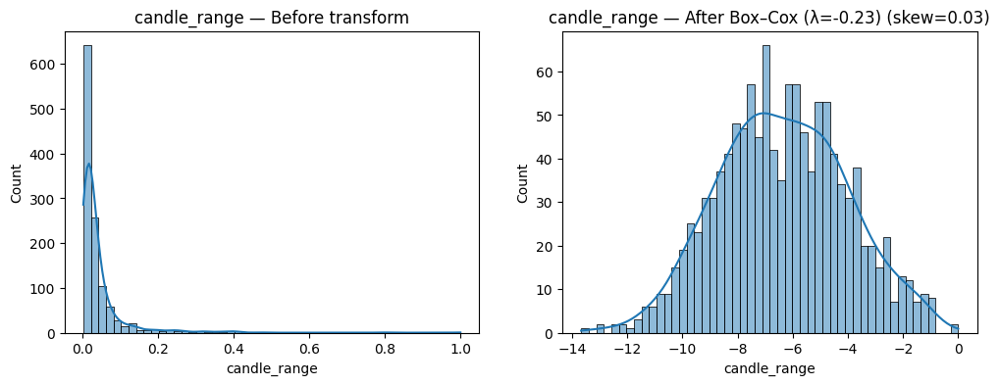

volume_lag_5_std_5: skewness before = 5.52


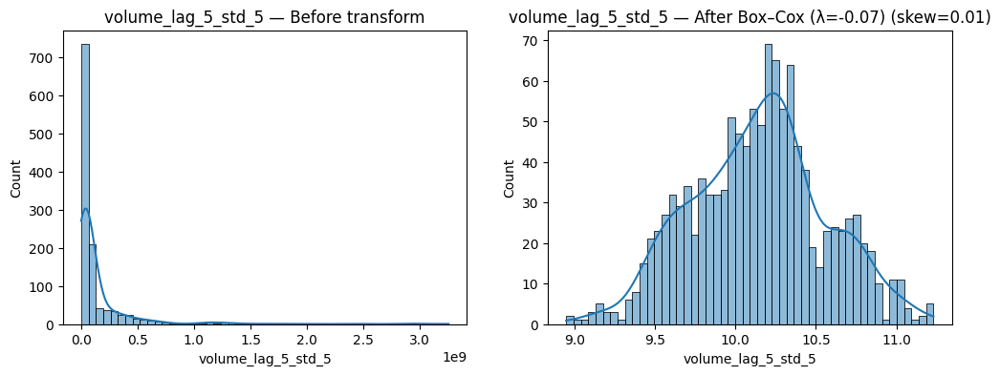

volume_lag_30_std_5: skewness before = 5.50


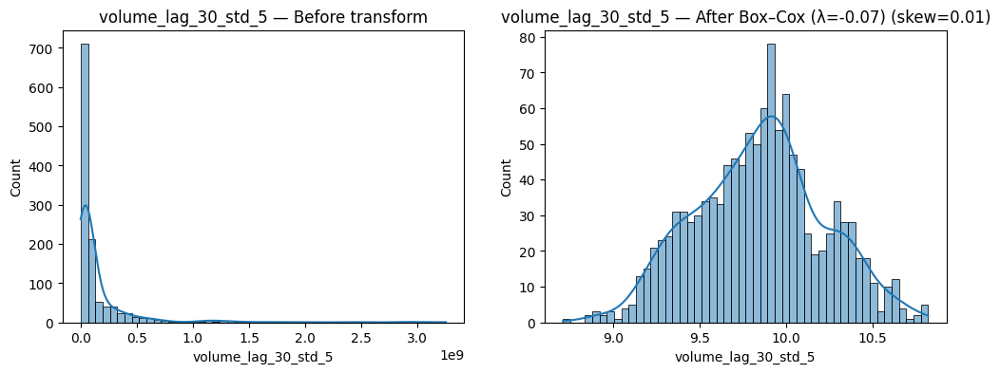

volume_lag_15_std_5: skewness before = 5.50


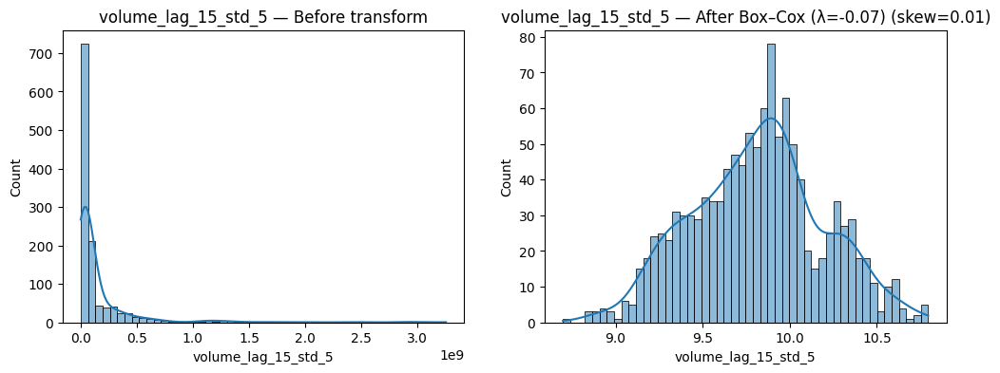

volume_lag_50_std_5: skewness before = 5.47


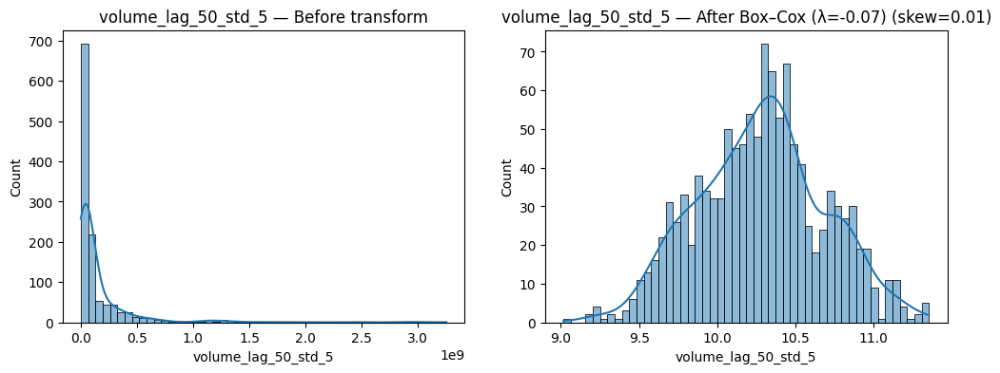

upper_bb_15_minus_close: skewness before = 5.15


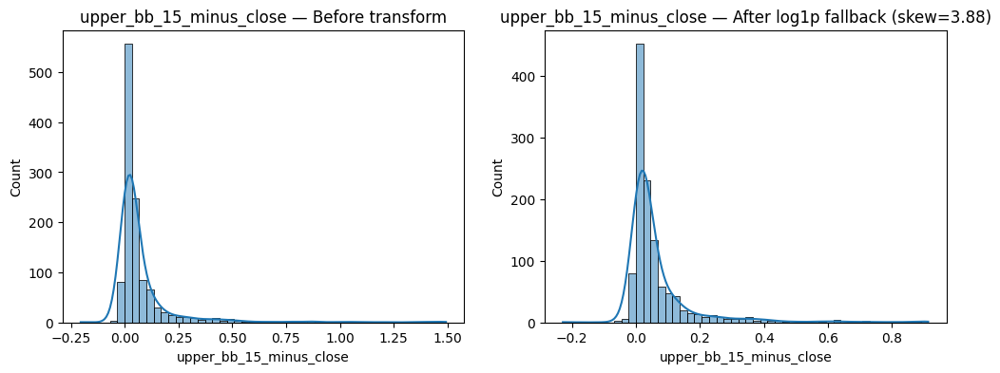

upper_bb_15_minus_close_lag_1: skewness before = 5.11


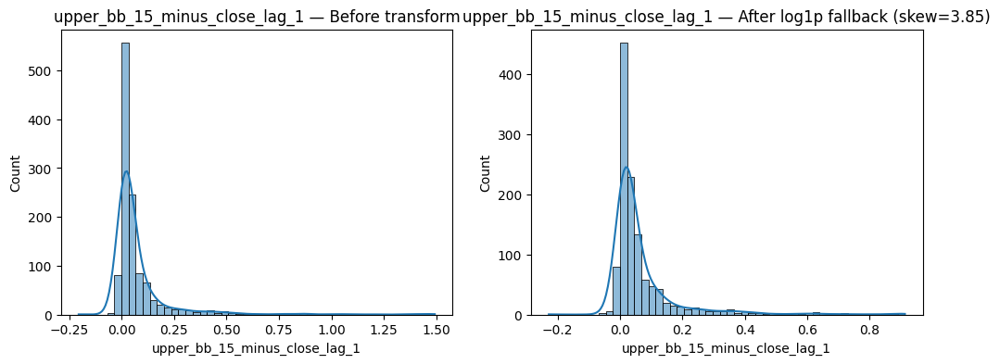

range_pct_prev_close: skewness before = 5.07


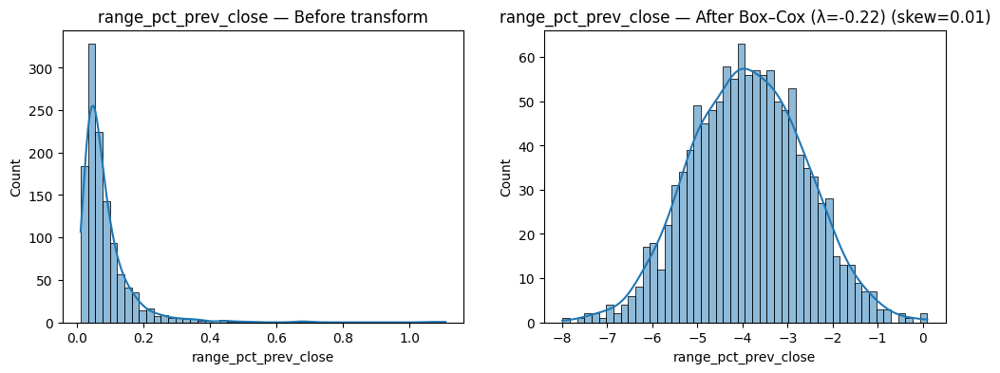

volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_5: skewness before = 5.05
⚠️  Could not transform volume_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is

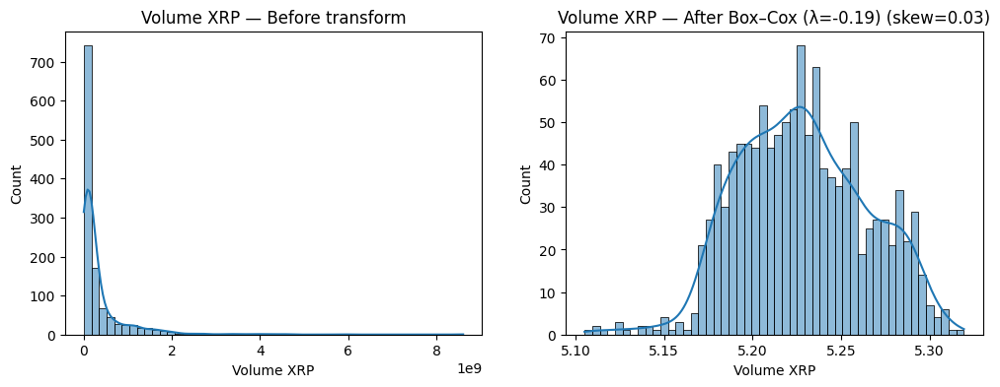

volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
volume_lag_15: skewness before = 5.00
⚠️  Could not transform volume_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-uniqu

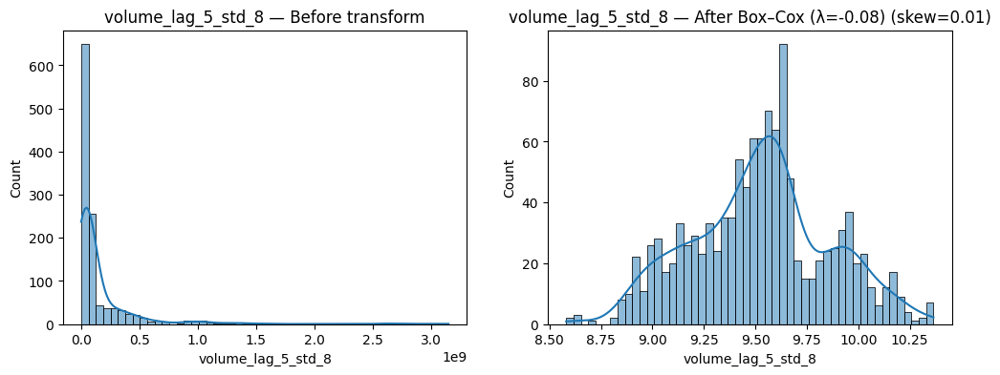

volume_lag_30_std_8: skewness before = 4.90


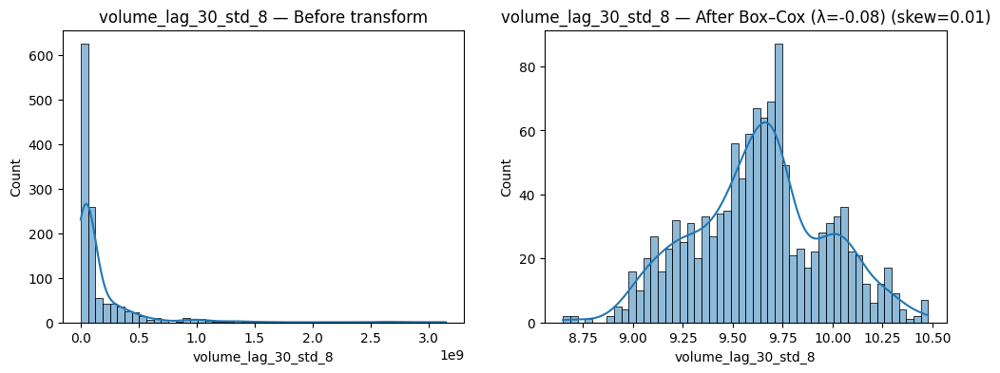

volume_lag_15_std_8: skewness before = 4.89


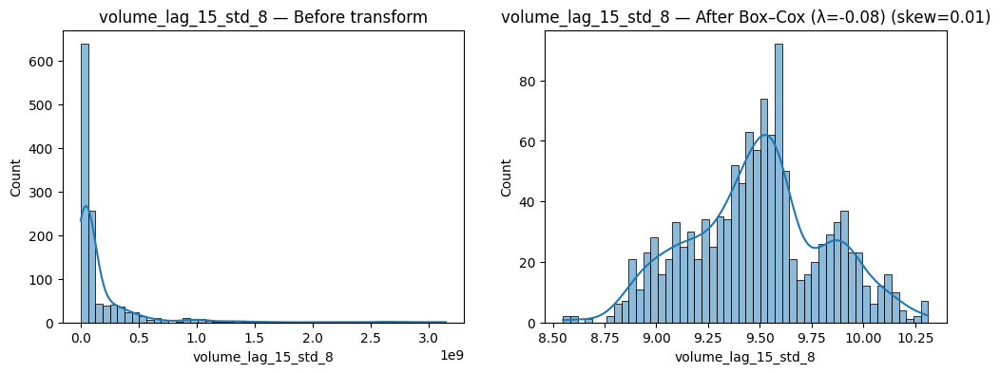

volume_lag_50_std_8: skewness before = 4.88


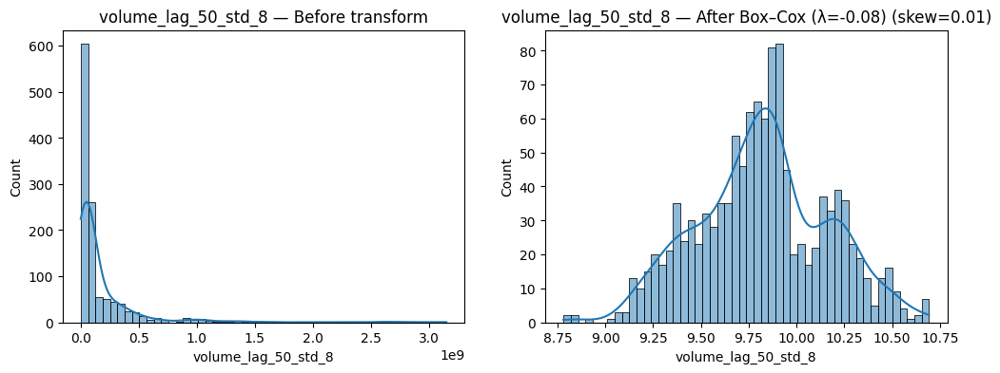

close_lag_5_std_3: skewness before = 4.67


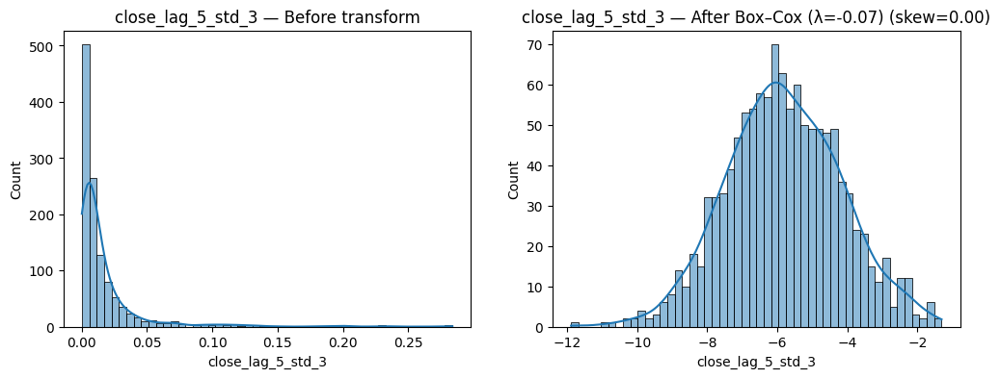

Volume USDT: skewness before = 4.49


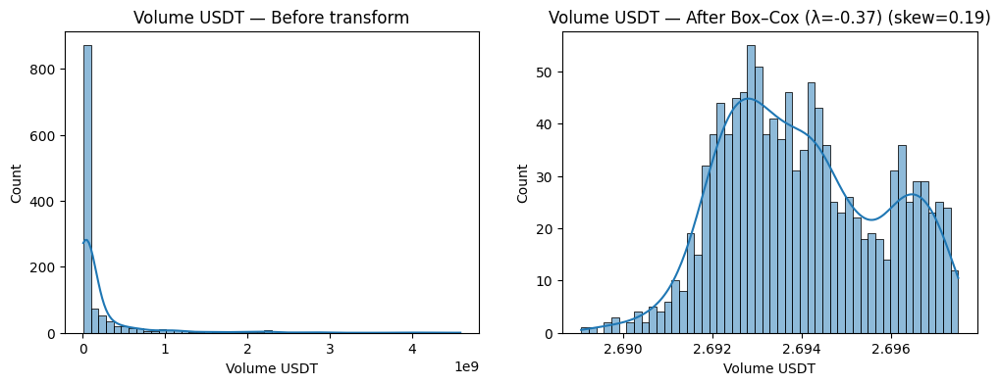

close_lag_15_std_3: skewness before = 4.47


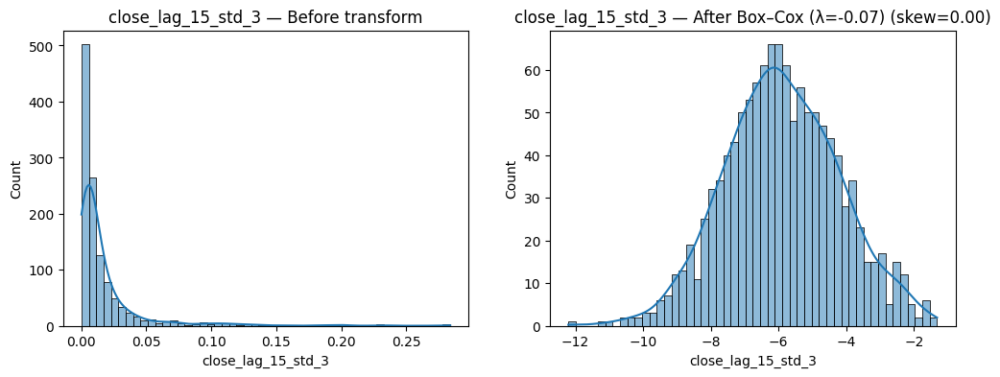

close_lag_30_std_3: skewness before = 4.36


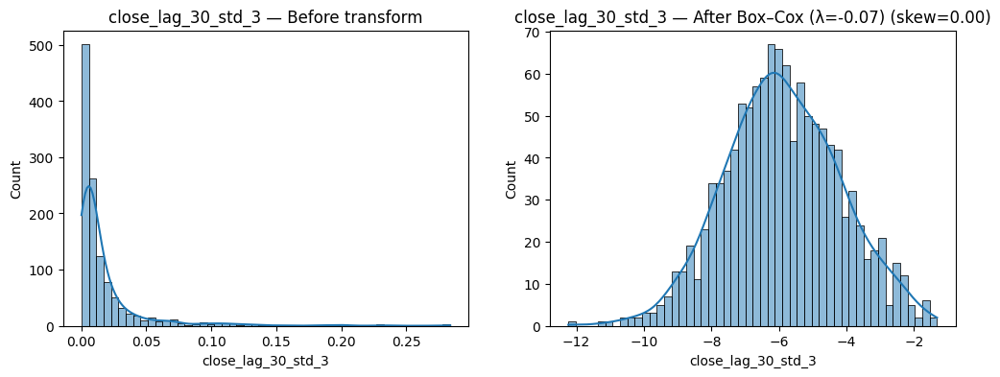

close_lag_50_std_3: skewness before = 4.21


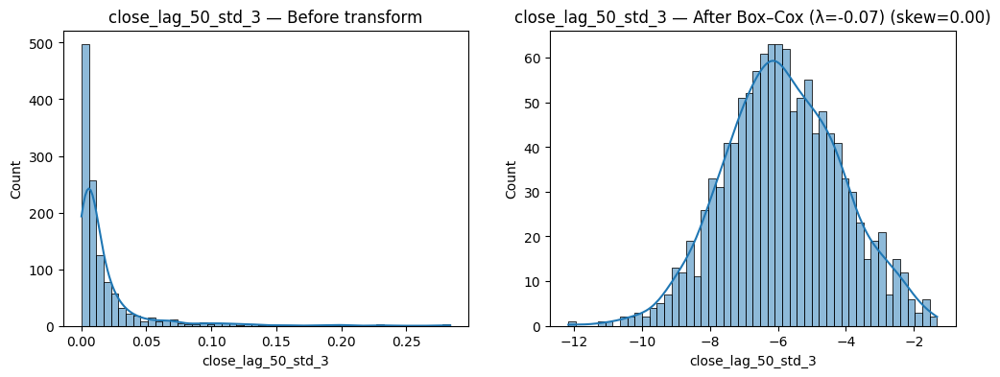

close_lag_5_std_5: skewness before = 3.90


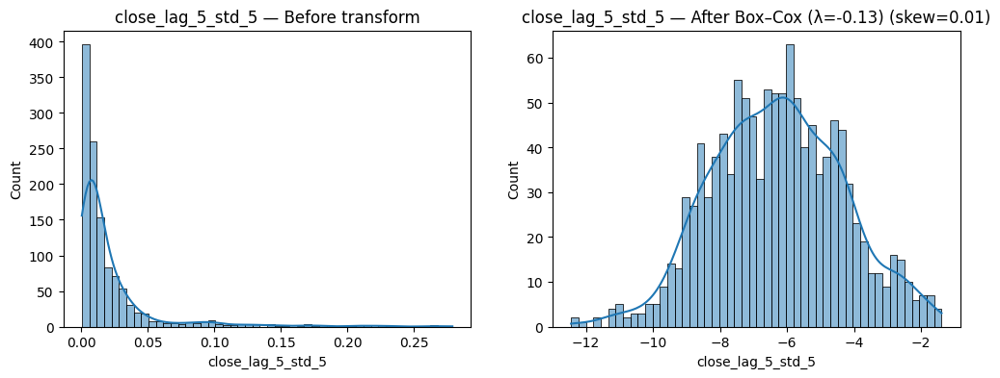

volume_lag_5_ma_3_delta: skewness before = 3.83


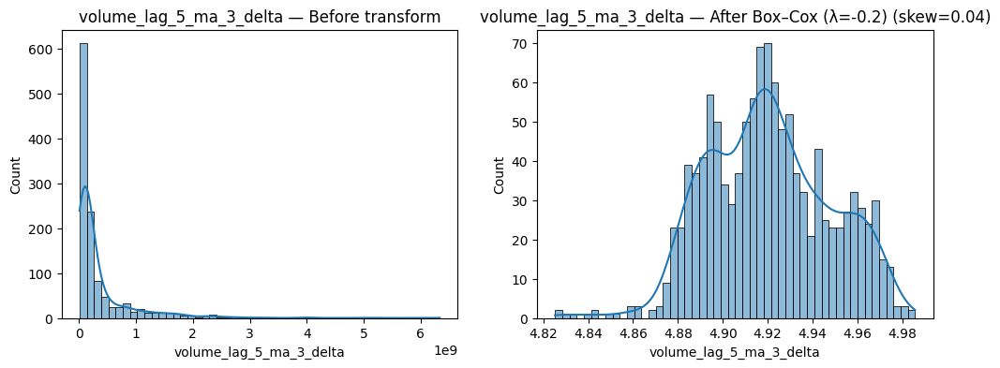

volume_lag_5_ma_3: skewness before = 3.83


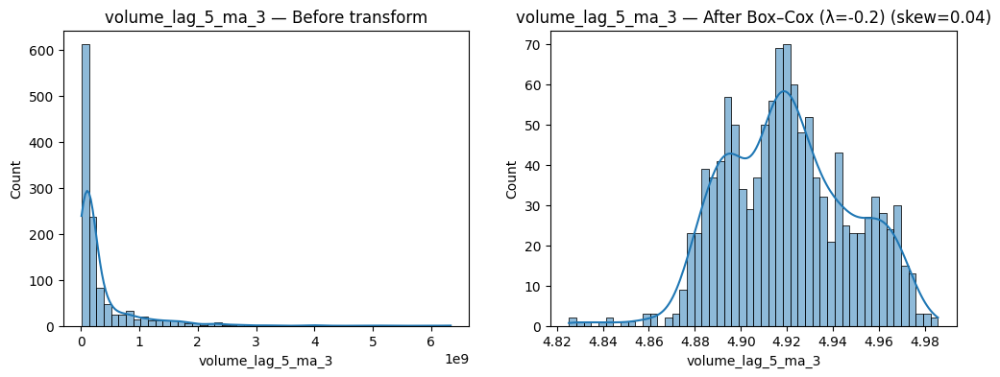

close_lag_5_std_8: skewness before = 3.83


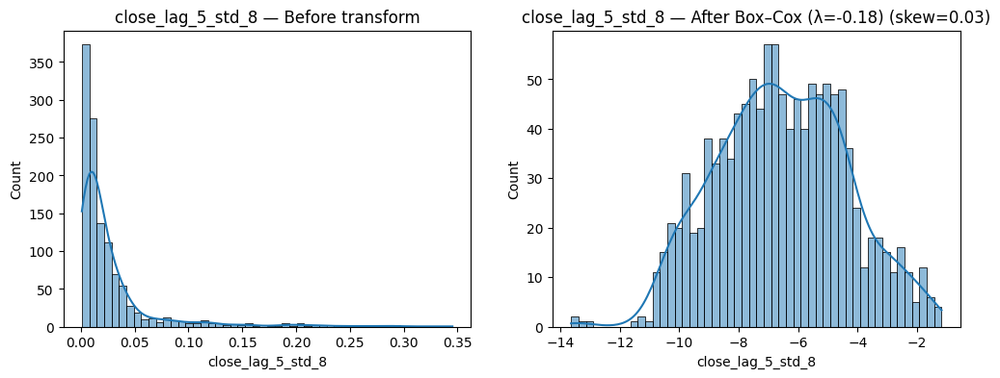

volume_lag_15_ma_3: skewness before = 3.78


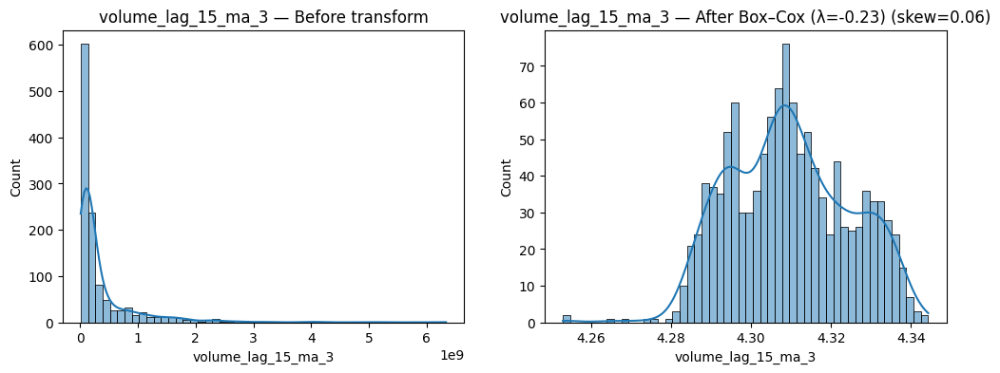

volume_lag_5_std_15: skewness before = 3.76


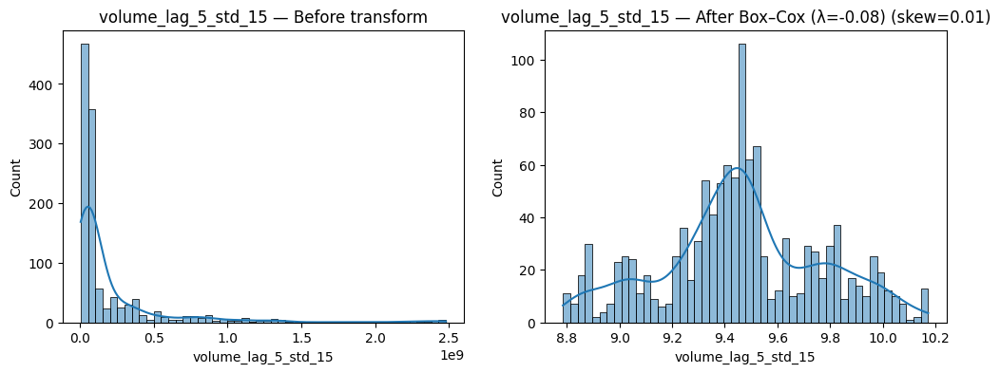

volume_lag_30_ma_3: skewness before = 3.75


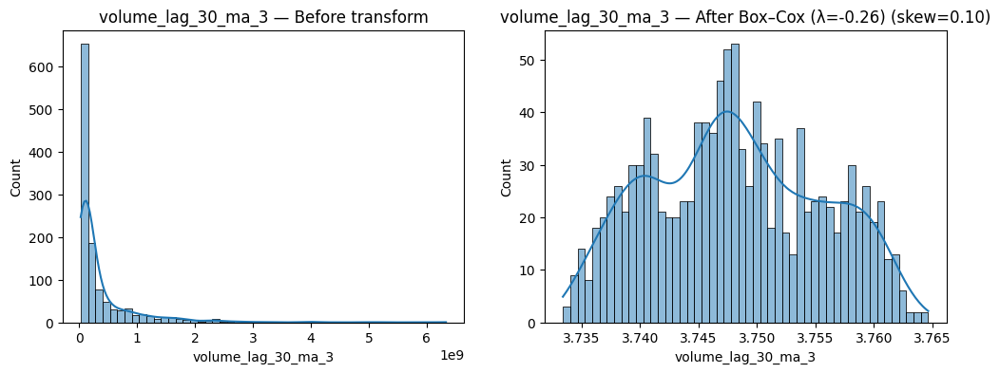

volume_lag_15_std_15: skewness before = 3.75


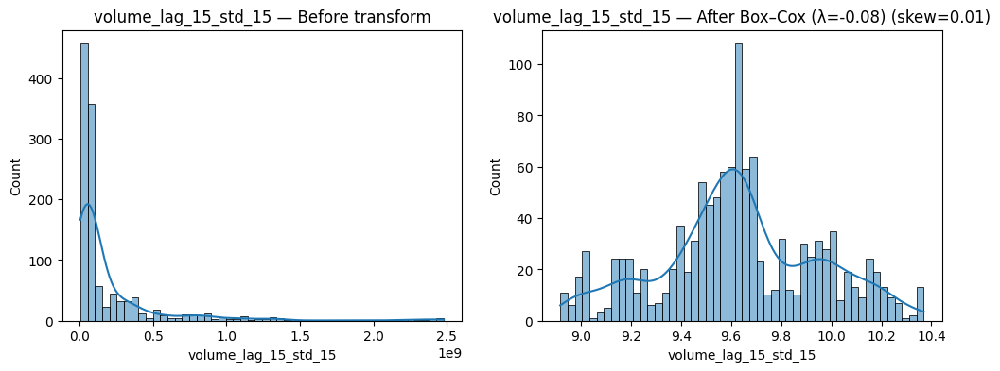

volume_lag_30_std_15: skewness before = 3.75


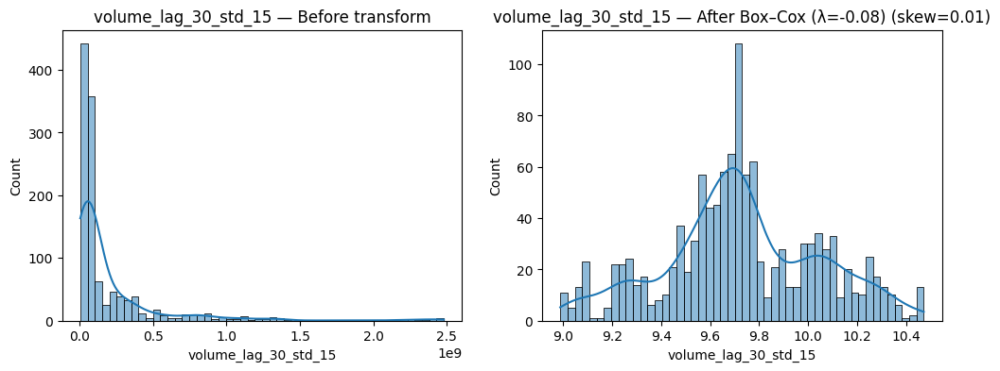

volume_lag_50_std_15: skewness before = 3.74


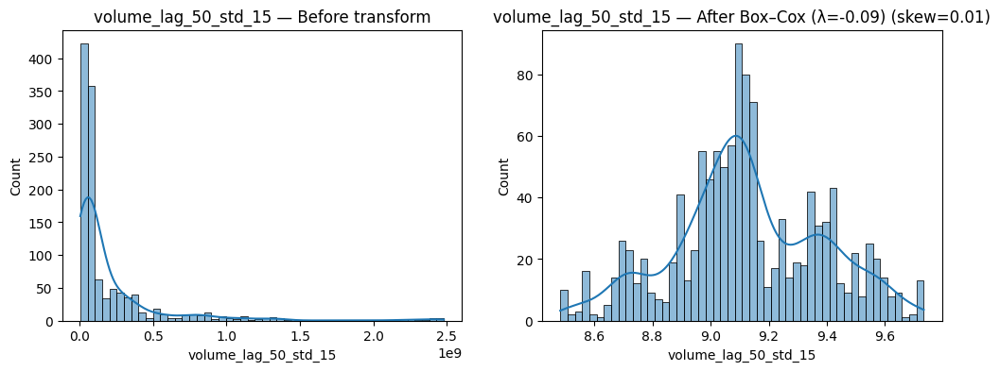

volume_lag_50_ma_3: skewness before = 3.73


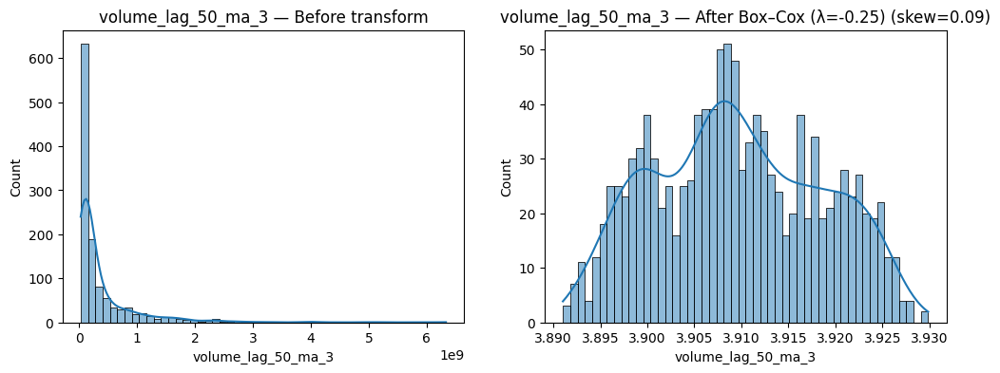

upper_bb_30_minus_close: skewness before = 3.72


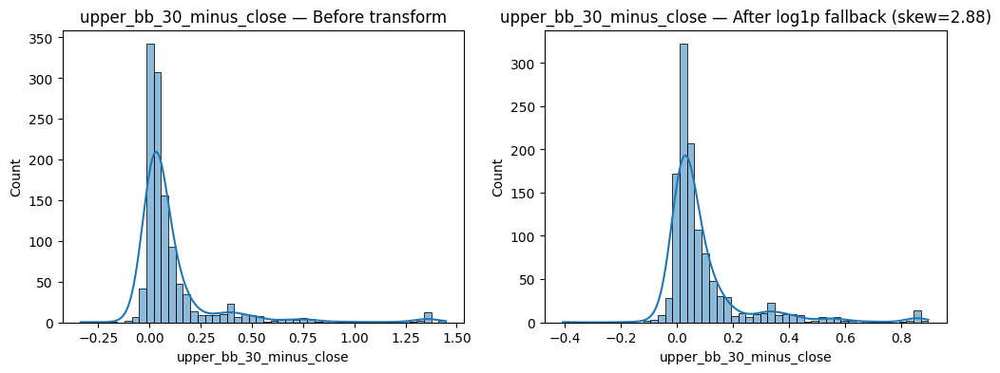

close_lag_15_std_5: skewness before = 3.70


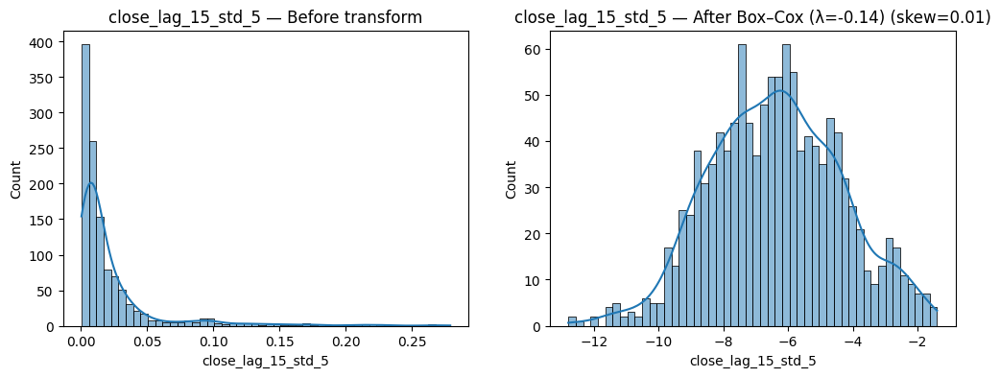

bollinger_bandwidth_15: skewness before = 3.69


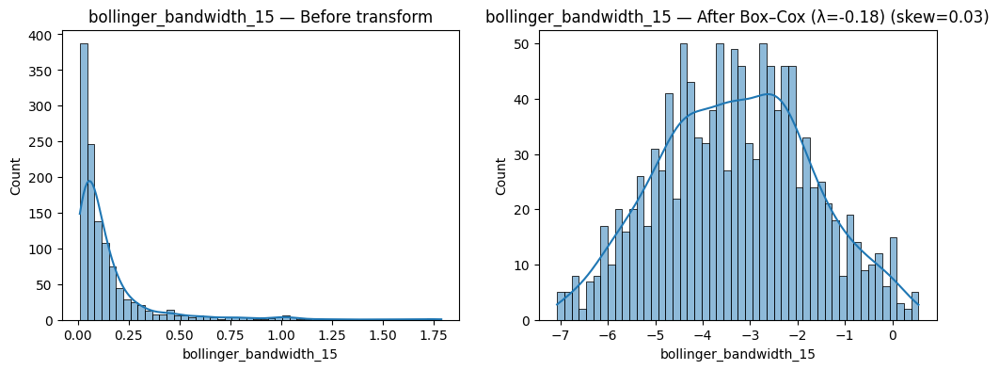

upper_bb_30_minus_close_lag_1: skewness before = 3.69


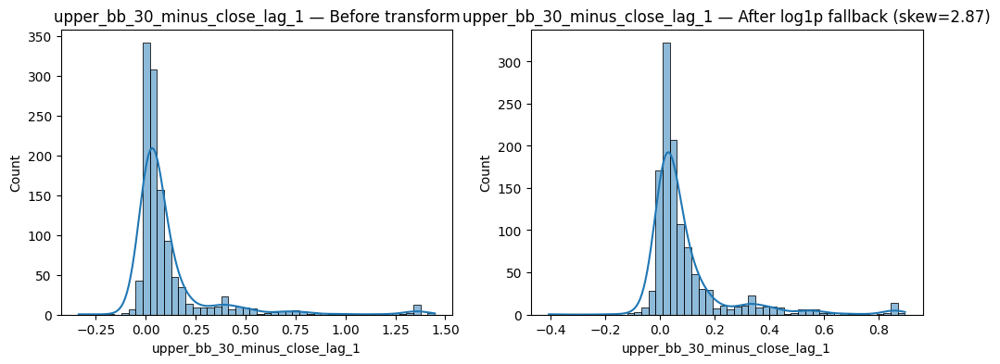

bollinger_bandwidth_15_lag_1: skewness before = 3.67


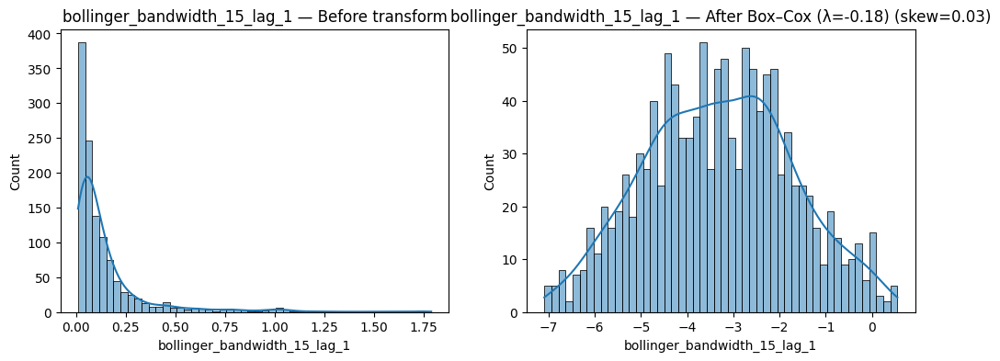

atr_lag5_3: skewness before = 3.65


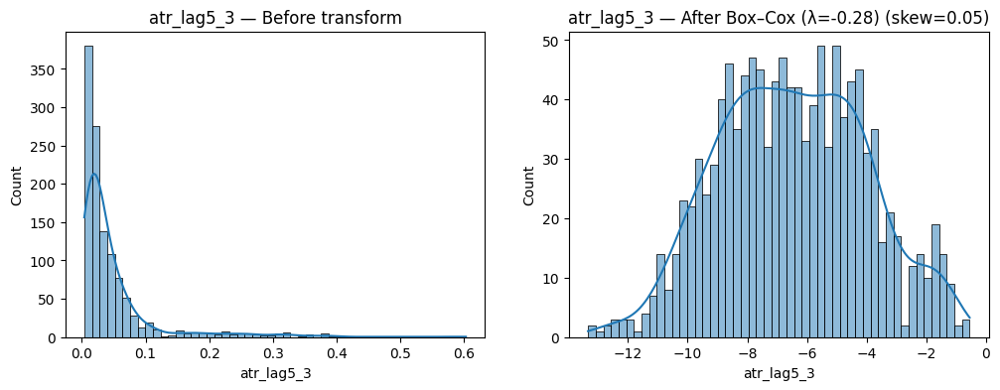

close_lag_15_std_8: skewness before = 3.63


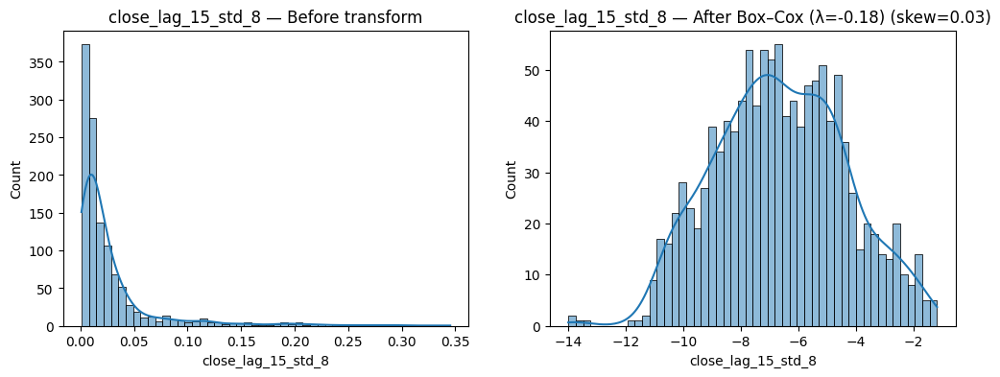

close_lag_30_std_5: skewness before = 3.62


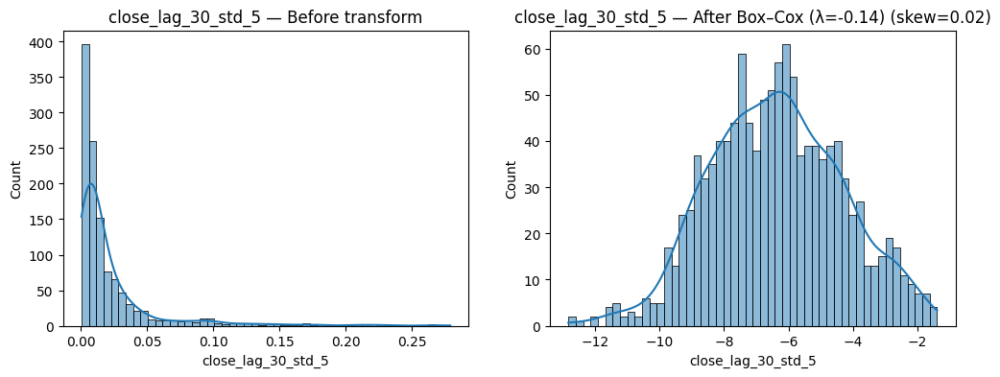

close_lag_5_std_15: skewness before = 3.57


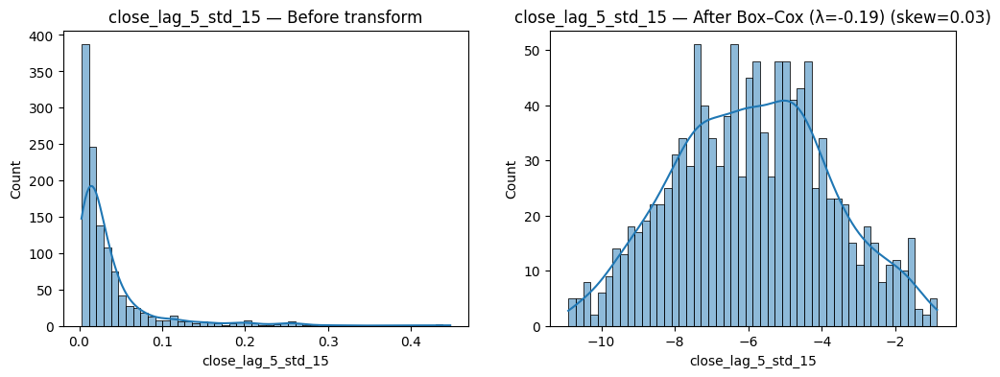

close_lag_30_std_8: skewness before = 3.57


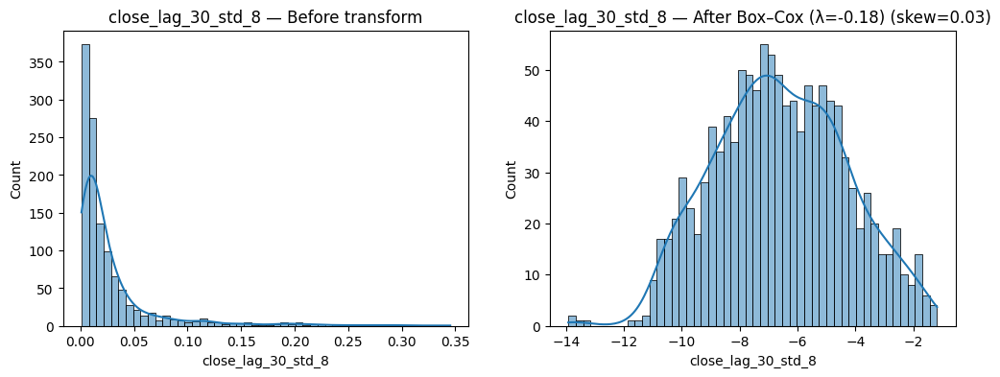

atr_lag15_3: skewness before = 3.51


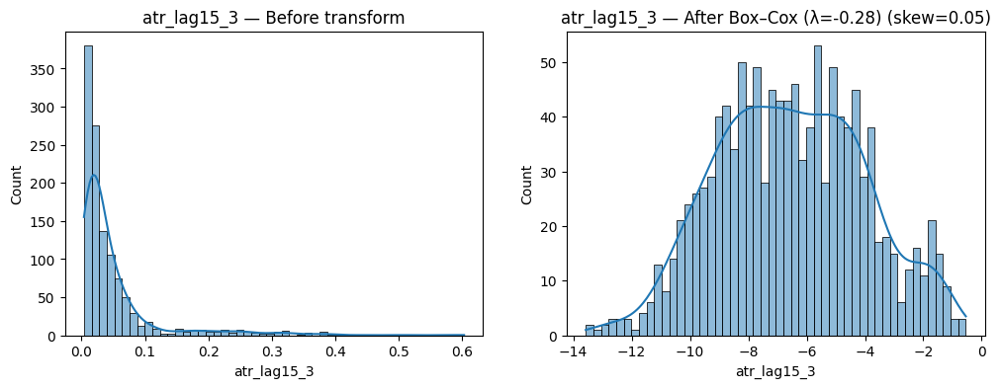

close_lag_50_std_5: skewness before = 3.48


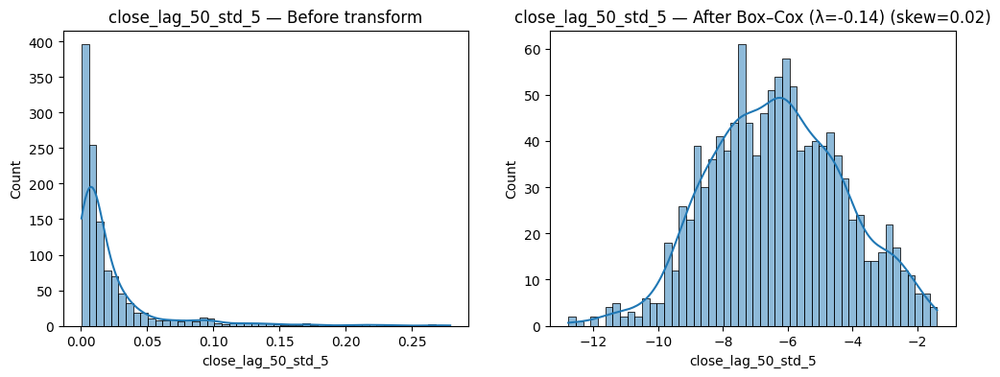

volume_lag_50_ma_3_delta: skewness before = 3.46


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


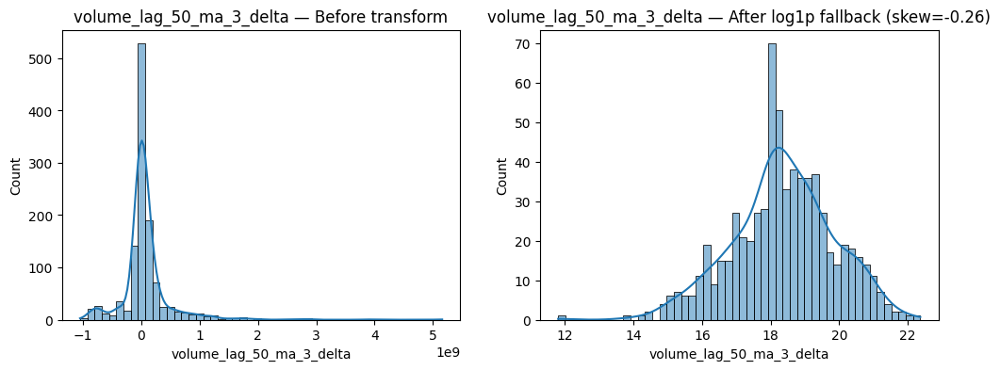

close_lag_15_std_15: skewness before = 3.46


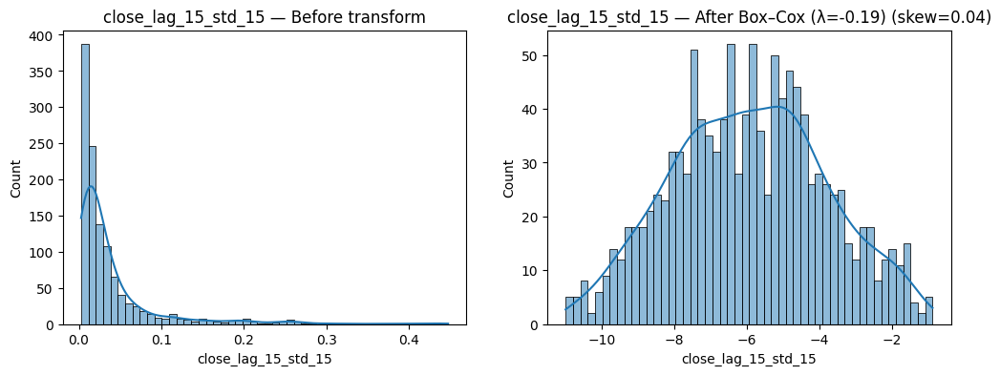

atr_lag5_5: skewness before = 3.46


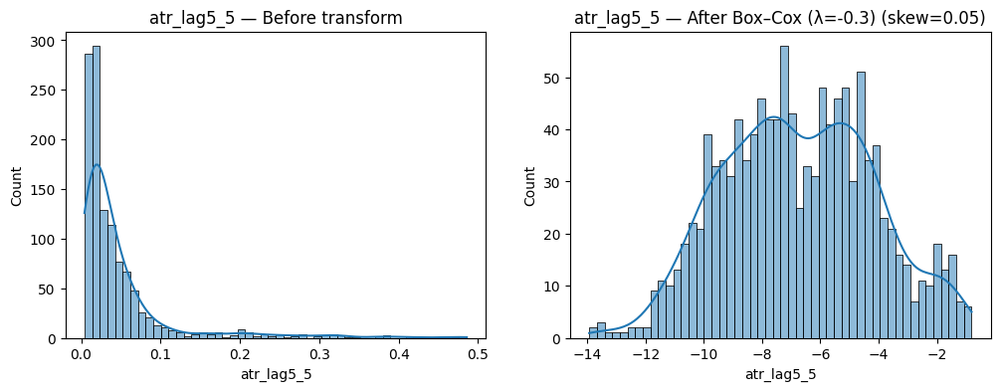

close_lag_50_std_8: skewness before = 3.43


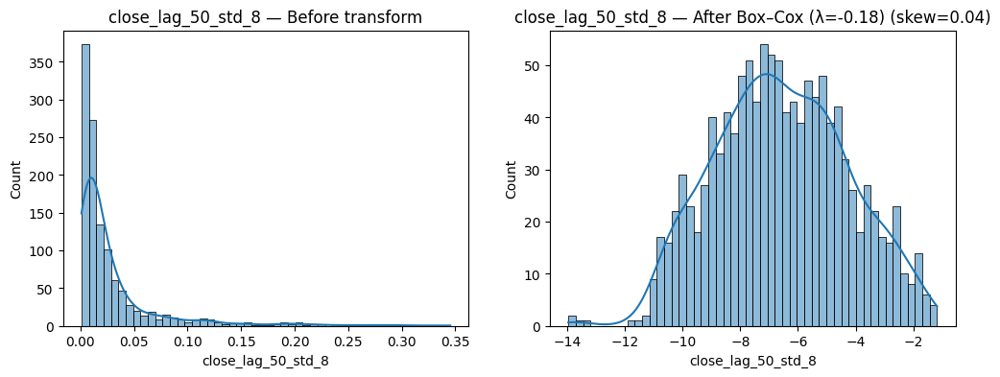

atr_lag30_3: skewness before = 3.41


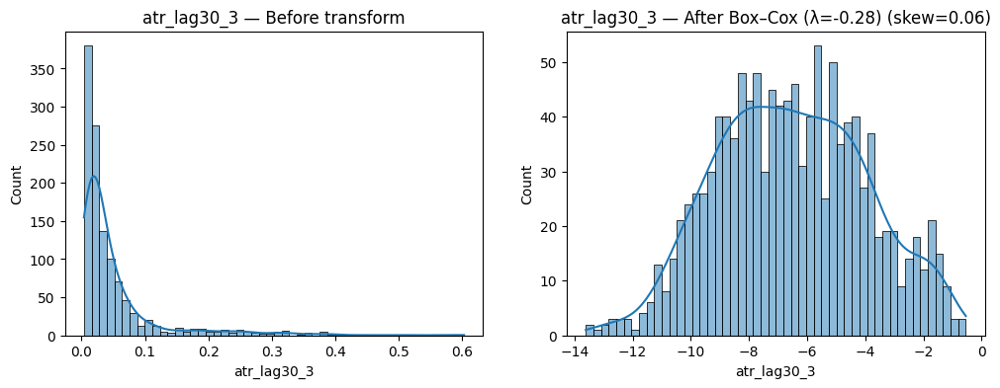

close_lag_30_std_15: skewness before = 3.41


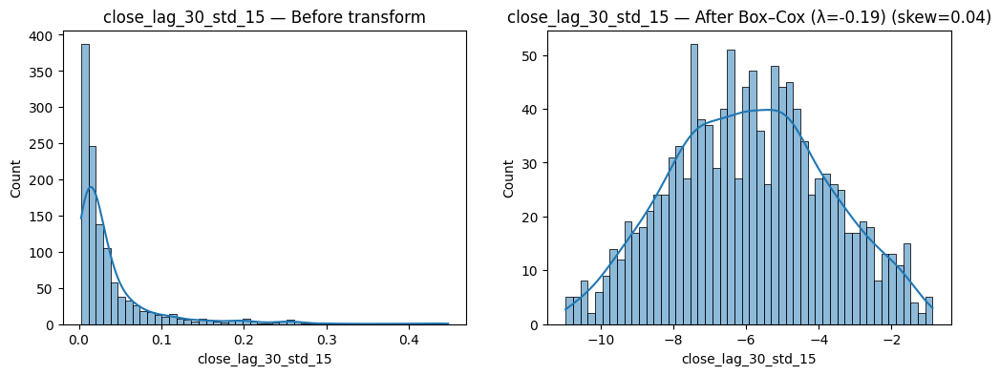

atr_lag5_8: skewness before = 3.33


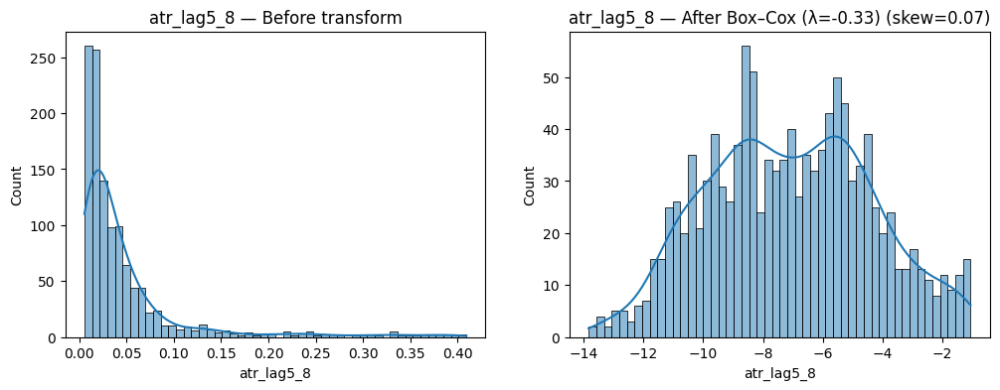

close_lag_50_std_15: skewness before = 3.33


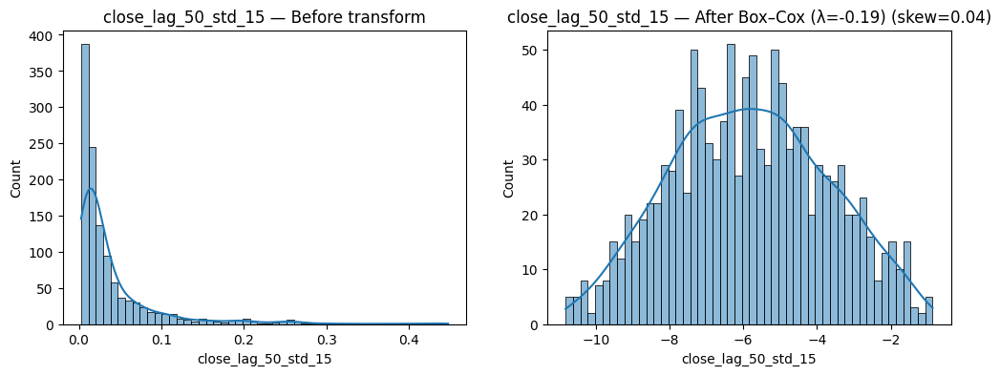

atr_lag15_5: skewness before = 3.31


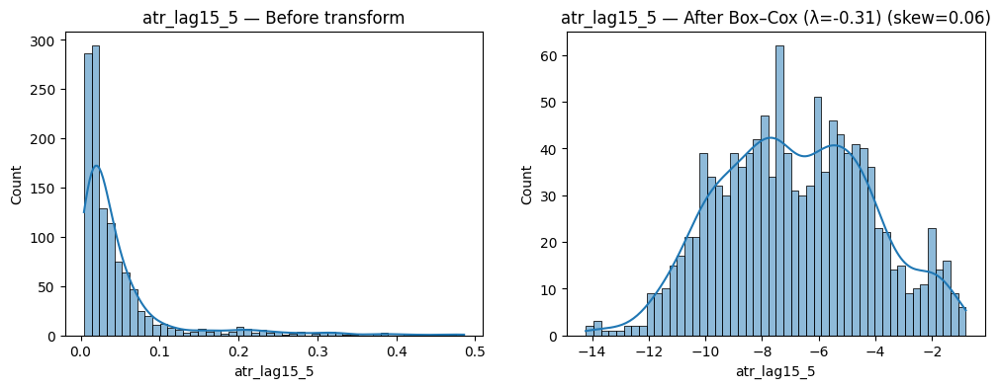

close_lag_5_std_21: skewness before = 3.30


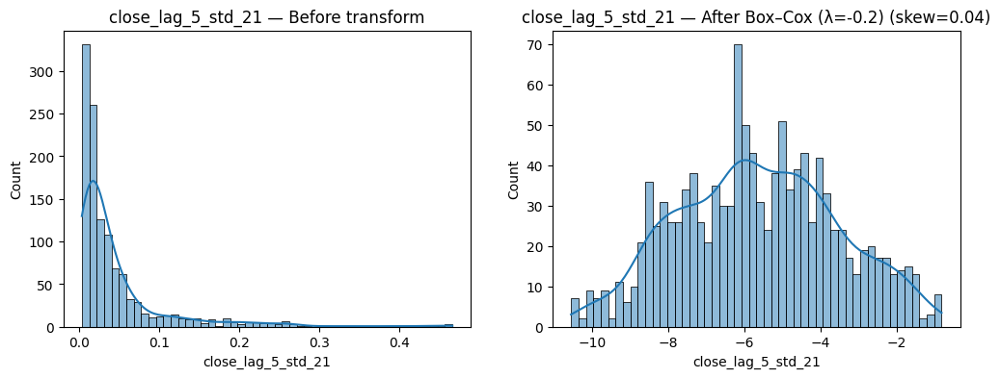

atr_lag50_3: skewness before = 3.27


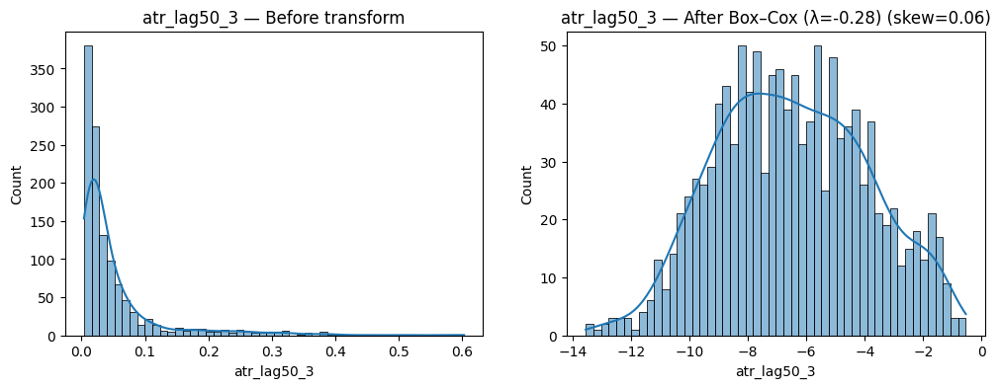

volume_lag_30_ma_3_delta: skewness before = 3.26


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


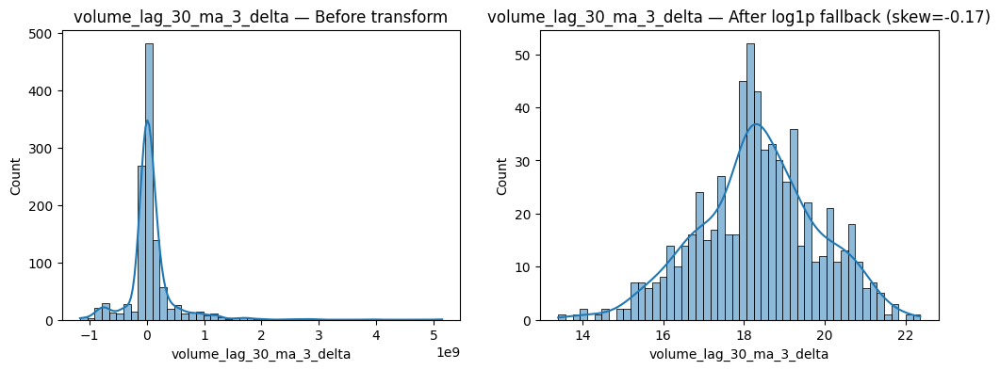

close_lag_15_std_21: skewness before = 3.24


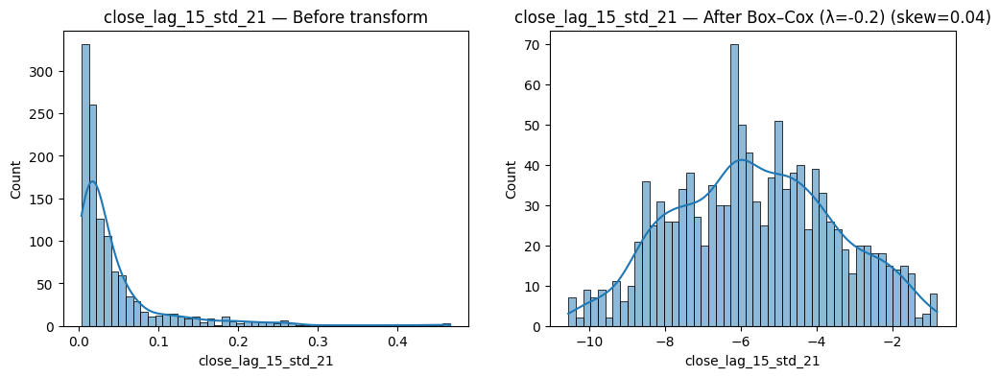

atr_lag30_5: skewness before = 3.22


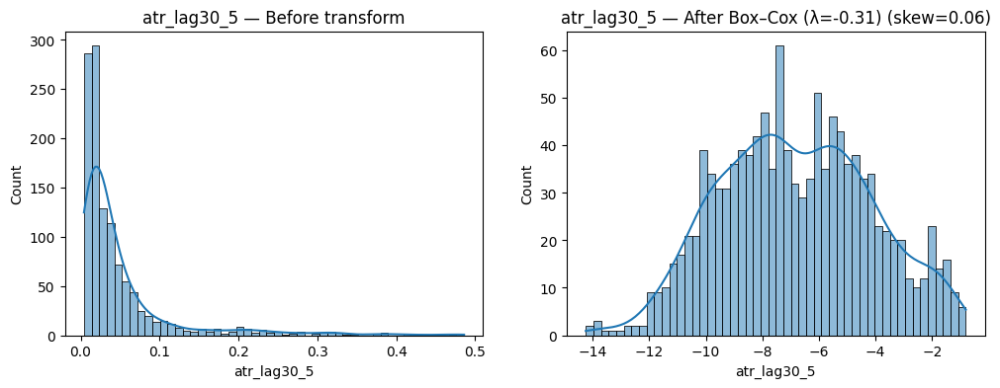

close_lag_30_std_21: skewness before = 3.19


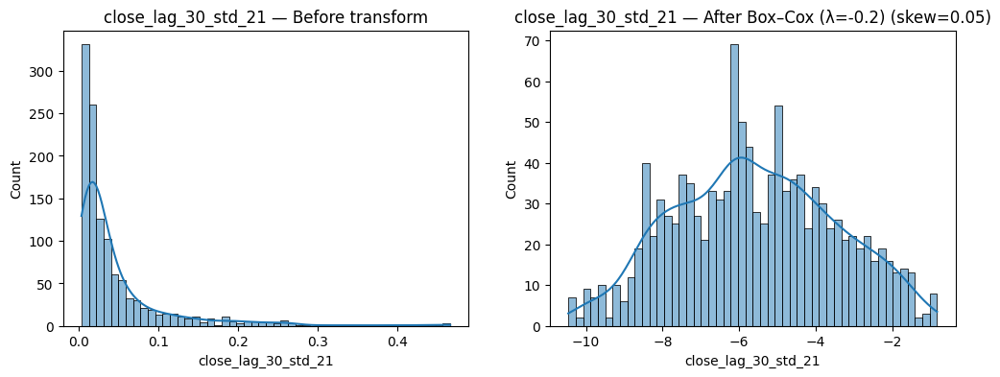

atr_lag15_8: skewness before = 3.17


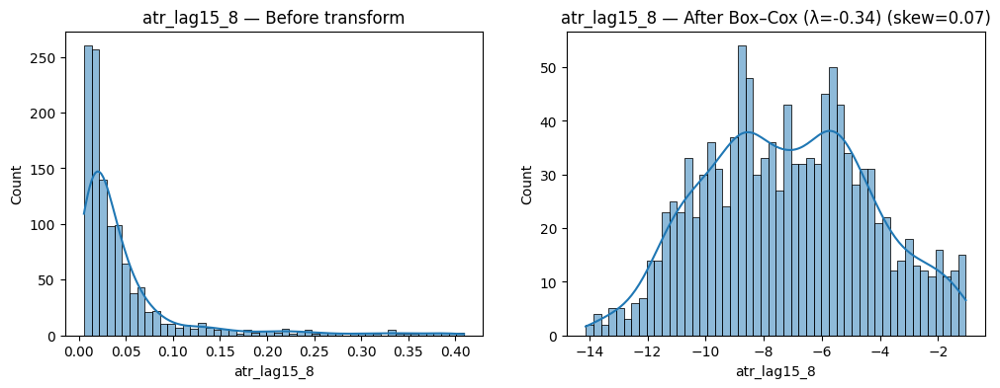

volume_lag_5_ma_5: skewness before = 3.17


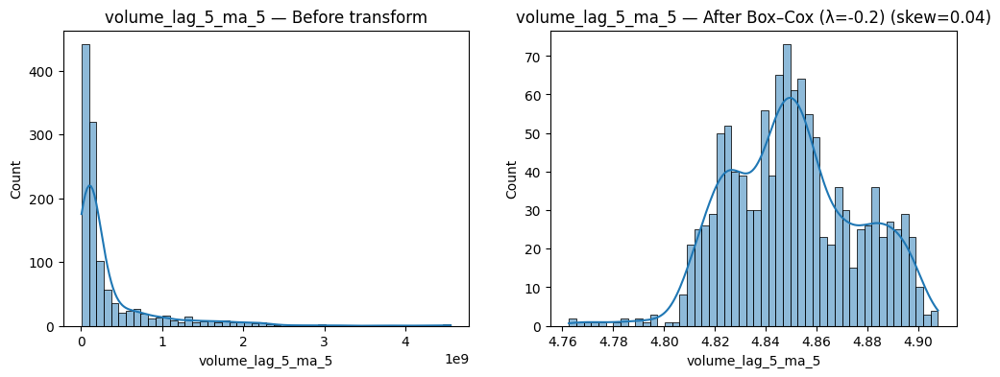

volume_lag_5_std_21: skewness before = 3.13


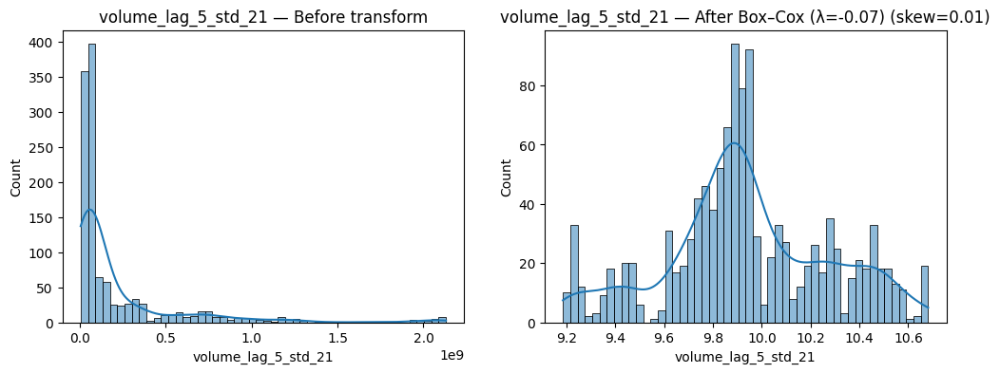

volume_lag_15_std_21: skewness before = 3.13


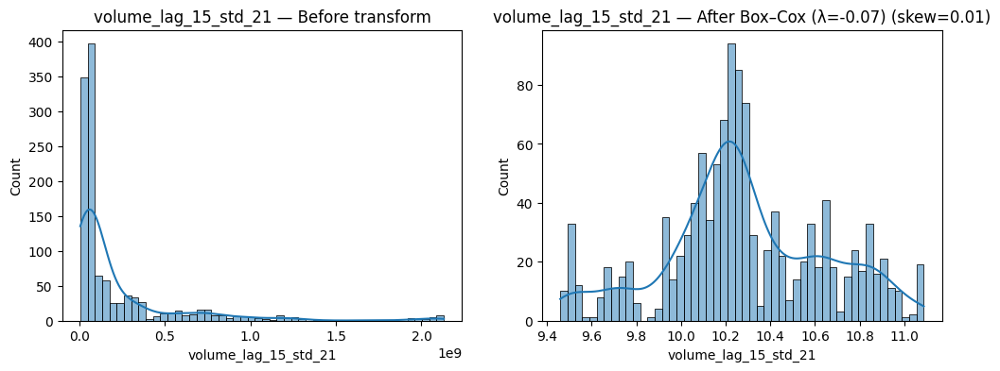

close_lag_50_std_21: skewness before = 3.13


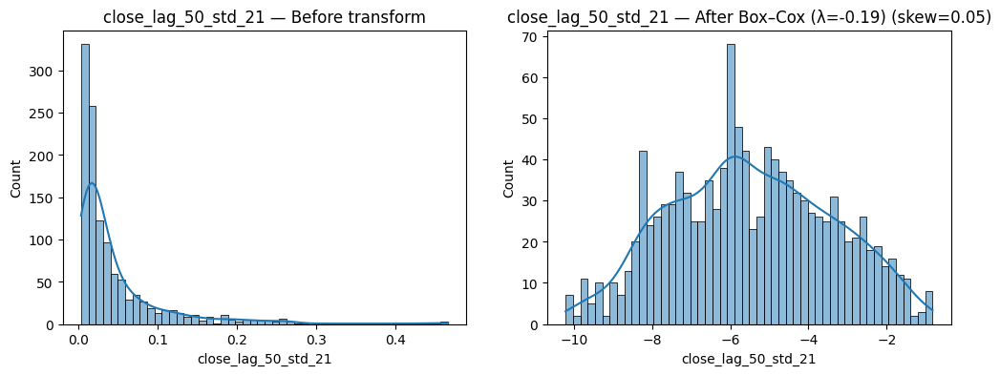

atr_lag5_15: skewness before = 3.13


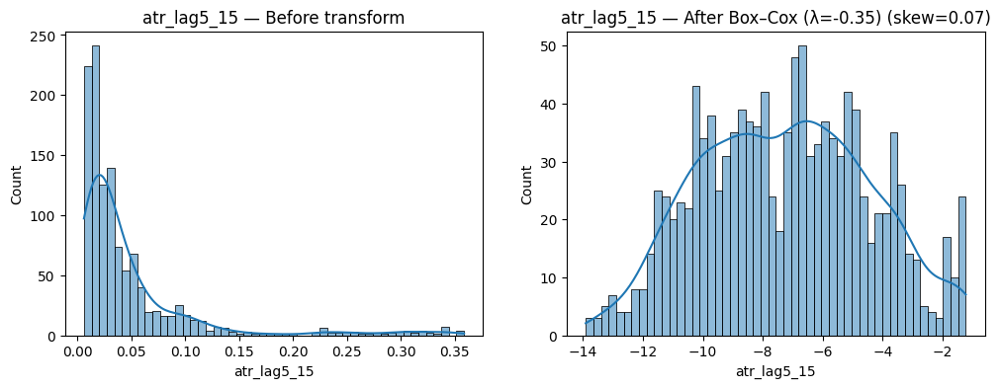

volume_lag_50_std_21: skewness before = 3.13


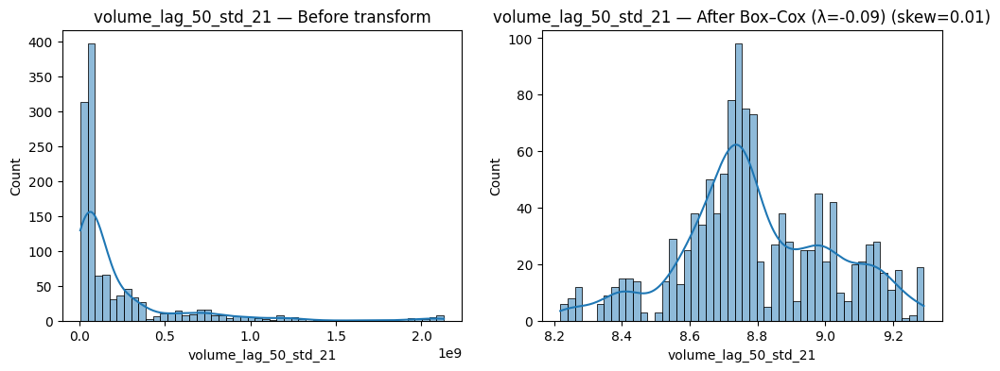

volume_lag_30_std_21: skewness before = 3.13


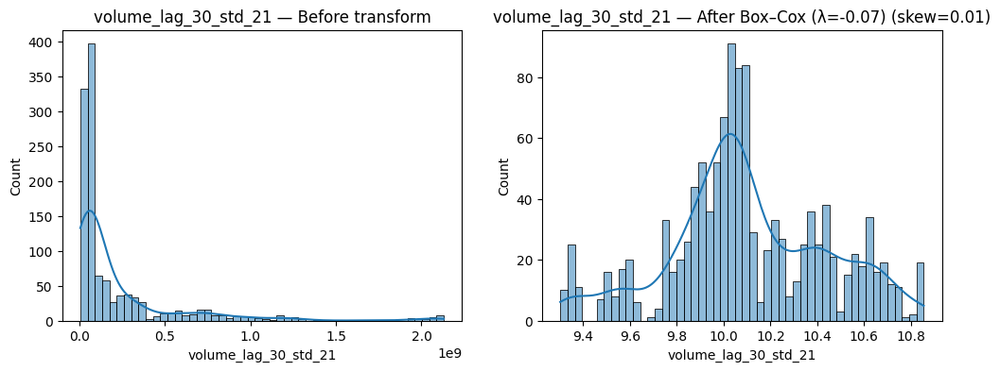

volume_lag_15_ma_5: skewness before = 3.12


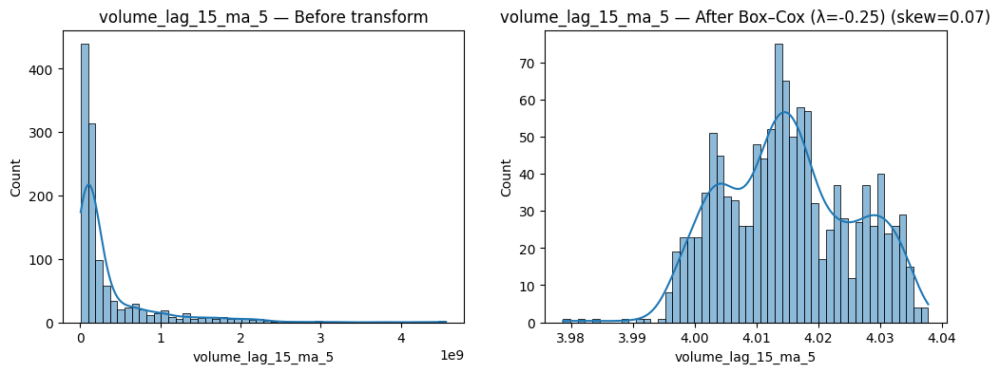

volume_lag_30_ma_5: skewness before = 3.10


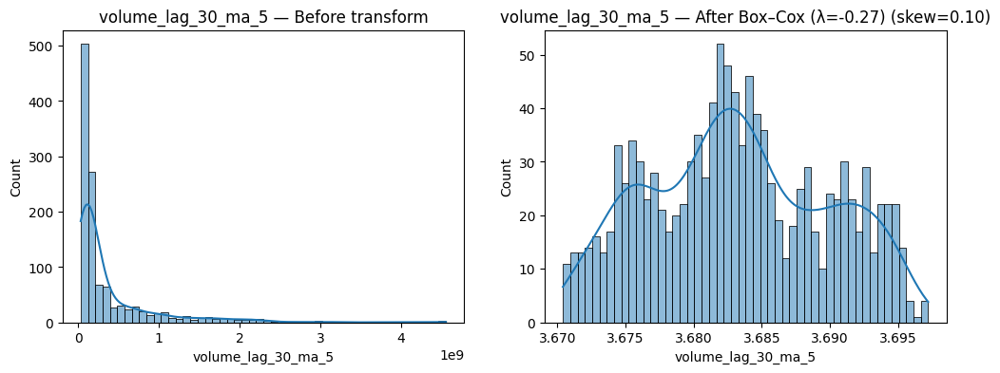

atr_lag30_8: skewness before = 3.09


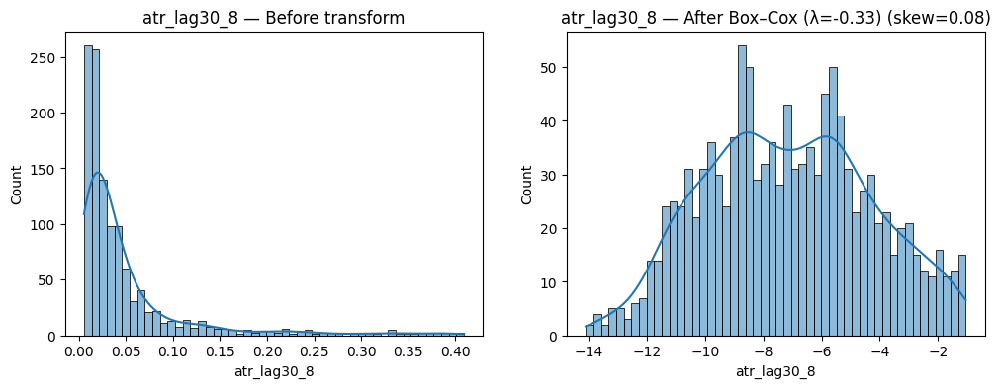

volume_lag_50_ma_5: skewness before = 3.08


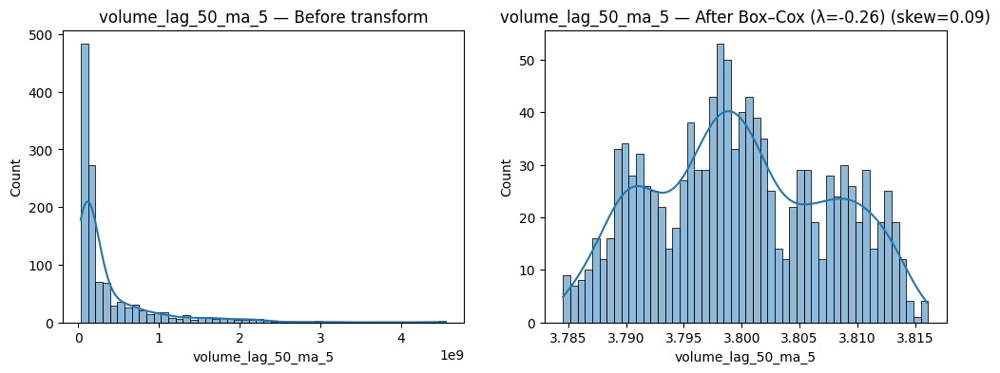

atr_lag50_5: skewness before = 3.08


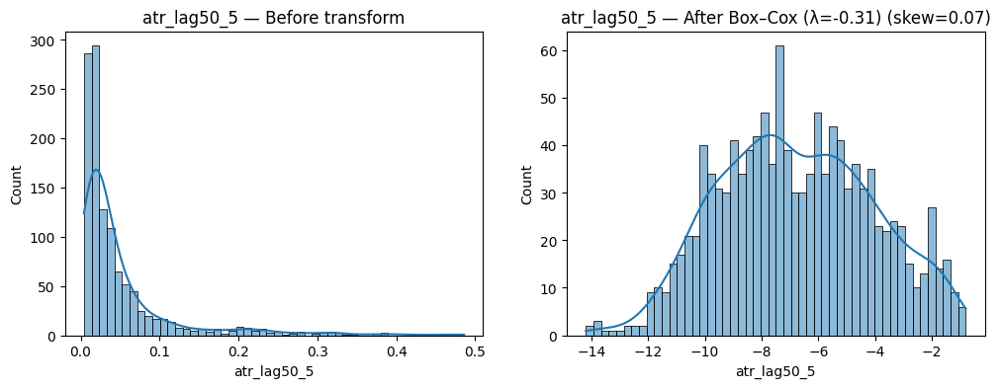

volume_lag_15_ma_3_delta: skewness before = 3.05


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


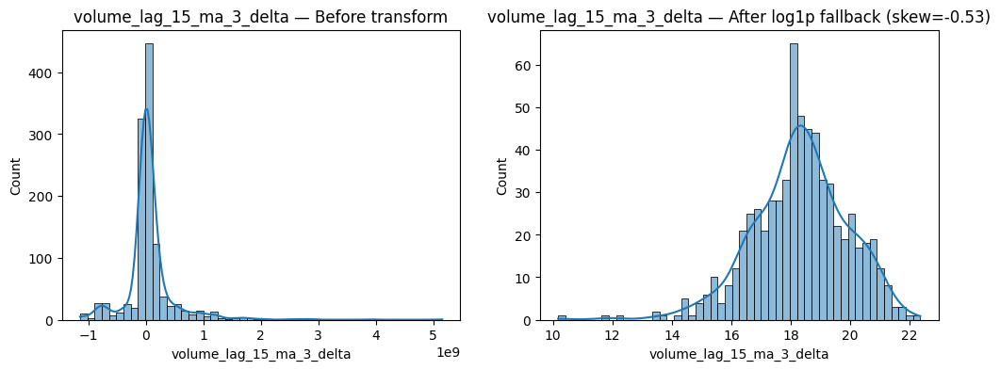

atr_lag15_15: skewness before = 3.01


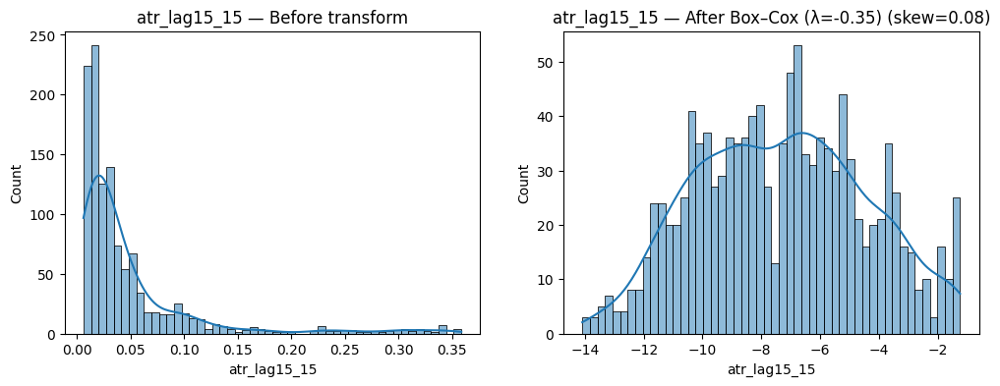

atr_lag5_21: skewness before = 2.97


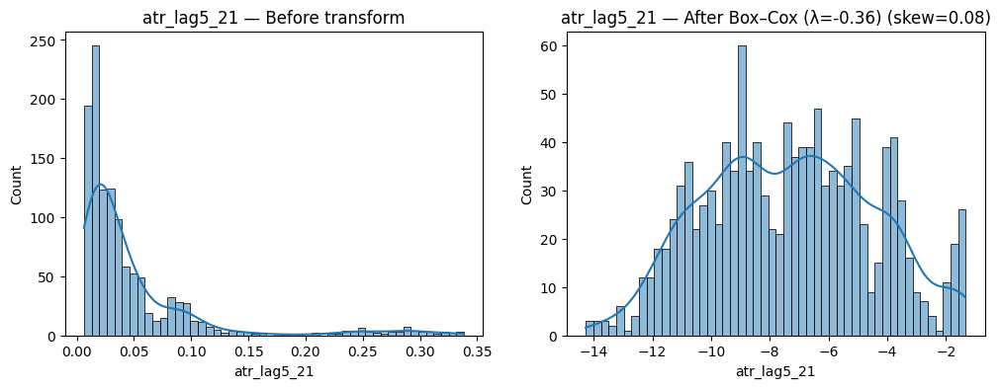

atr_lag50_8: skewness before = 2.95


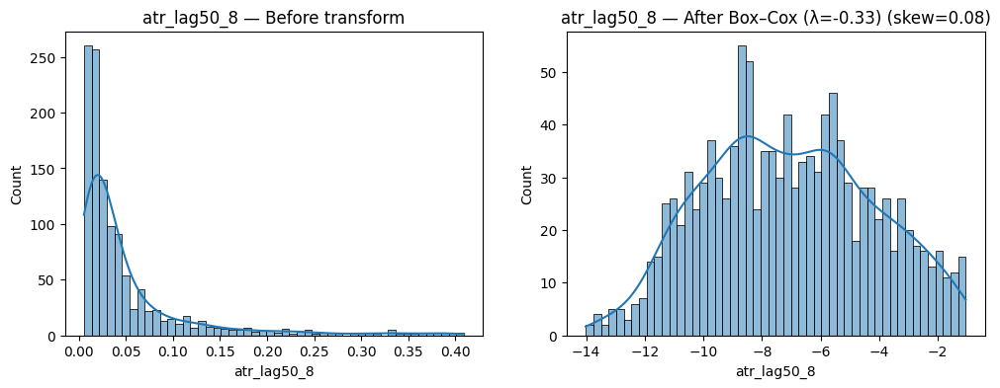

upper_bb_50_minus_close: skewness before = 2.94


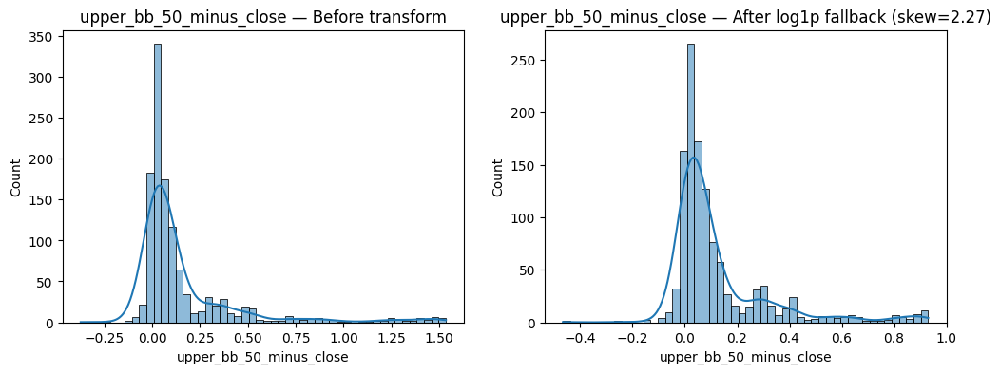

upper_bb_50_minus_close_lag_1: skewness before = 2.93


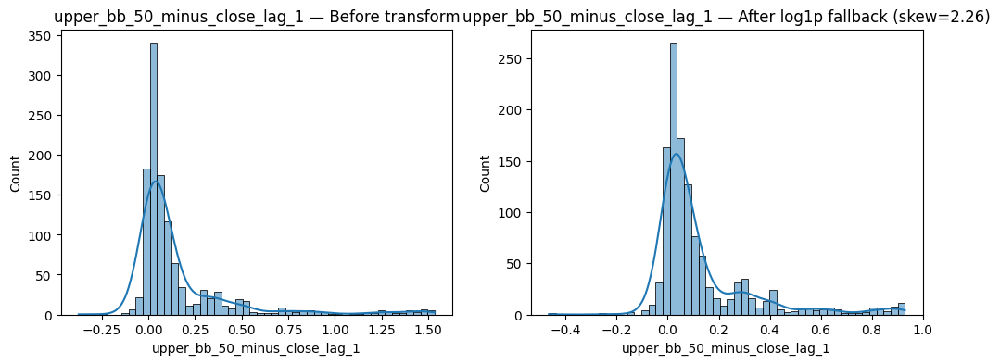

bollinger_bandwidth_30: skewness before = 2.91


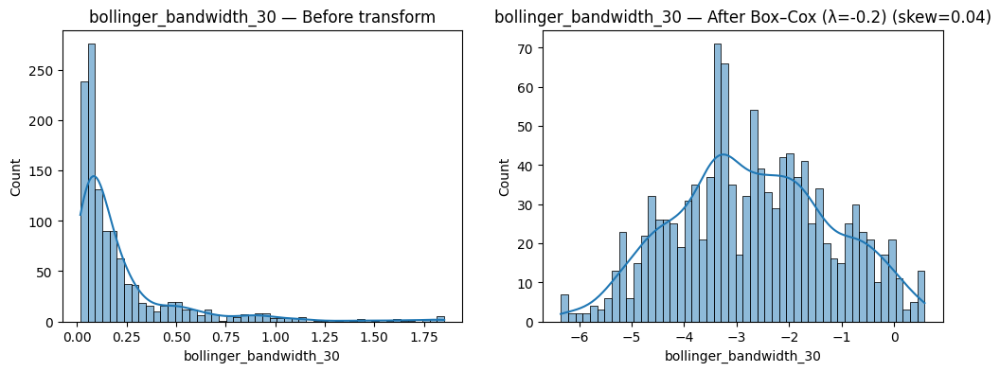

bollinger_bandwidth_30_lag_1: skewness before = 2.90


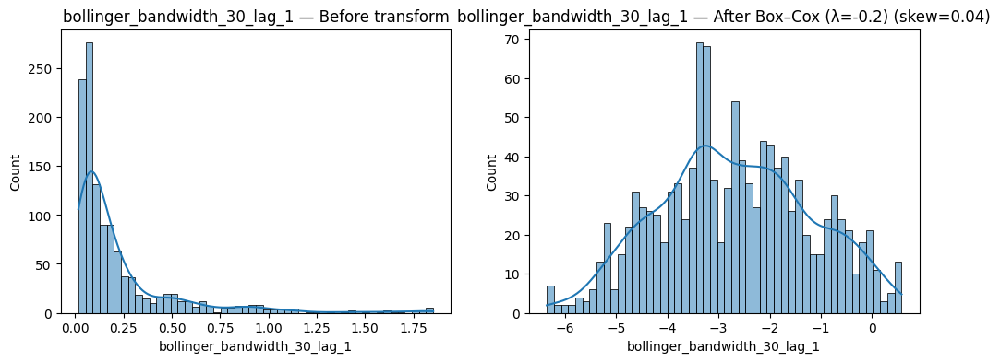

atr_lag30_15: skewness before = 2.90


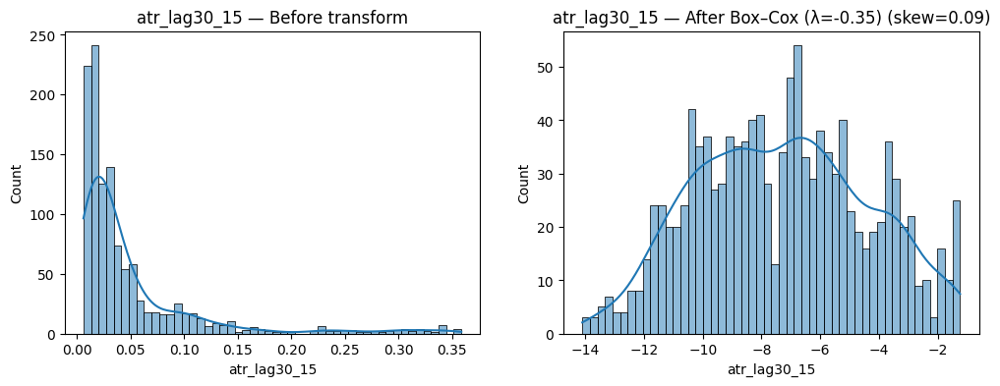

atr_lag15_21: skewness before = 2.87


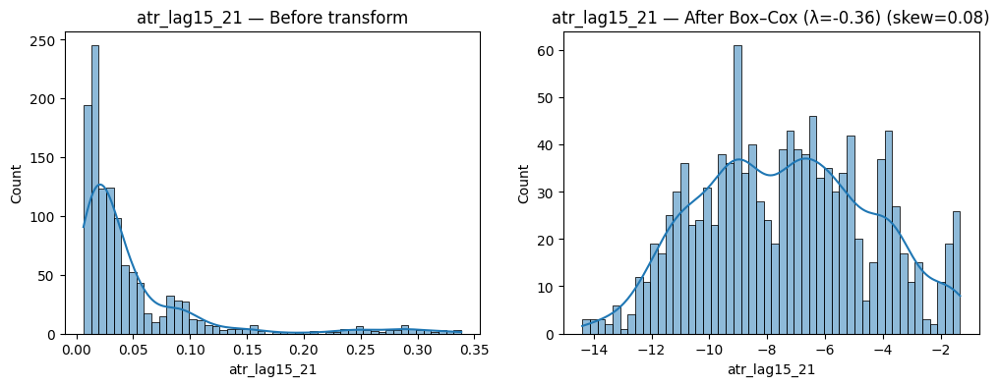

close_lag_5_std_30: skewness before = 2.86


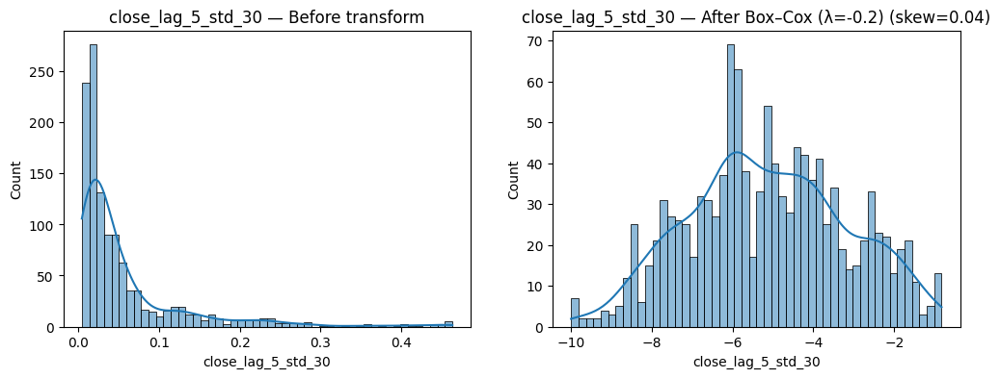

close_lag_15_std_30: skewness before = 2.82


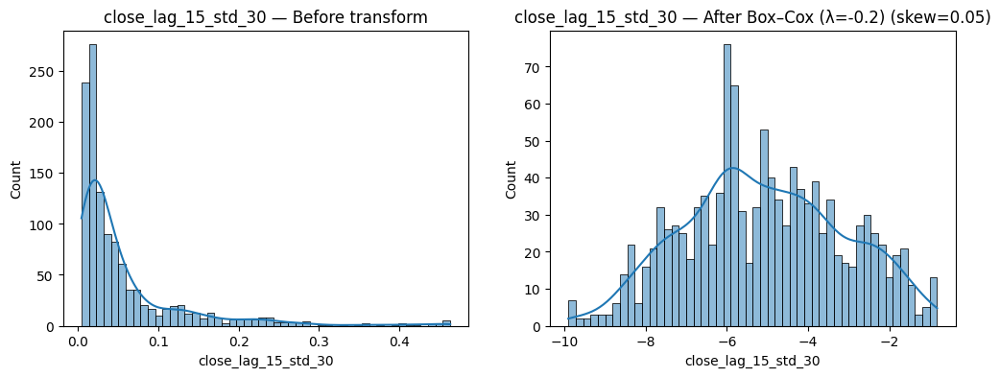

volume_lag_5_ma_5_delta: skewness before = 2.81


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


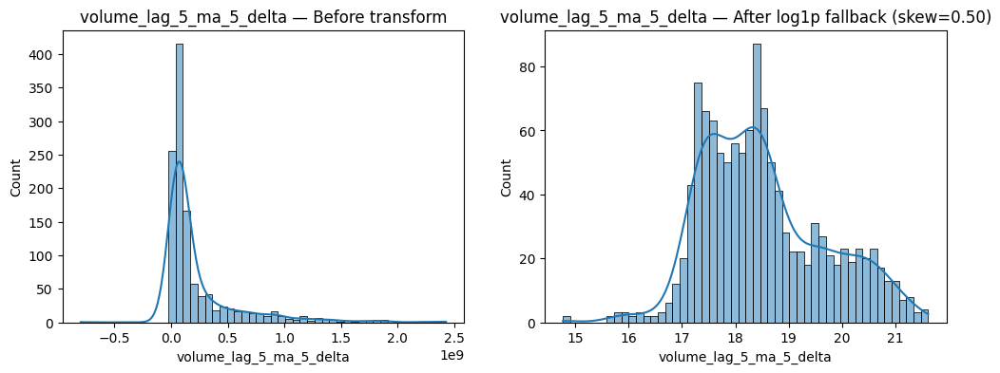

atr_lag5_30: skewness before = 2.79


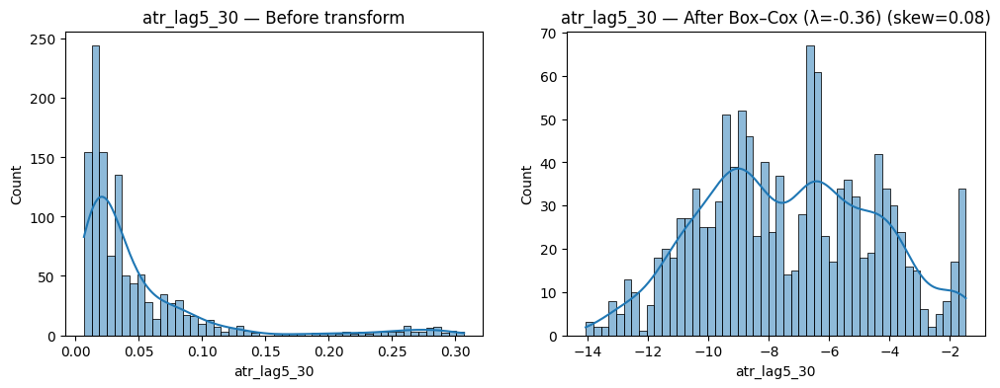

atr_lag50_15: skewness before = 2.79


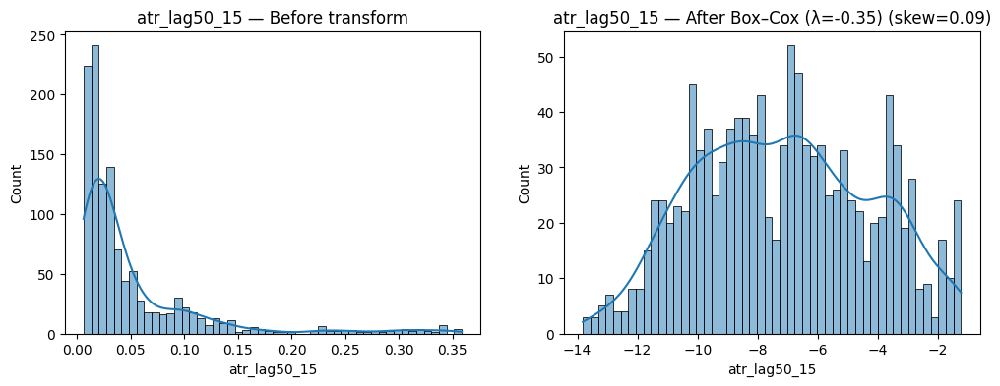

close_lag_30_std_30: skewness before = 2.78


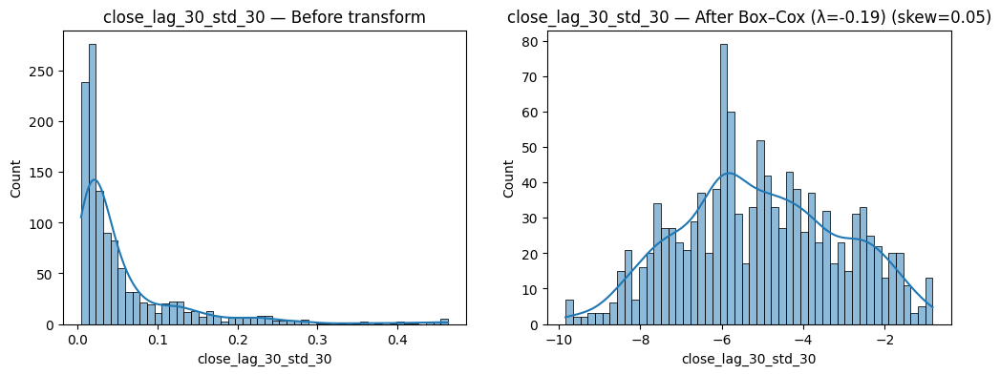

atr_lag30_21: skewness before = 2.76


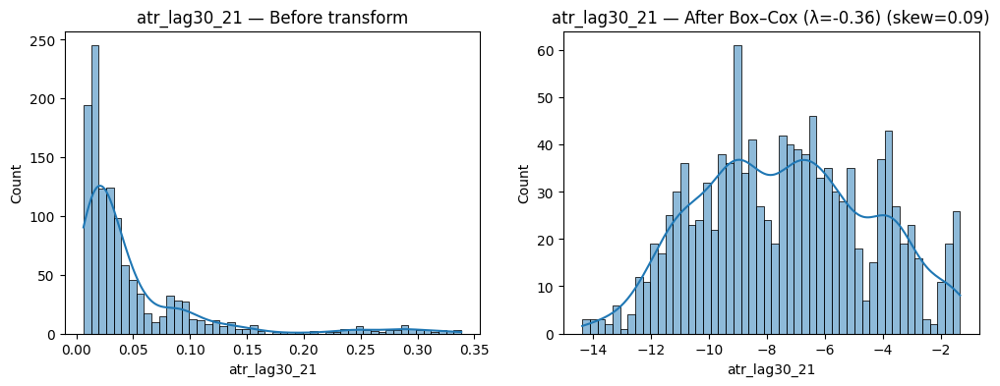

volume_lag_15_ma_5_delta: skewness before = 2.74


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


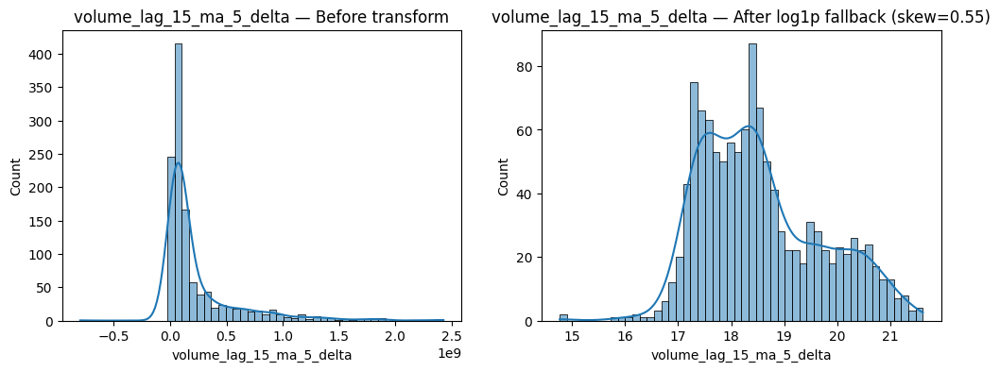

close_lag_50_std_30: skewness before = 2.73


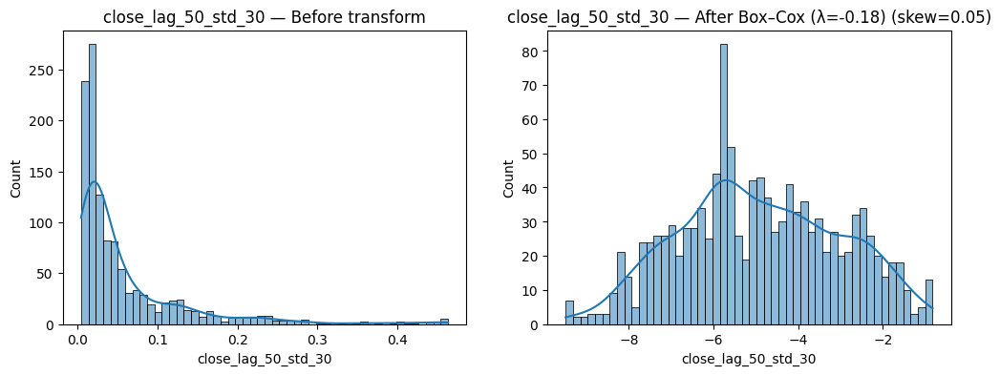

volume_lag_30_ma_5_delta: skewness before = 2.70


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


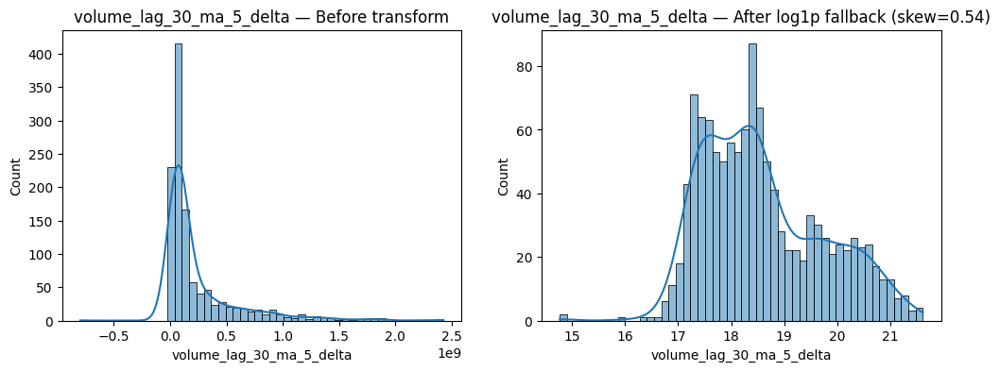

atr_lag15_30: skewness before = 2.69


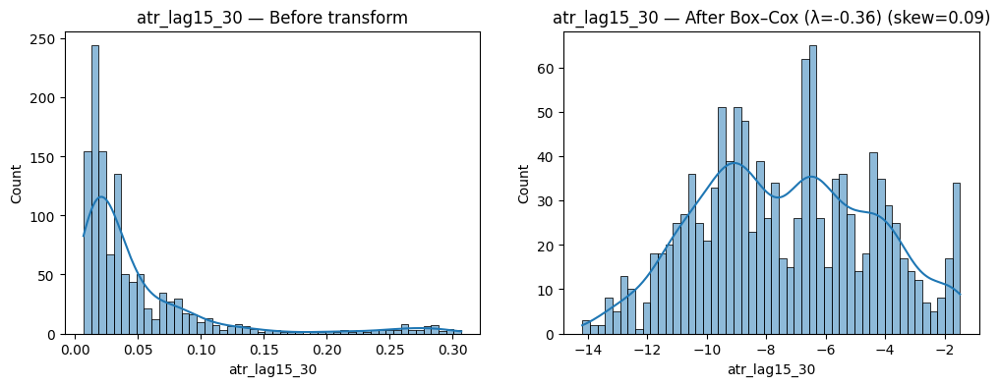

volume_lag_50_ma_5_delta: skewness before = 2.68


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


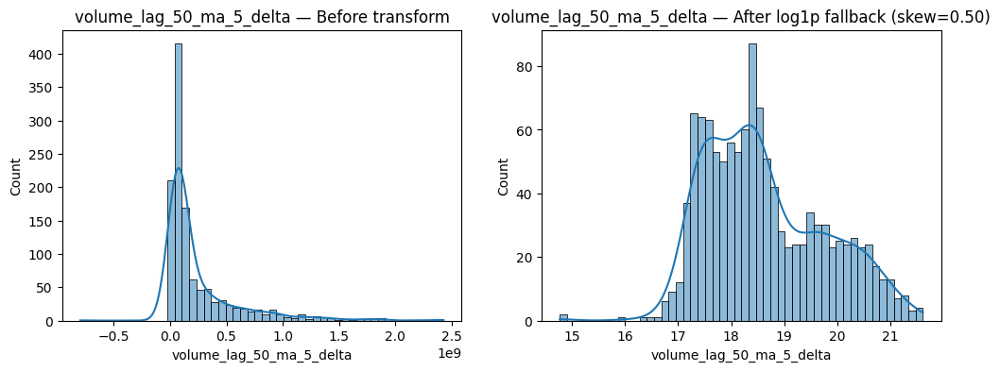

volume_lag_5_ma_8: skewness before = 2.66


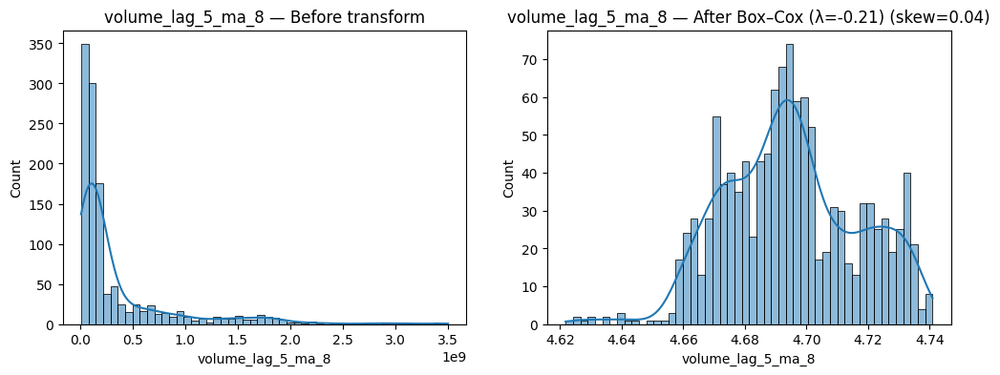

atr_lag50_21: skewness before = 2.66


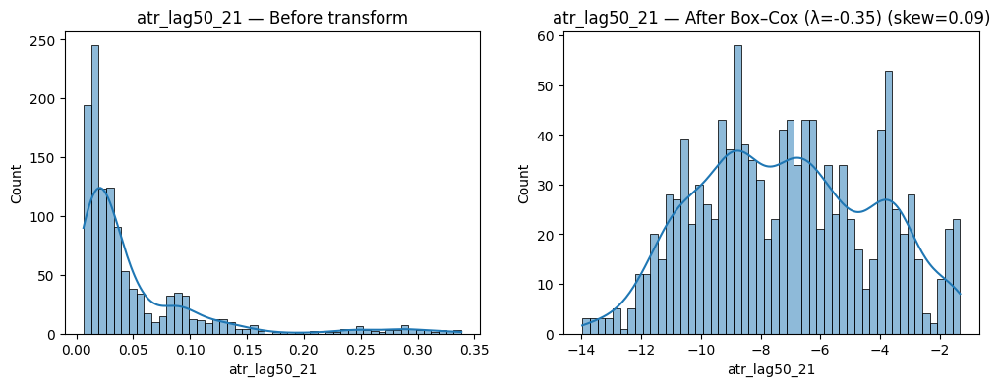

high: skewness before = 2.66


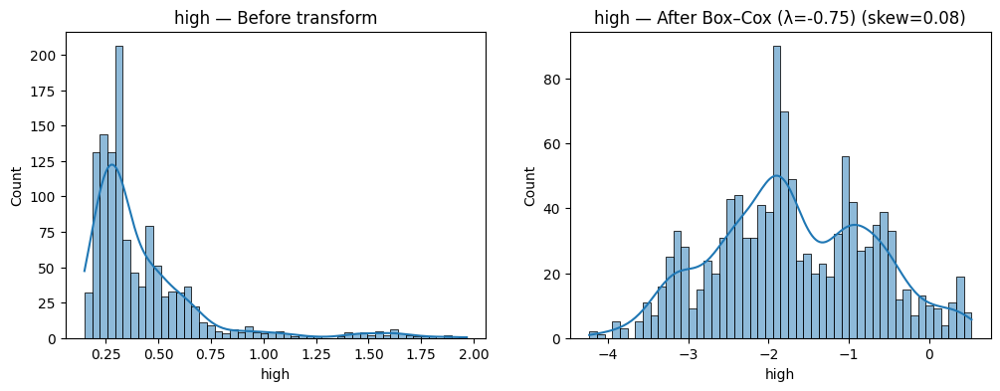

close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_5: skewness before = 2.64
⚠️  Could not transform close_lag_5: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed

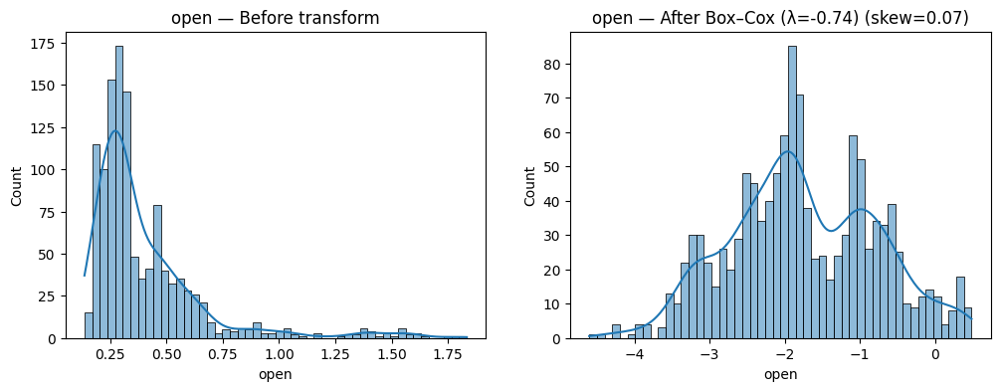

close: skewness before = 2.62


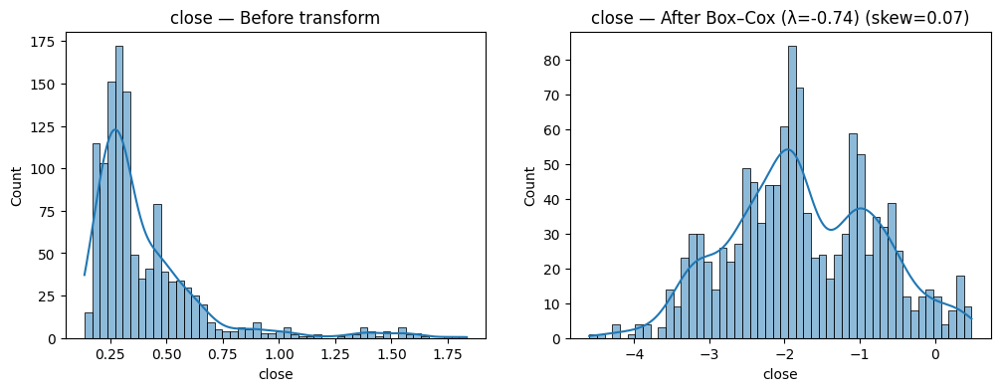

volume_lag_5_std_30: skewness before = 2.62


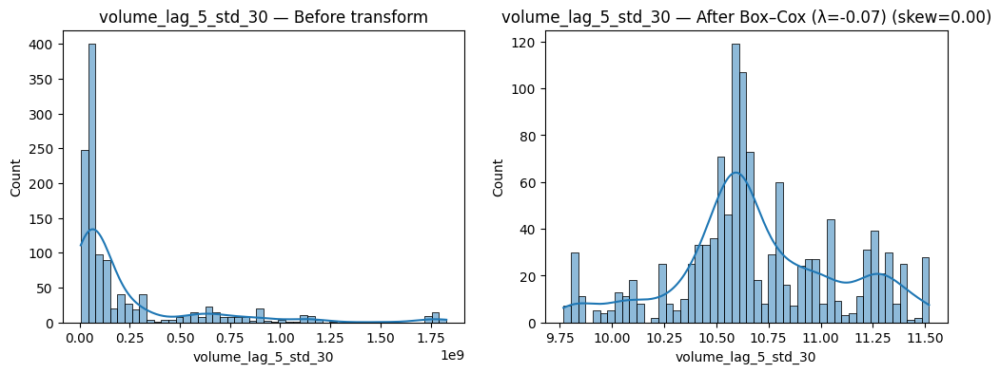

volume_lag_50_std_30: skewness before = 2.62


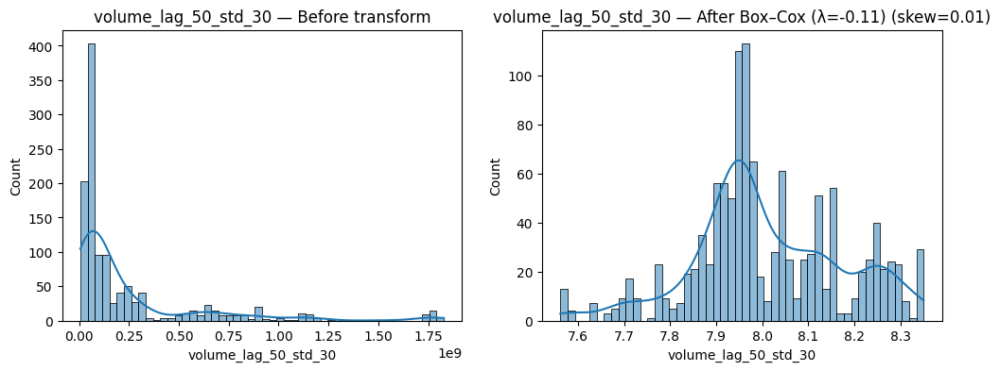

volume_lag_15_std_30: skewness before = 2.62


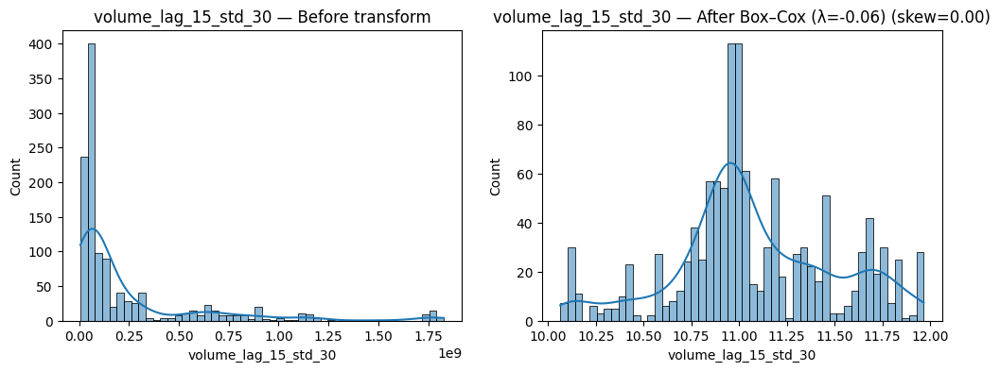

volume_lag_30_std_30: skewness before = 2.62


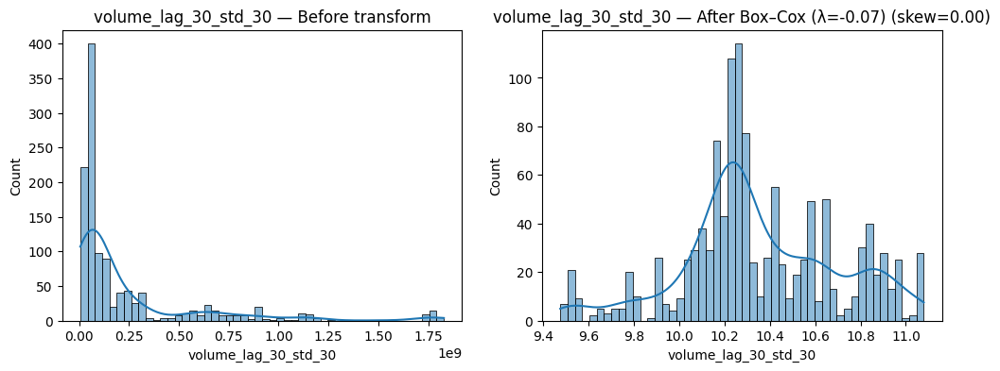

upper_bb_15: skewness before = 2.61


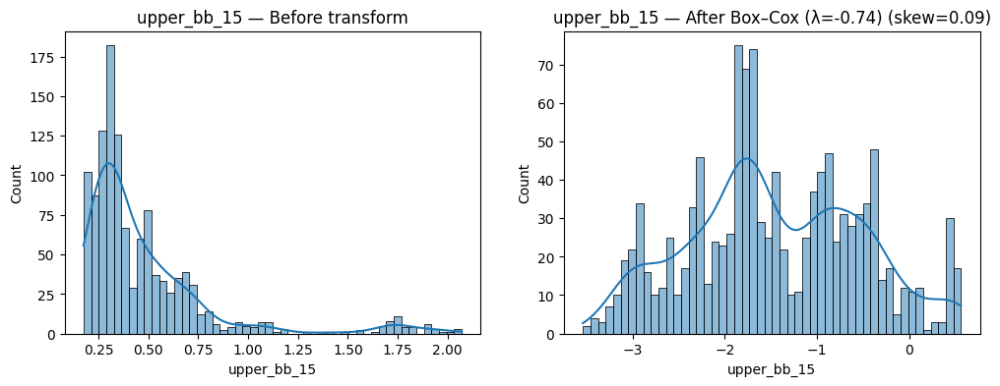

volume_lag_15_ma_8: skewness before = 2.61


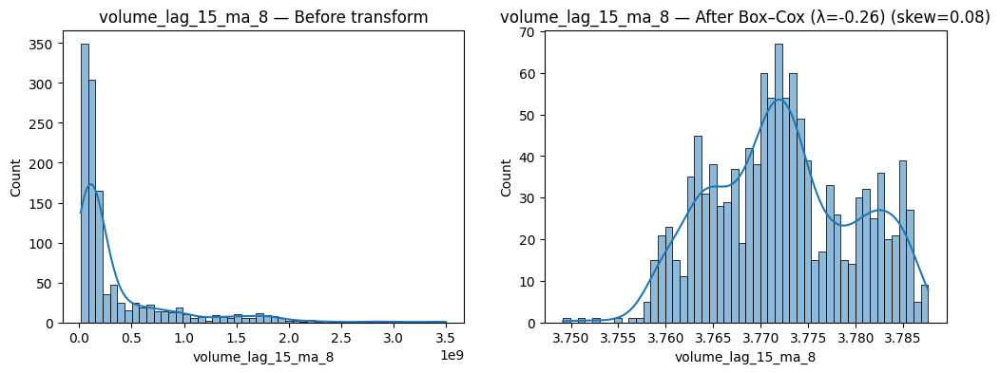

close_lag_5_ma_3: skewness before = 2.61


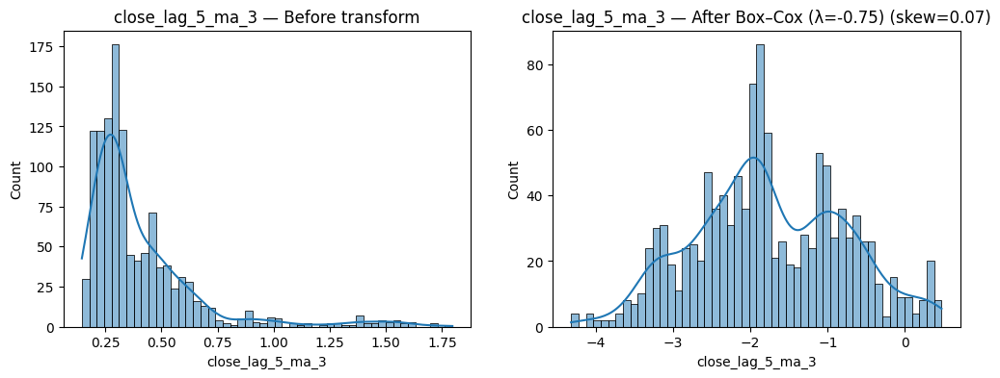

atr_lag30_30: skewness before = 2.59


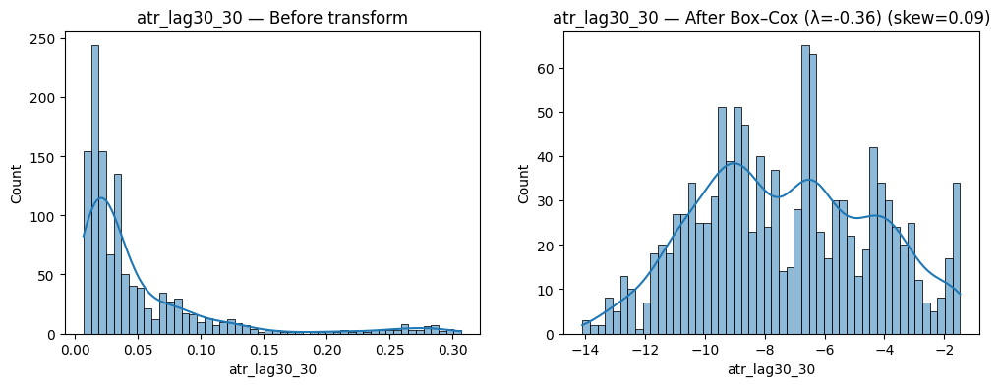

close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_15: skewness before = 2.59
⚠️  Could not transform close_lag_15: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is

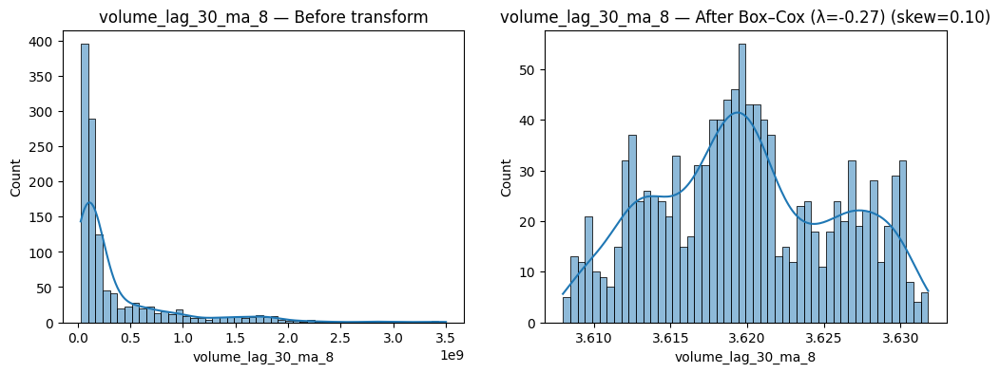

close_lag_5_ma_5: skewness before = 2.58


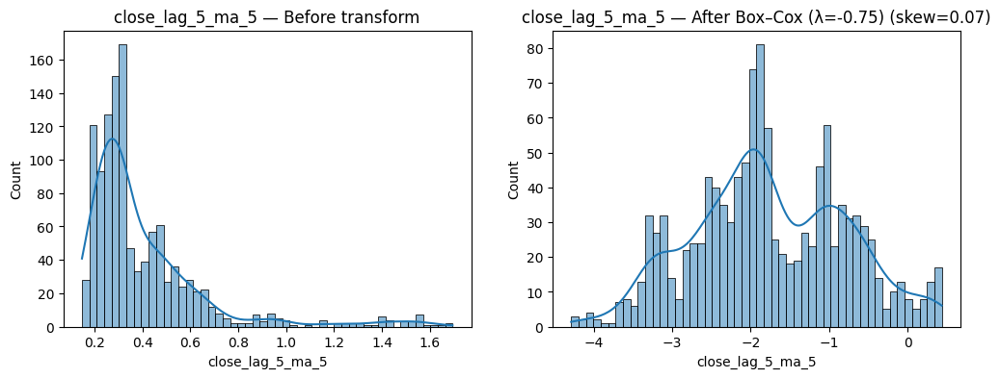

atr_lag5_50: skewness before = 2.57


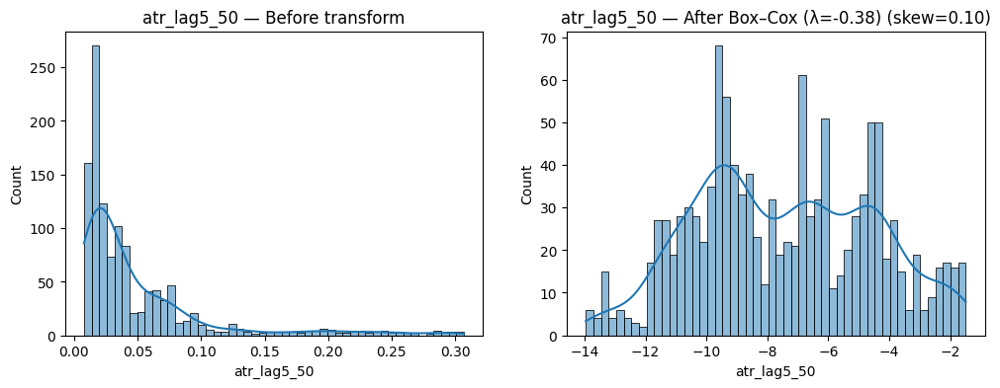

volume_lag_50_ma_8: skewness before = 2.57


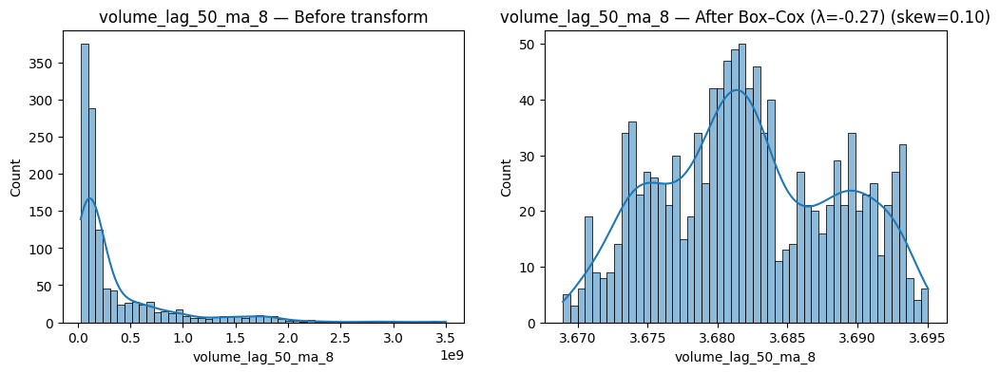

low: skewness before = 2.56


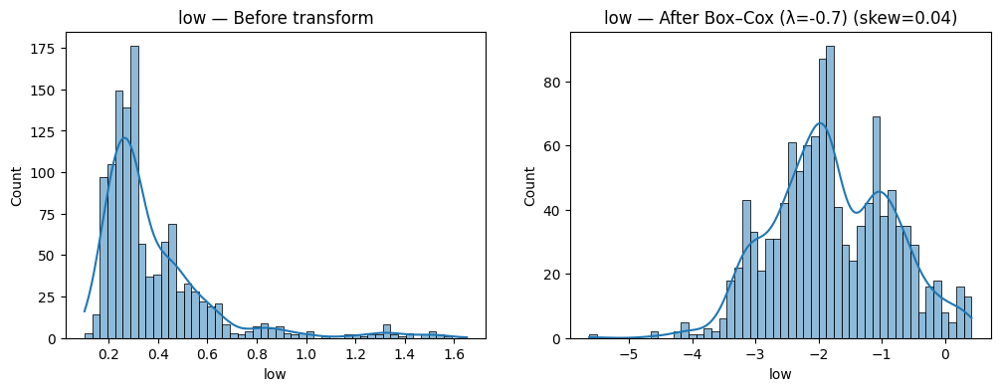

close_lag_5_ma_5_delta: skewness before = 2.55


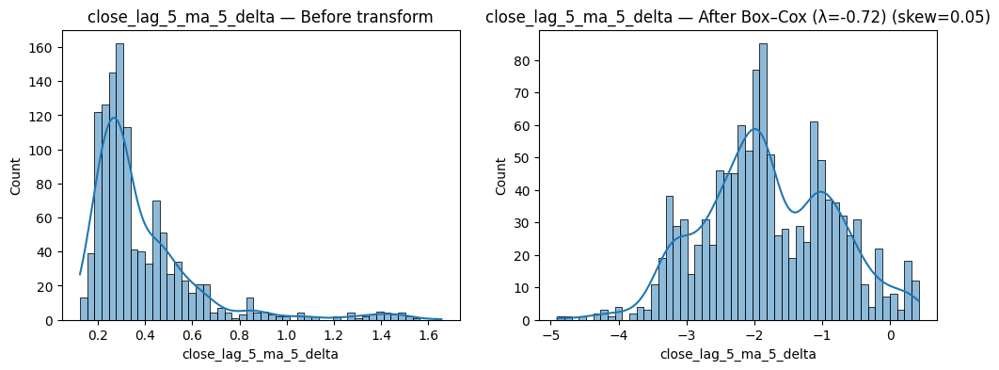

close_lag_15_ma_3: skewness before = 2.55


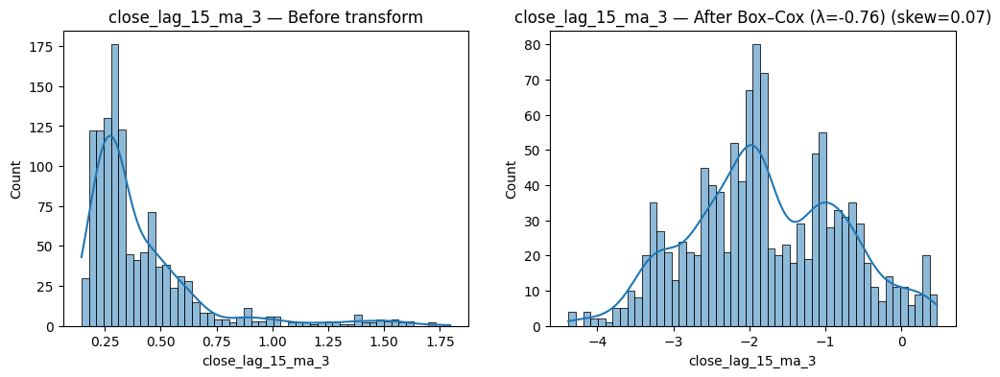

volume_lag_5_ma_8_delta: skewness before = 2.53


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


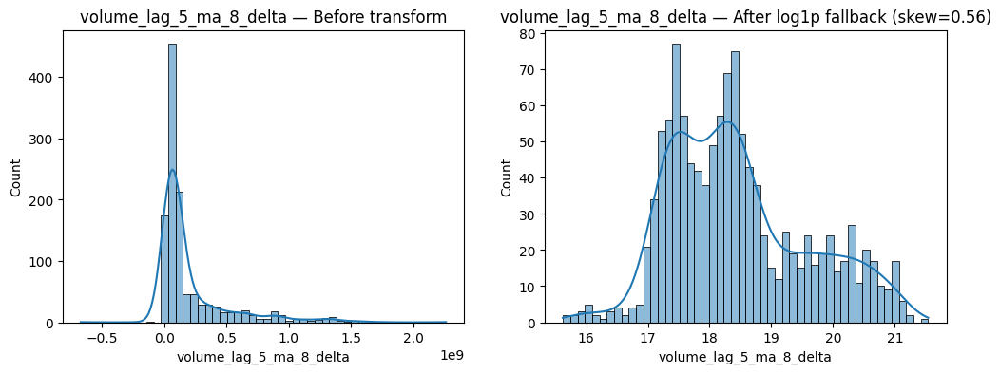

close_lag_5_ma_8: skewness before = 2.53


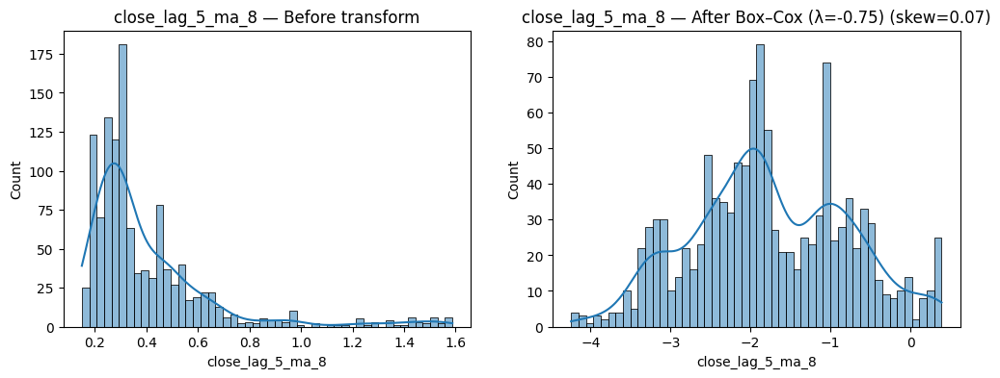

close_lag_15_ma_5: skewness before = 2.51


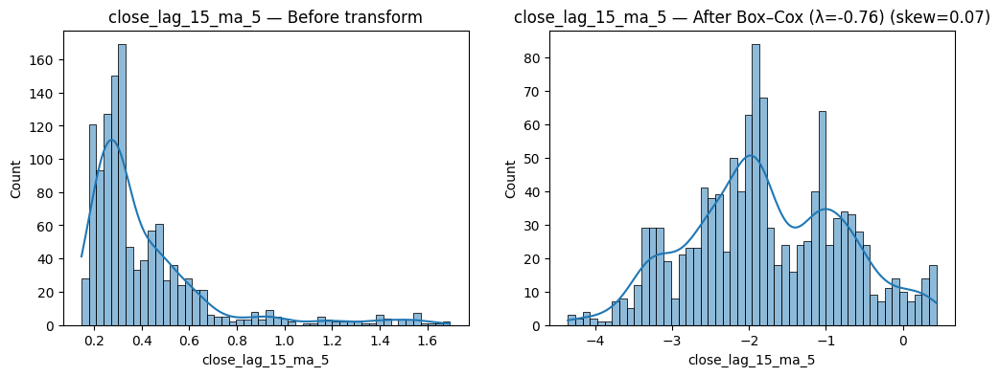

atr_lag50_30: skewness before = 2.51


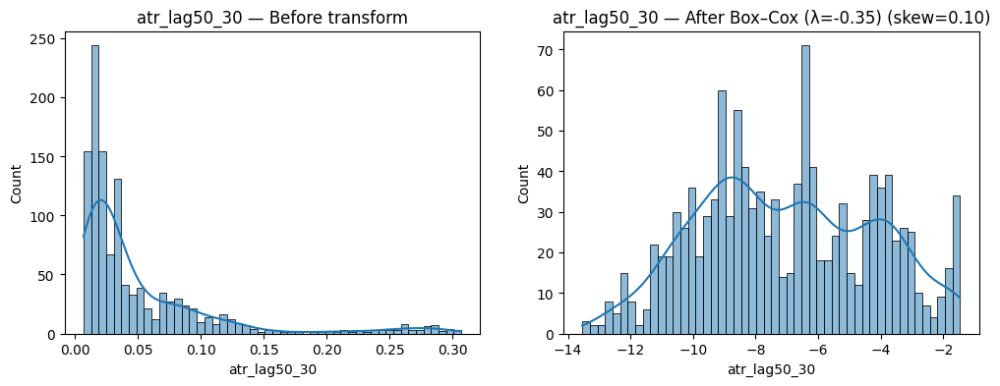

close_lag_15_ma_5_delta: skewness before = 2.49


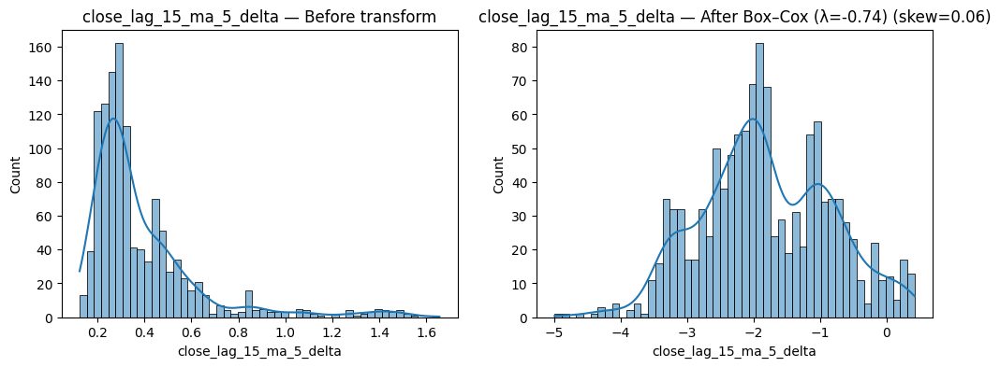

atr_lag15_50: skewness before = 2.49


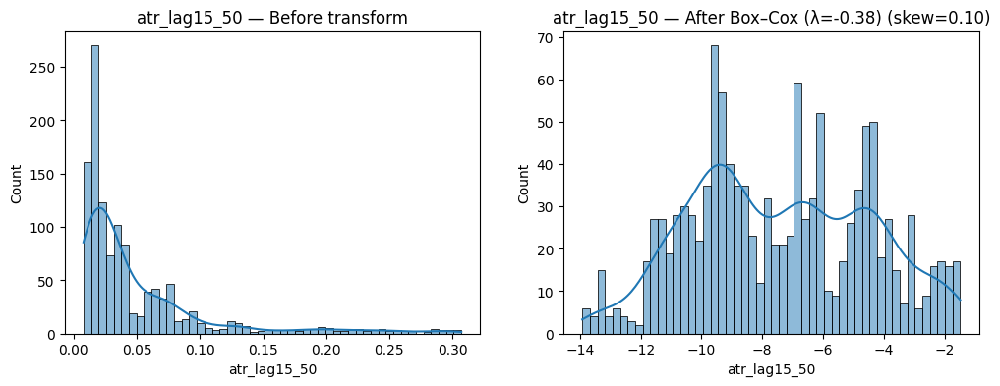

volume_lag_15_ma_8_delta: skewness before = 2.46


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


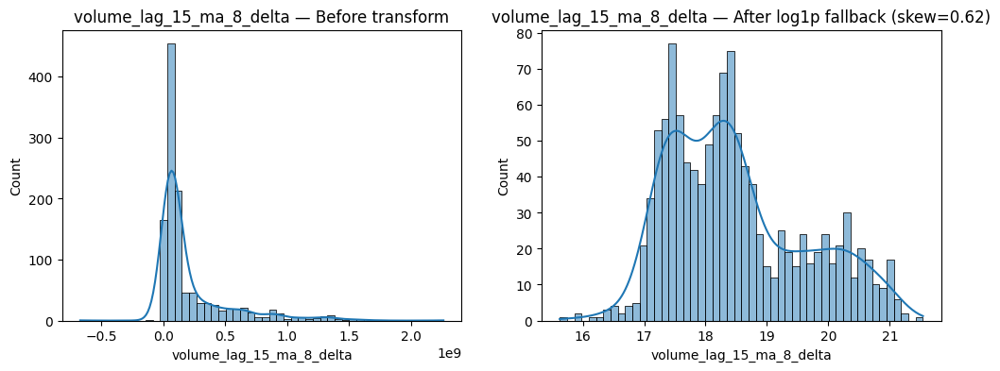

close_lag_5_ma_8_delta: skewness before = 2.46


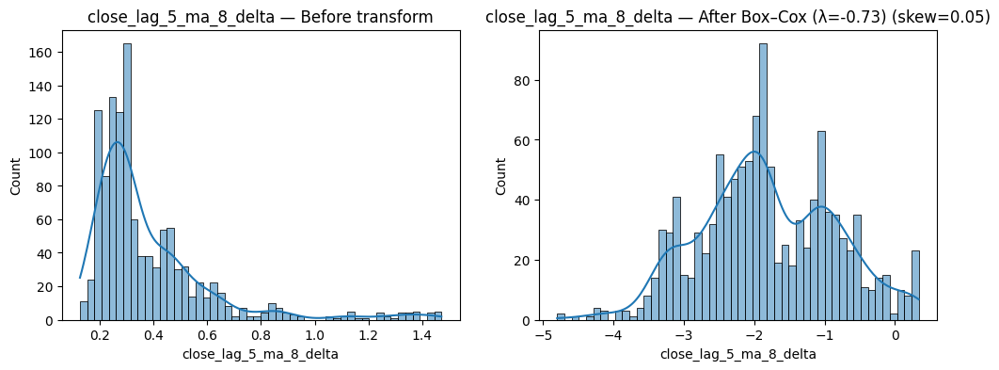

close_lag_15_ma_8: skewness before = 2.46


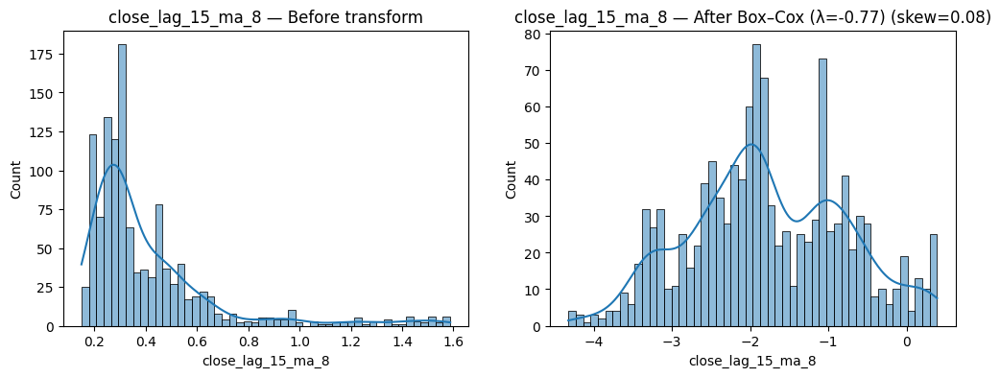

close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_30: skewness before = 2.45
⚠️  Could not transform close_lag_30: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


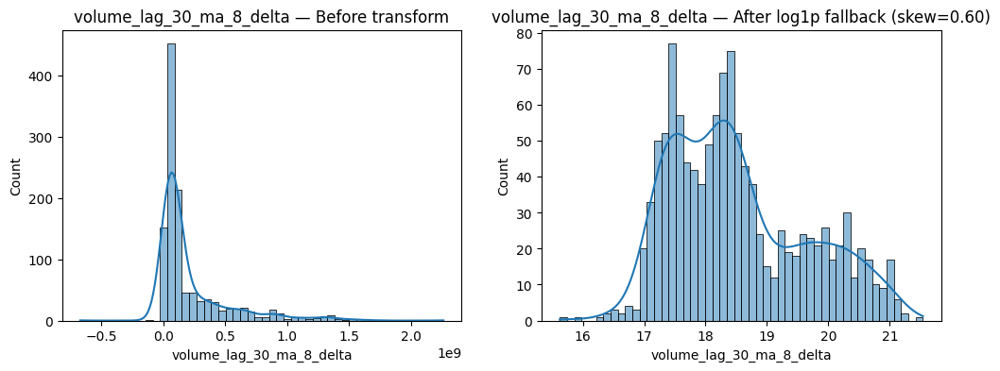

close_lag_5_ma_15: skewness before = 2.42


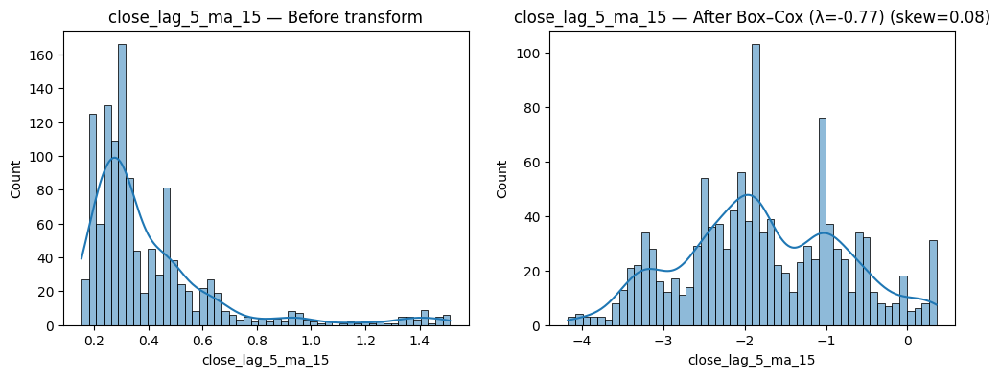

atr_lag30_50: skewness before = 2.41


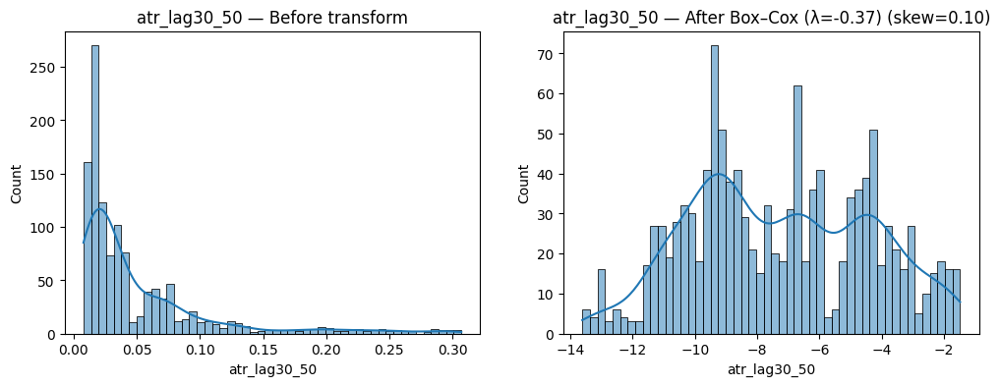

close_lag_30_ma_3: skewness before = 2.41


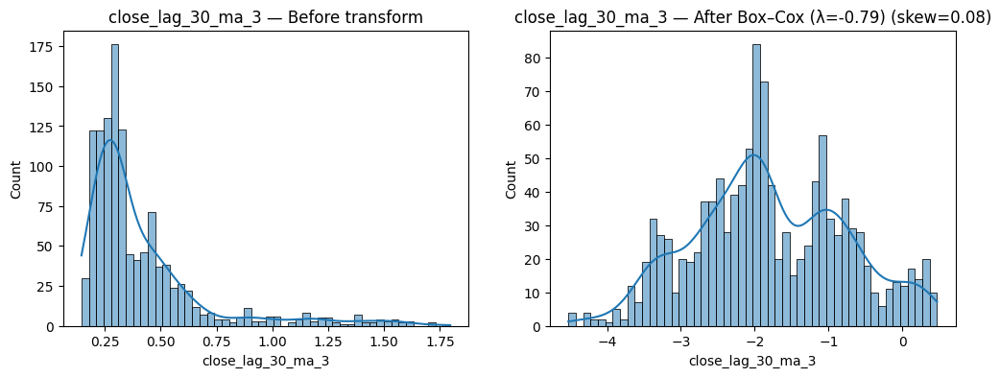

volume_lag_50_ma_8_delta: skewness before = 2.40


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


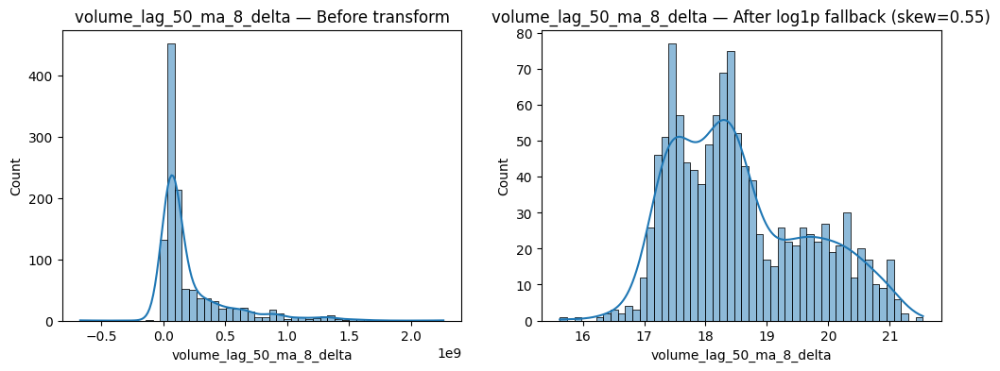

close_lag_15_ma_8_delta: skewness before = 2.40


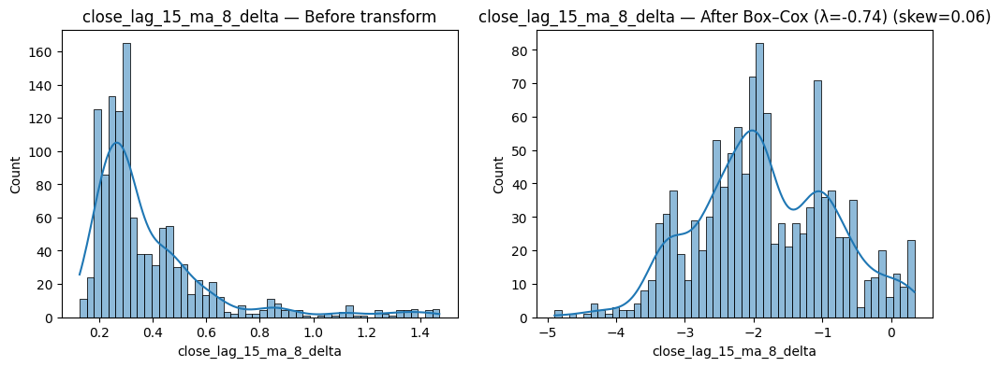

close_lag_30_ma_5: skewness before = 2.38


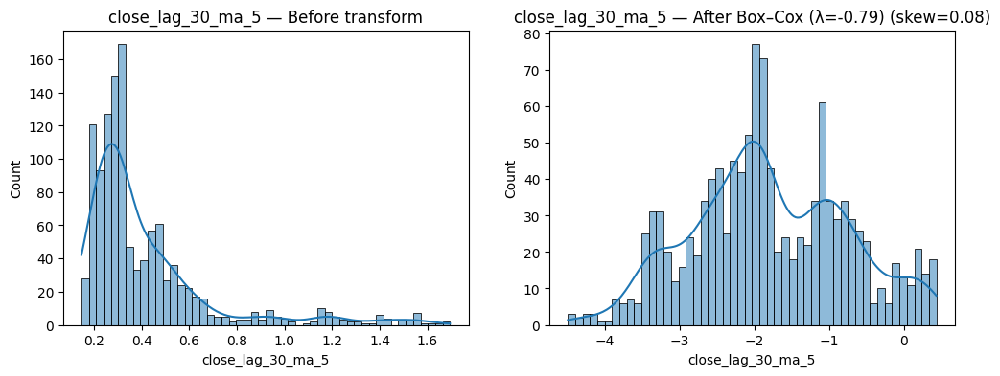

close_lag_30_ma_5_delta: skewness before = 2.37


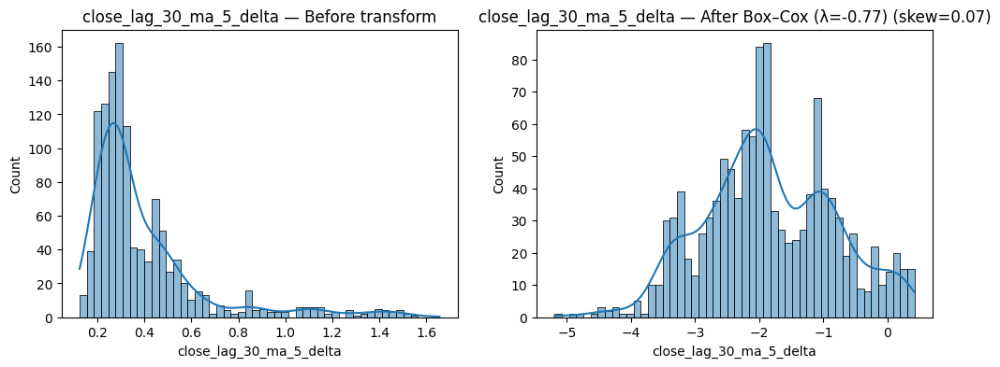

close_lag_5_ma_21: skewness before = 2.35


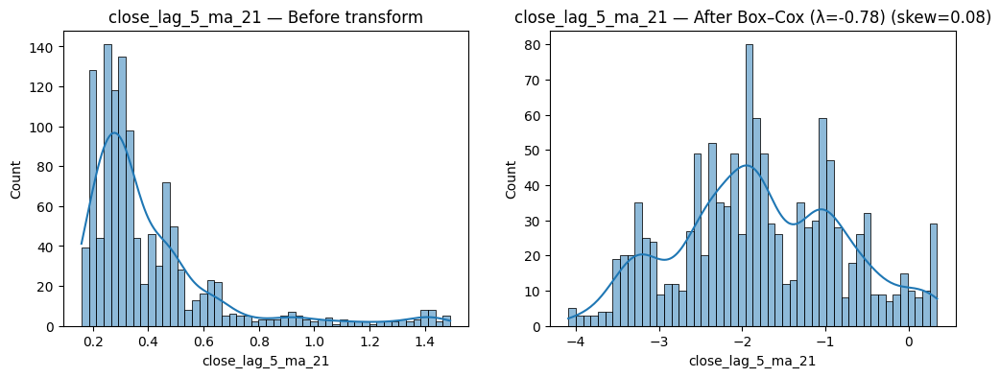

close_lag_15_ma_15: skewness before = 2.35


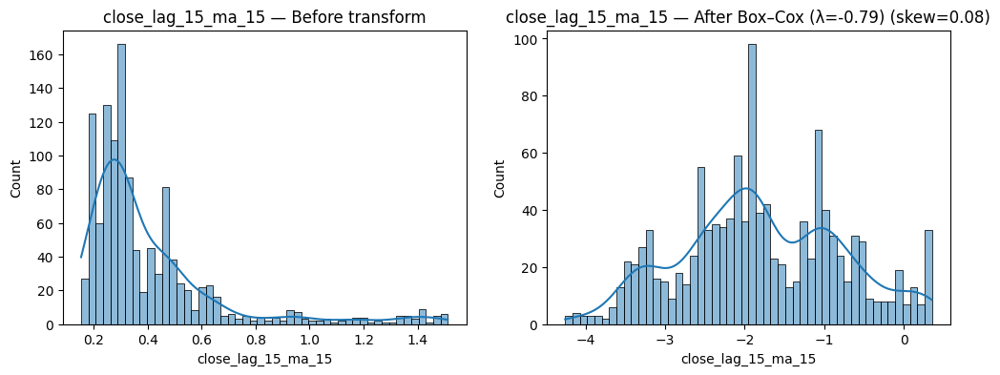

atr_lag50_50: skewness before = 2.34


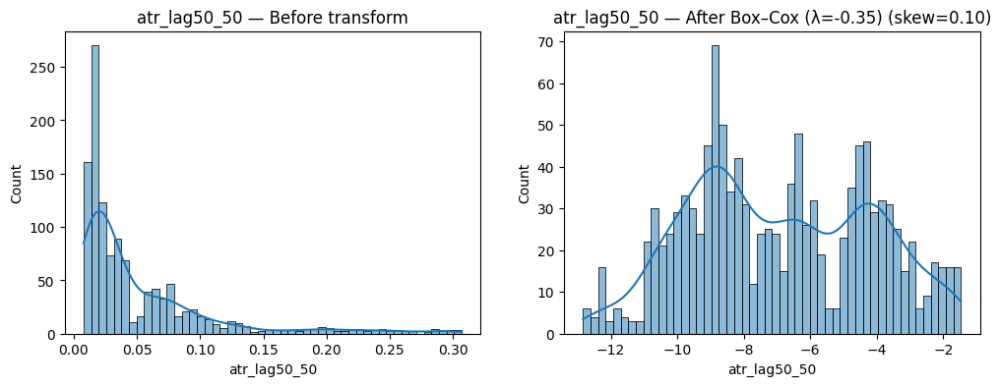

close_lag_30_ma_8: skewness before = 2.33


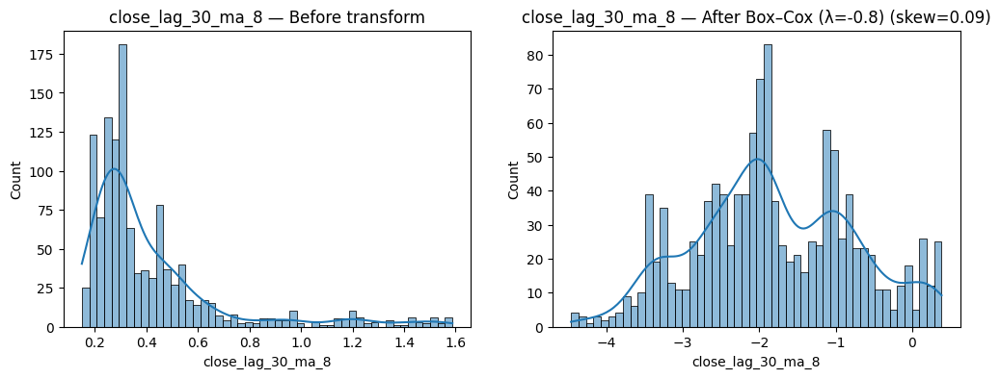

close_lag_5_ma_15_delta: skewness before = 2.33


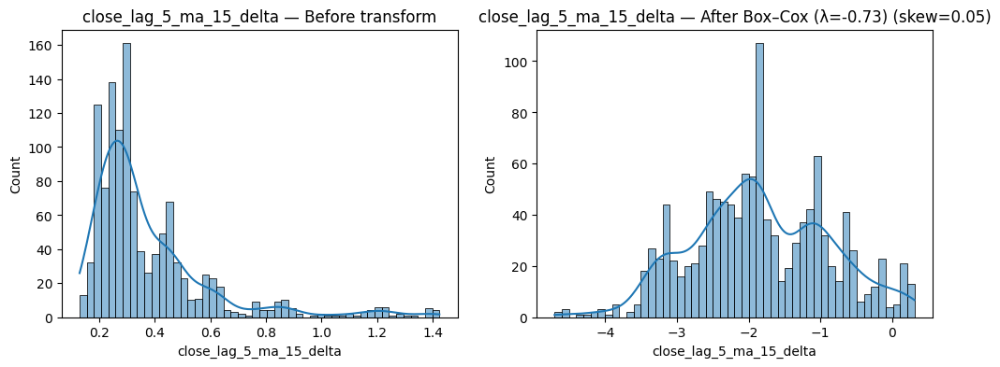

lower_bb_15: skewness before = 2.32


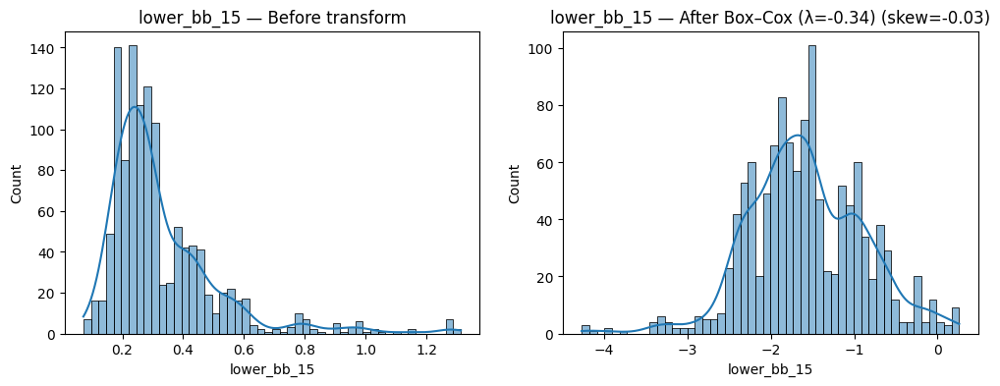

upper_bb_30: skewness before = 2.31


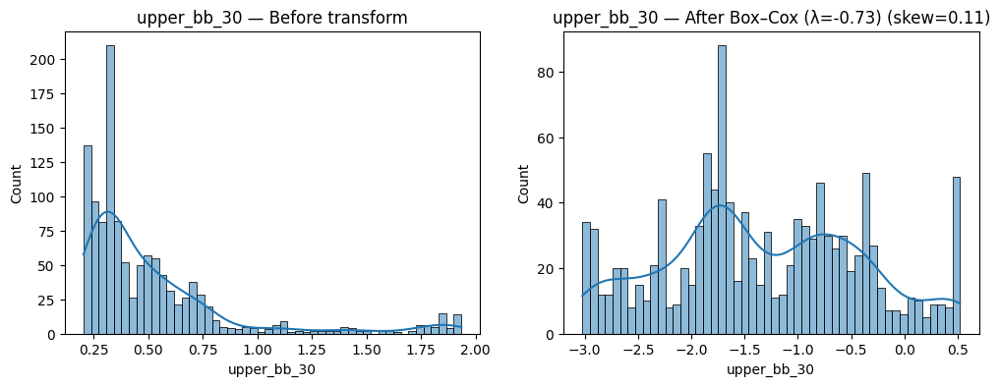

close_lag_30_ma_8_delta: skewness before = 2.29


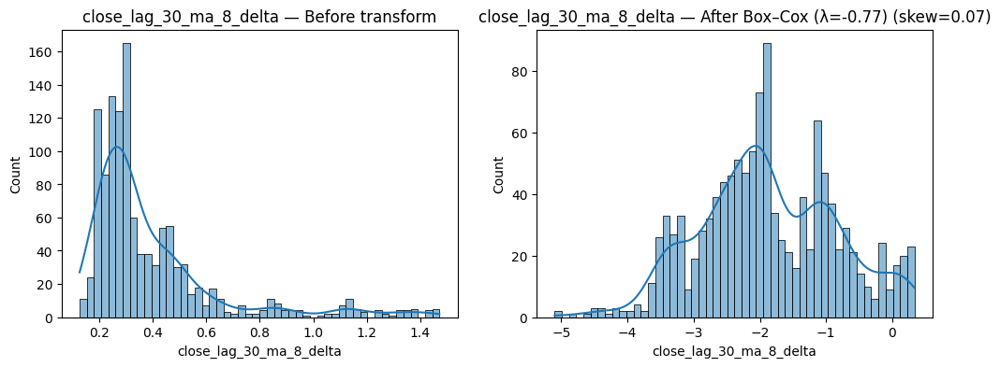

bollinger_bandwidth_50: skewness before = 2.29


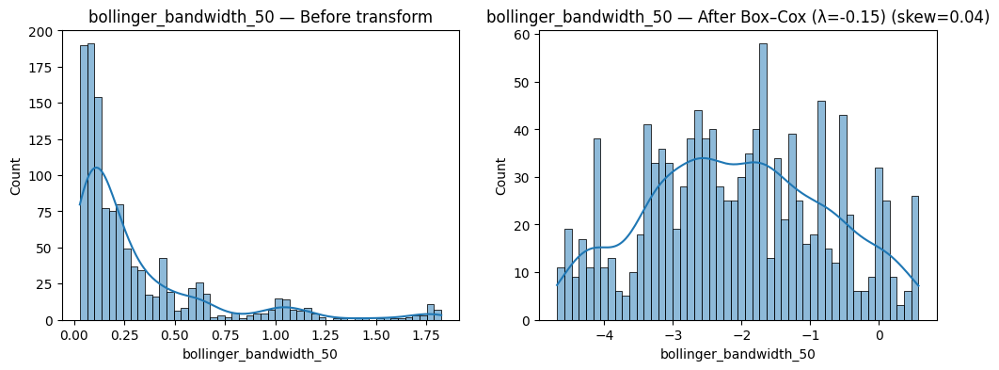

close_lag_5_ma_21_delta: skewness before = 2.29


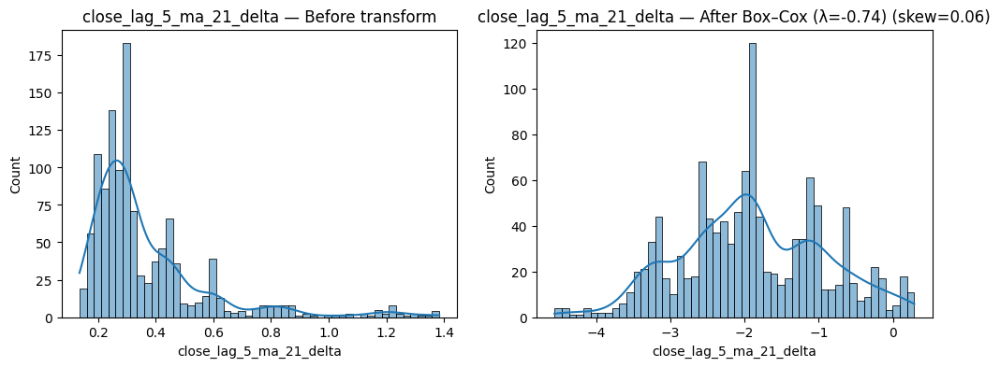

bollinger_bandwidth_50_lag_1: skewness before = 2.29


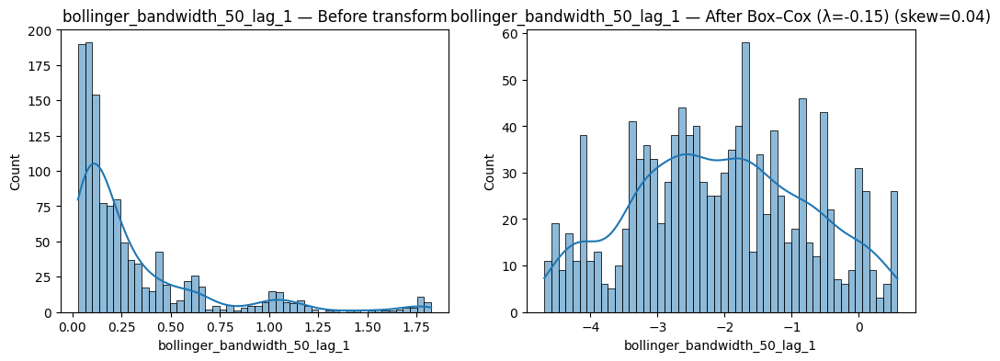

close_lag_15_ma_21: skewness before = 2.28


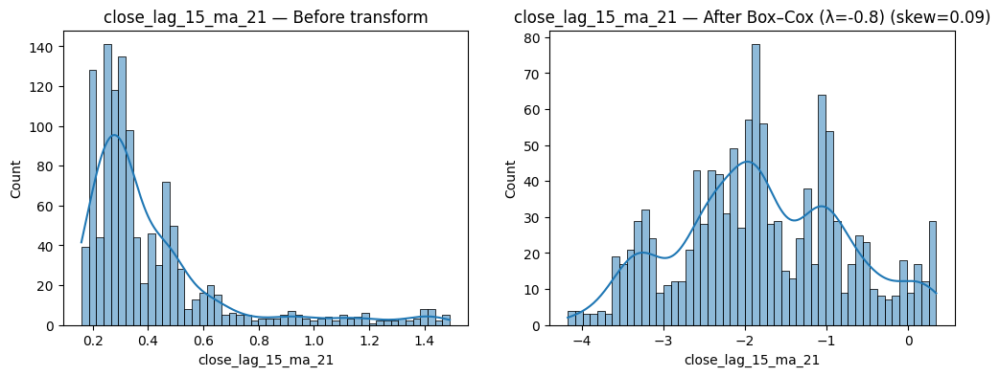

close_lag_15_ma_15_delta: skewness before = 2.27


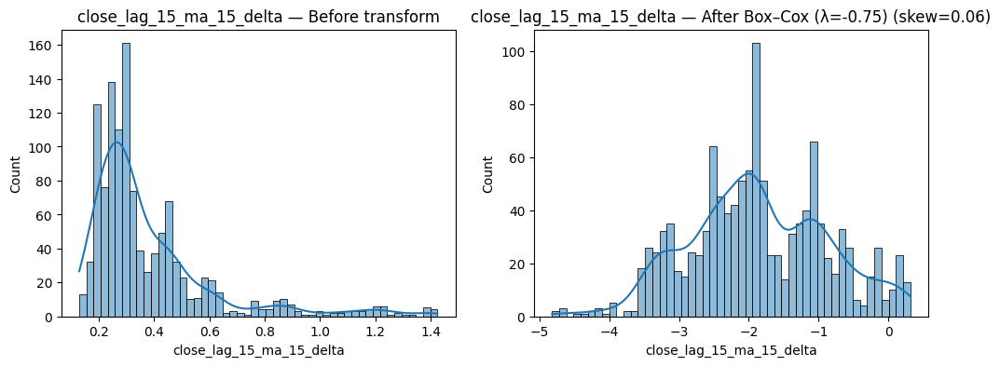

close_lag_5_std_50: skewness before = 2.27


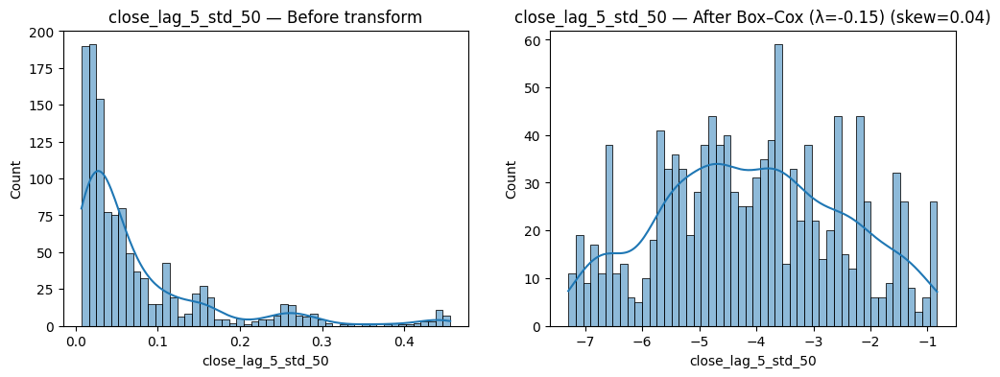

close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is not allowed.
close_lag_50: skewness before = 2.27
⚠️  Could not transform close_lag_50: Data must be 1-dimensional. | fallback error: Setting with non-unique columns is

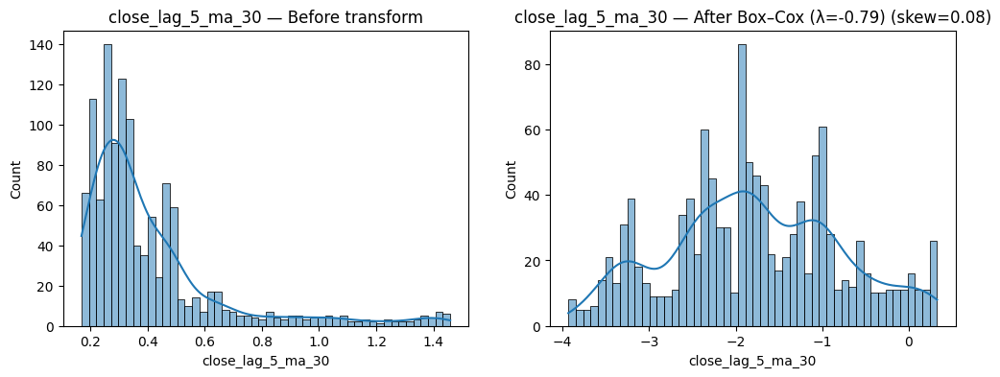

close_lag_15_std_50: skewness before = 2.25


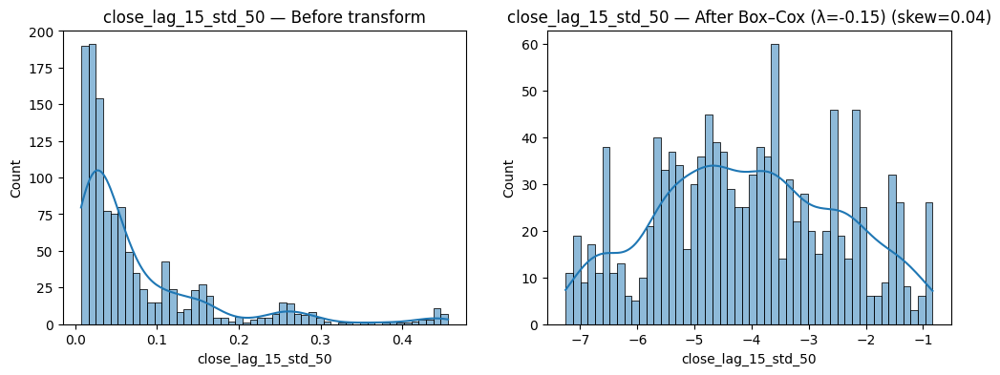

close_lag_15_ma_21_delta: skewness before = 2.24


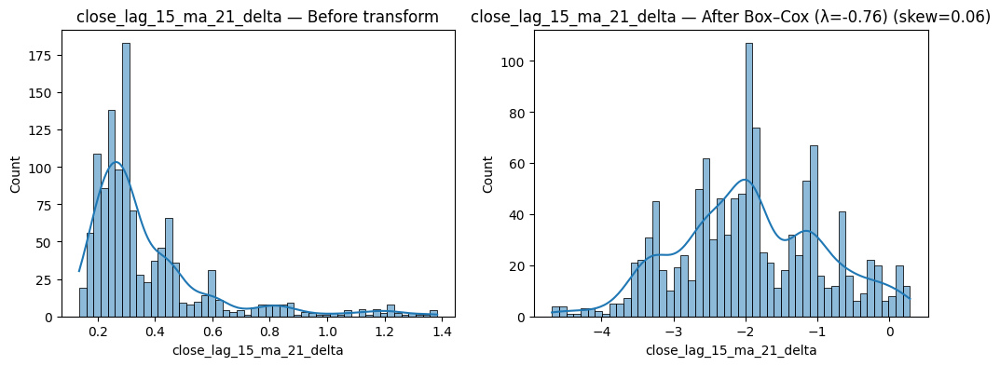

close_lag_30_ma_15: skewness before = 2.23


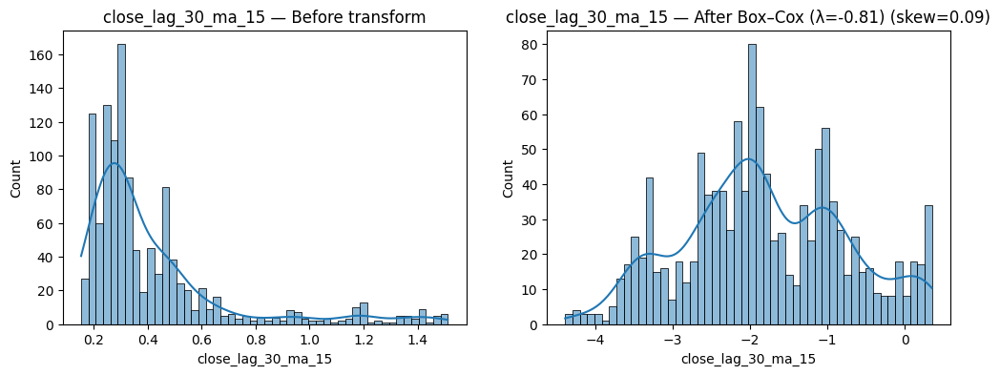

close_lag_50_ma_3: skewness before = 2.23


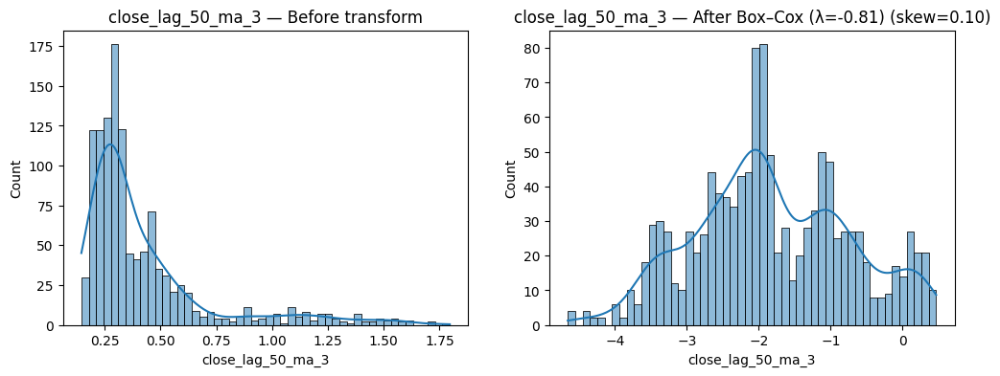

close_lag_30_std_50: skewness before = 2.23


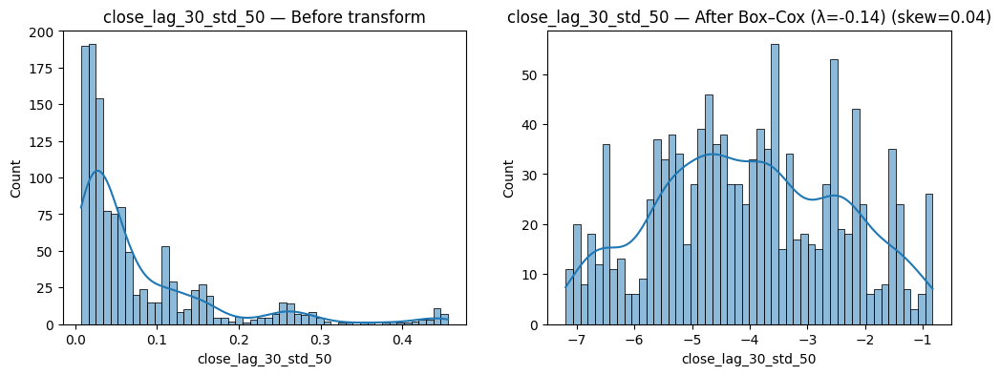

close_lag_50_std_50: skewness before = 2.21


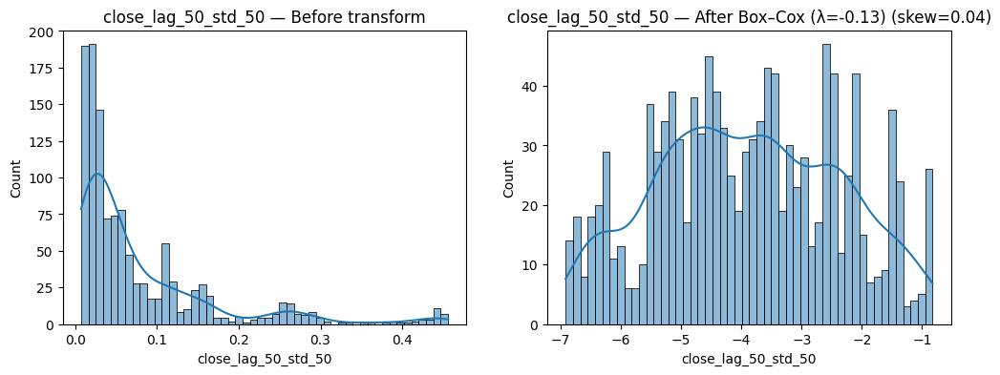

close_lag_5_ma_30_delta: skewness before = 2.21


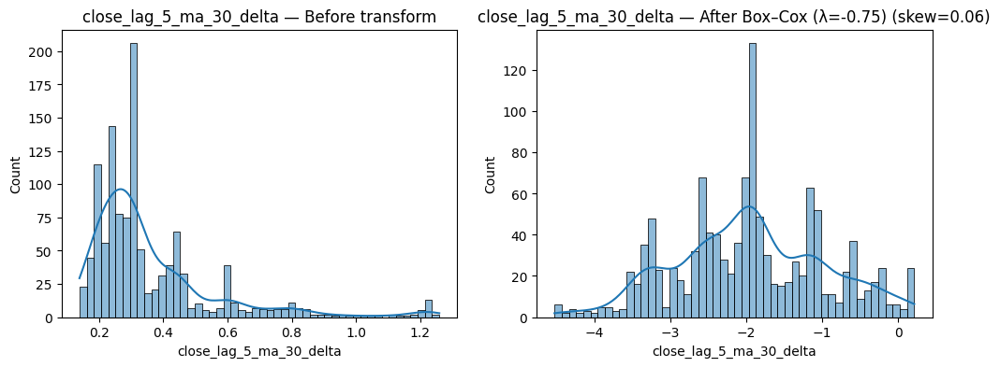

close_lag_50_ma_5: skewness before = 2.20


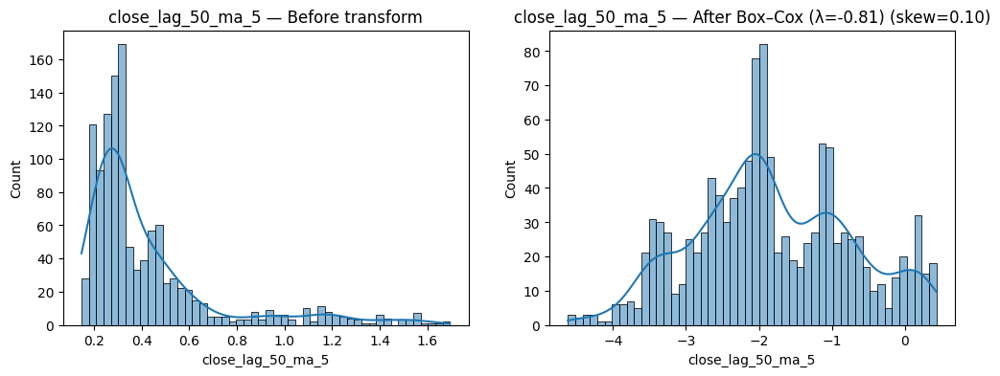

volume_lag_5_ma_15_delta: skewness before = 2.20


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


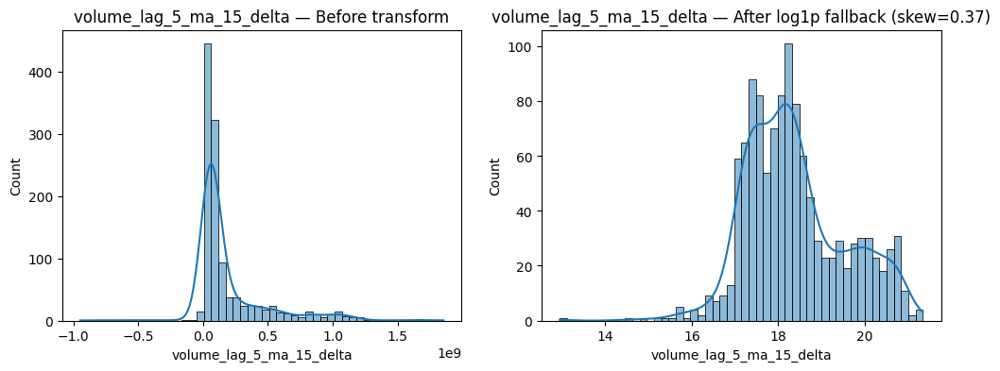

close_lag_50_ma_5_delta: skewness before = 2.20


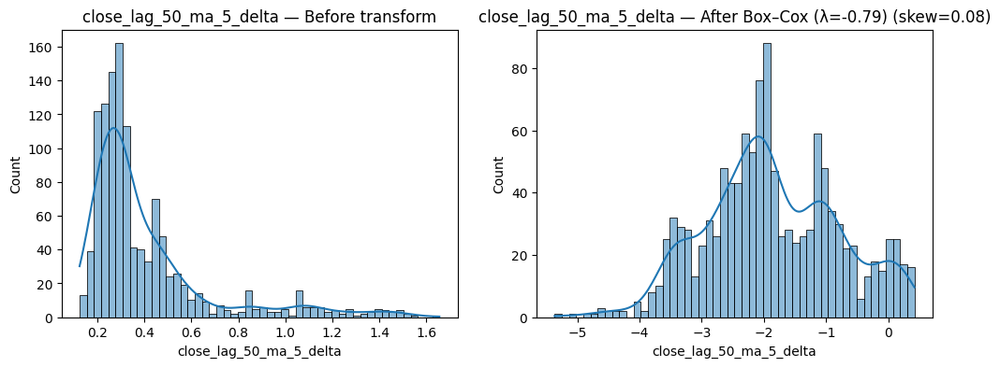

close_lag_15_ma_30: skewness before = 2.20


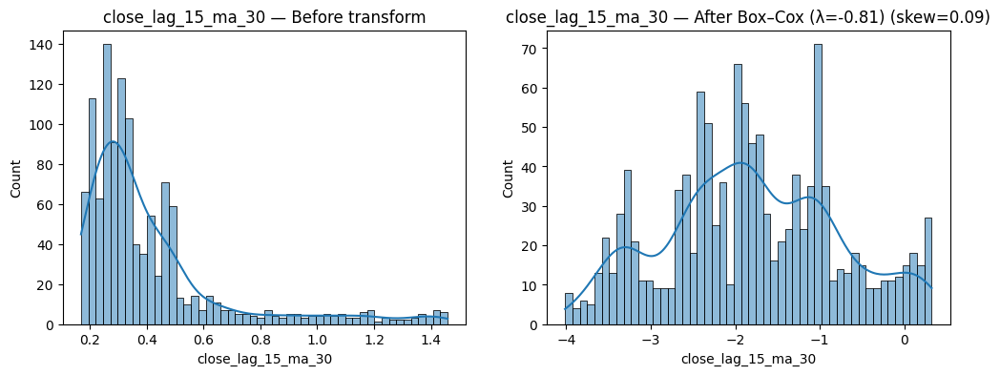

close_lag_30_ma_3_delta: skewness before = 2.19


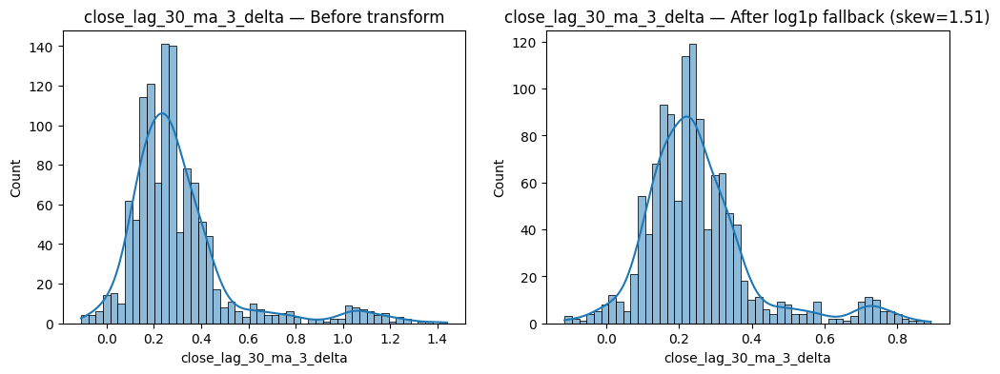

close_lag_15_ma_30_delta: skewness before = 2.19


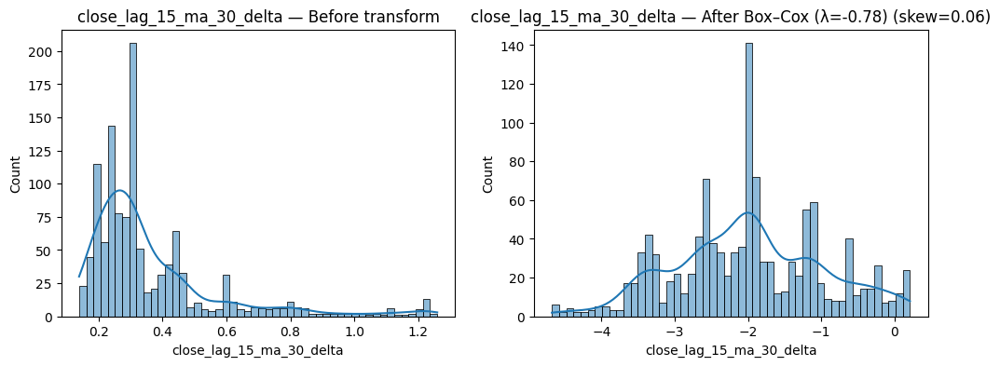

close_lag_30_ma_15_delta: skewness before = 2.19


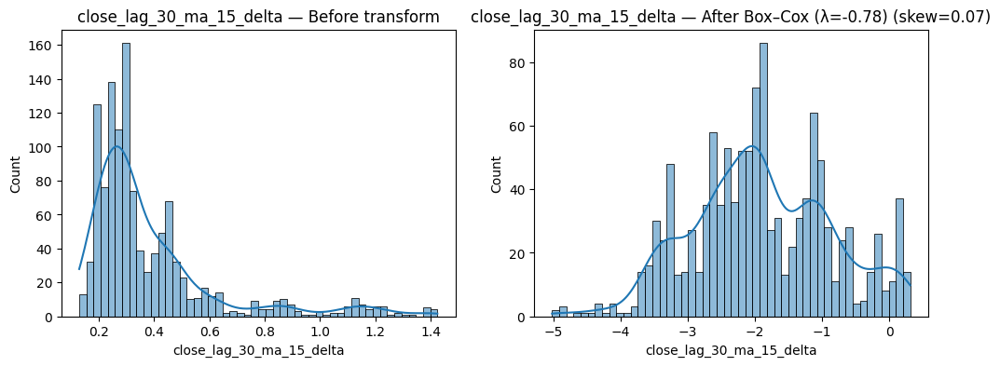

close_lag_15_ma_3_delta: skewness before = 2.18


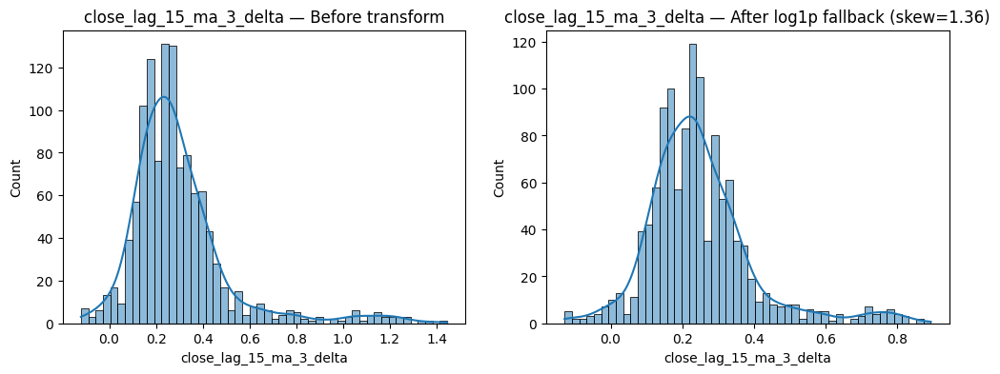

volume_lag_50_std_50: skewness before = 2.17


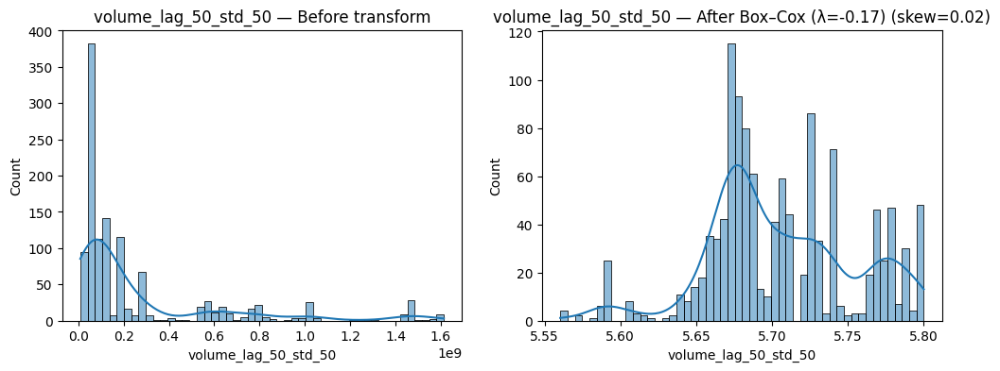

close_lag_30_ma_21: skewness before = 2.17


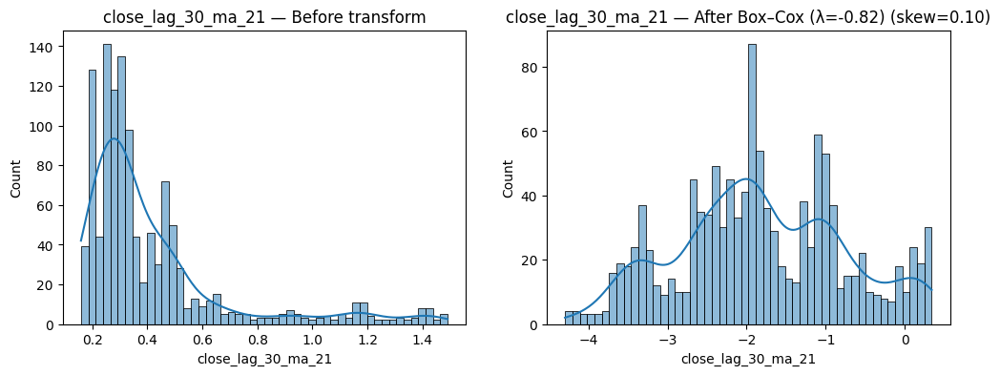

volume_lag_5_std_50: skewness before = 2.17


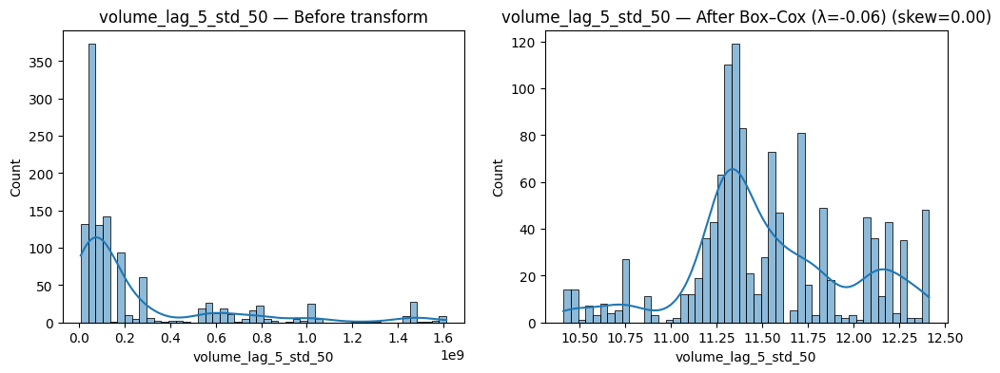

volume_lag_30_std_50: skewness before = 2.17


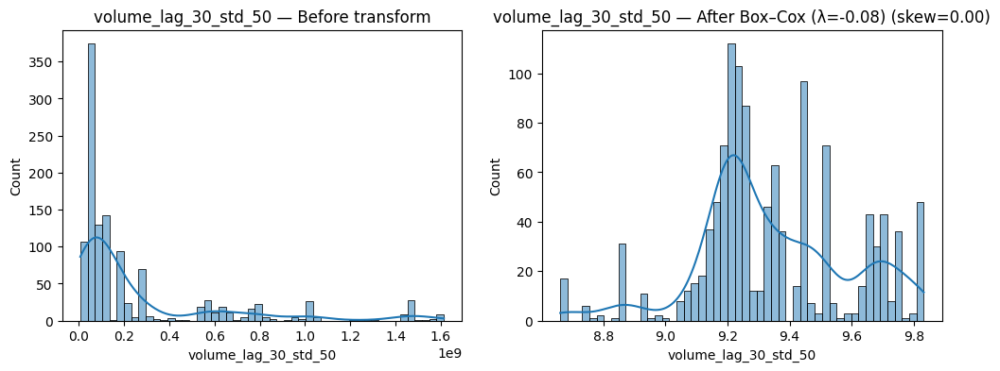

close_lag_30_ma_21_delta: skewness before = 2.17


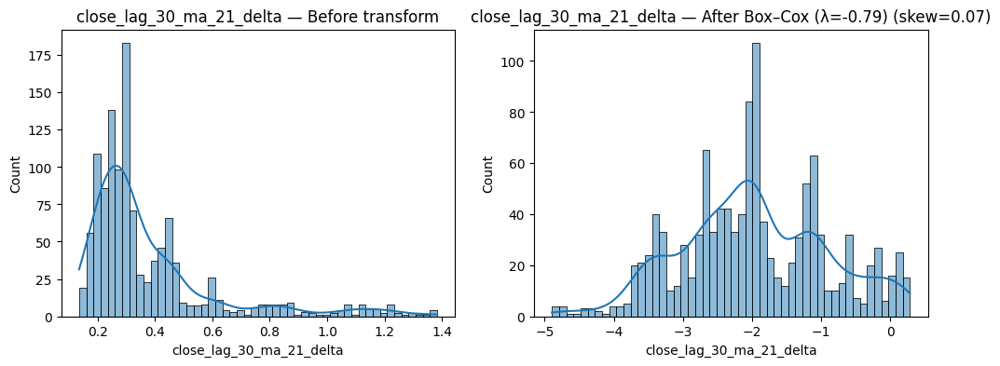

volume_lag_15_std_50: skewness before = 2.17


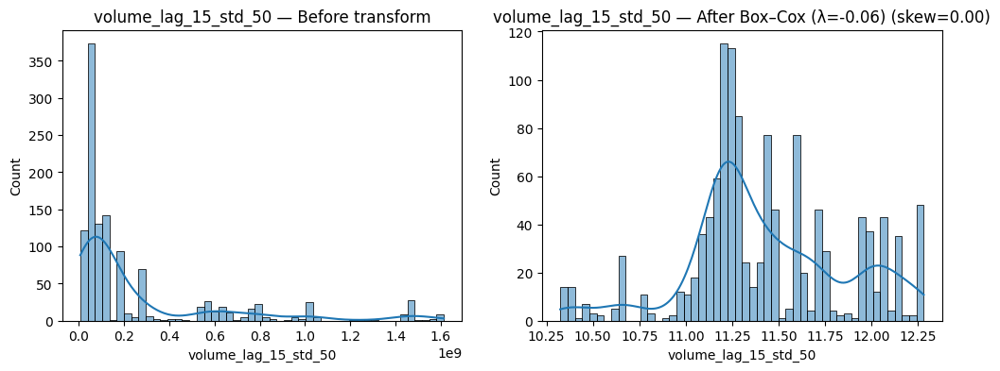

volume_lag_5_ma_15: skewness before = 2.16


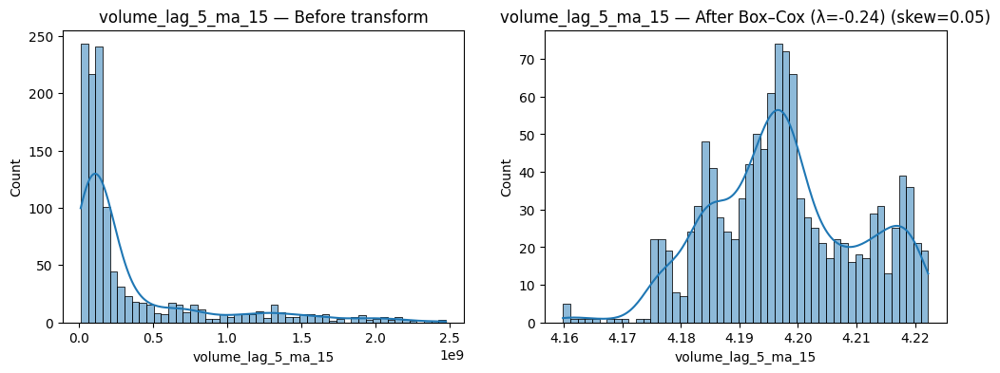

close_lag_50_ma_8: skewness before = 2.16


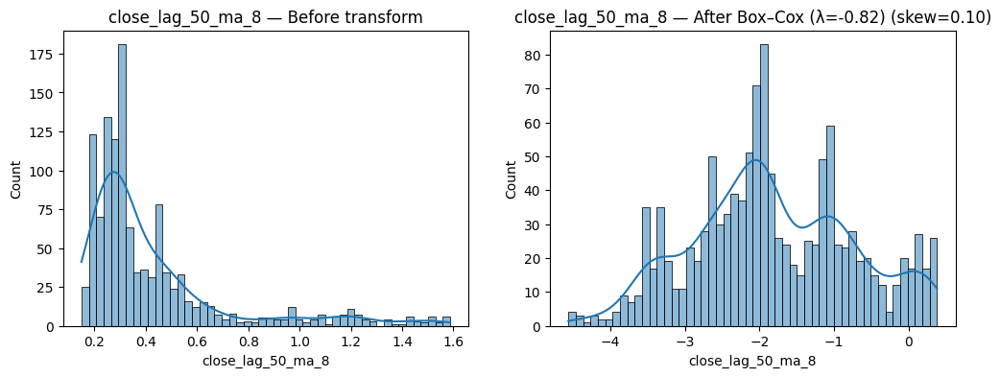

volume_lag_15_ma_15_delta: skewness before = 2.15


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


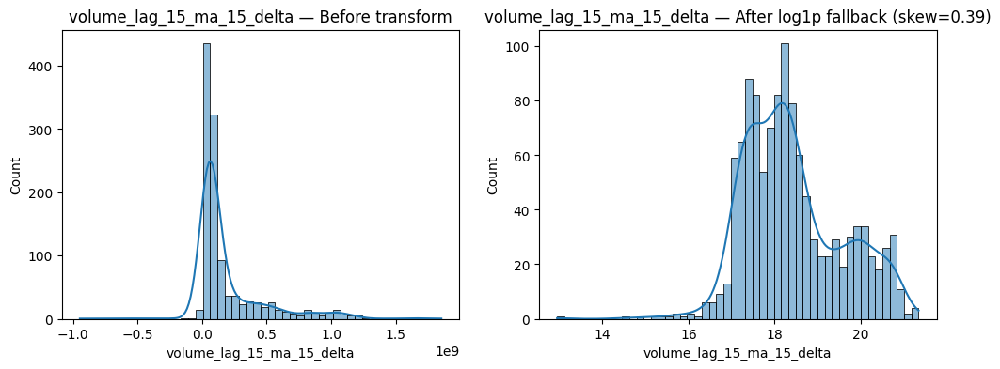

close_lag_50_ma_3_delta: skewness before = 2.14


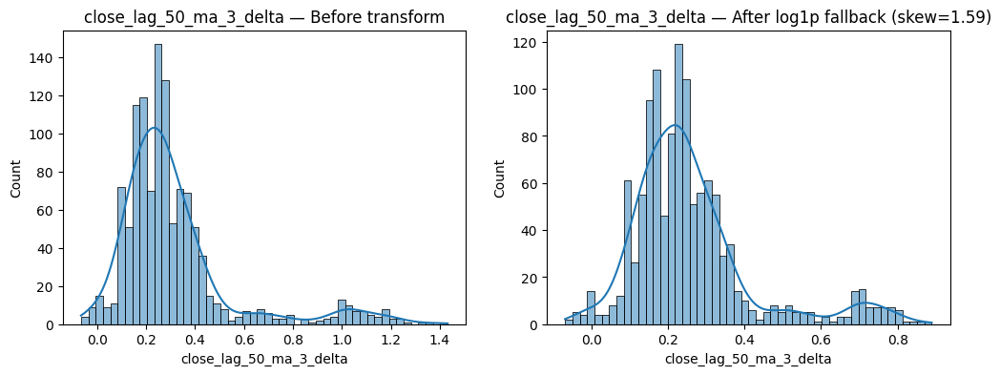

close_lag_50_ma_8_delta: skewness before = 2.13


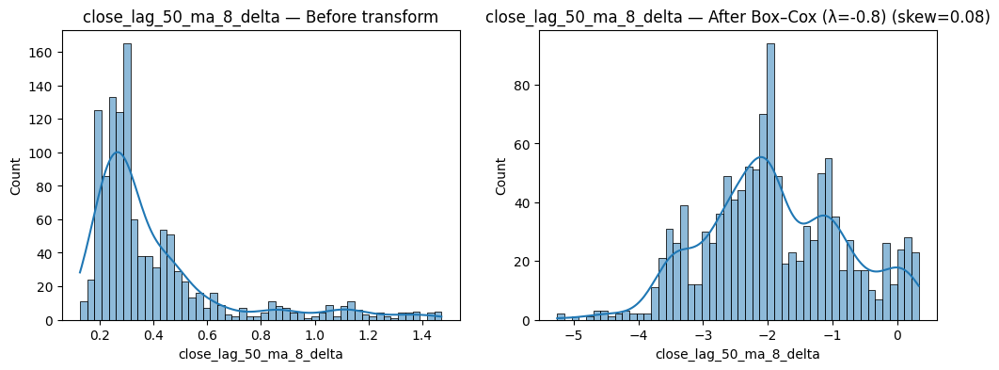

volume_lag_15_ma_15: skewness before = 2.12


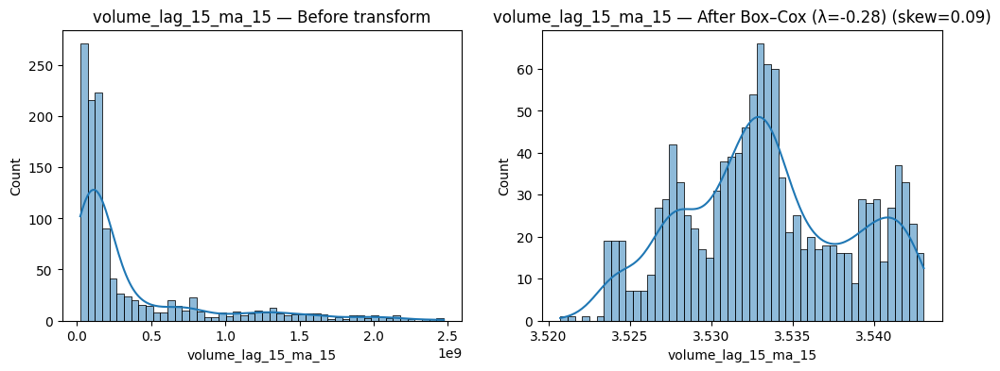

close_lag_30_ma_30_delta: skewness before = 2.11


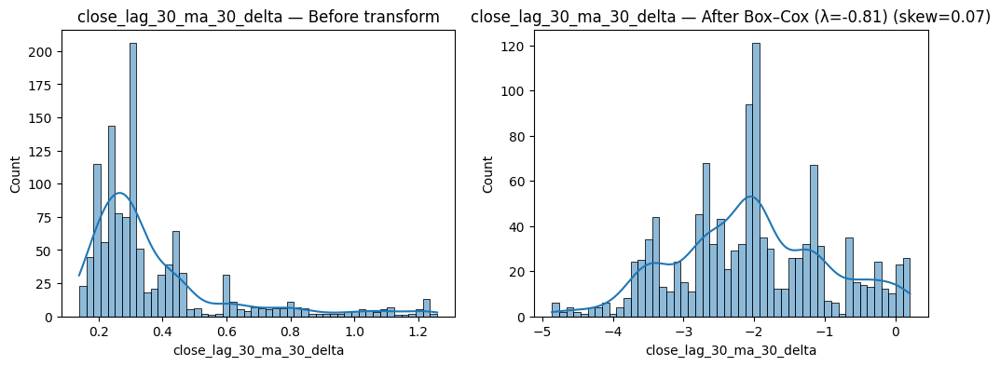

volume_lag_30_ma_15_delta: skewness before = 2.10


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


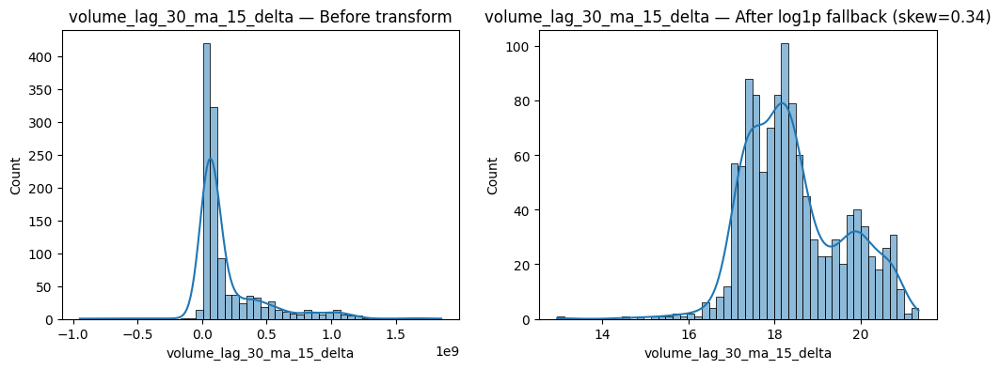

volume_lag_30_ma_15: skewness before = 2.10


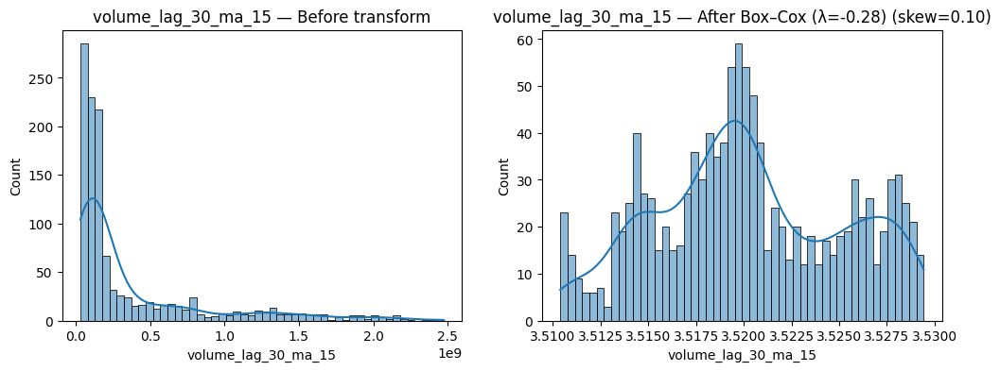

volume_lag_50_ma_15_delta: skewness before = 2.09


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


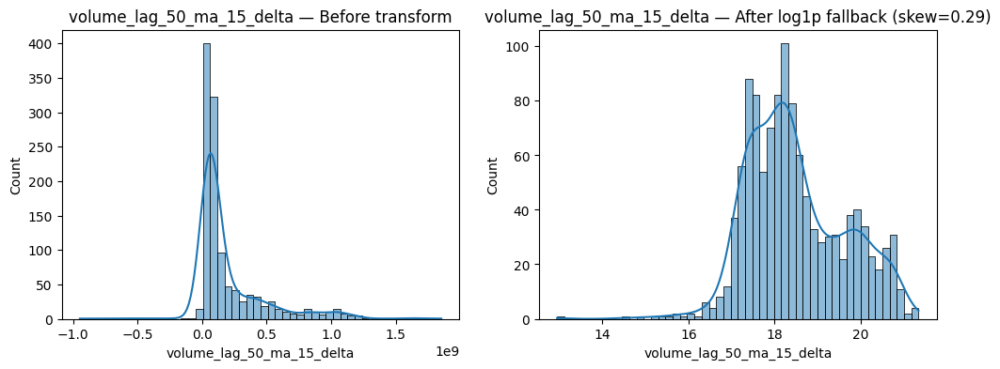

lower_bb_30: skewness before = 2.09


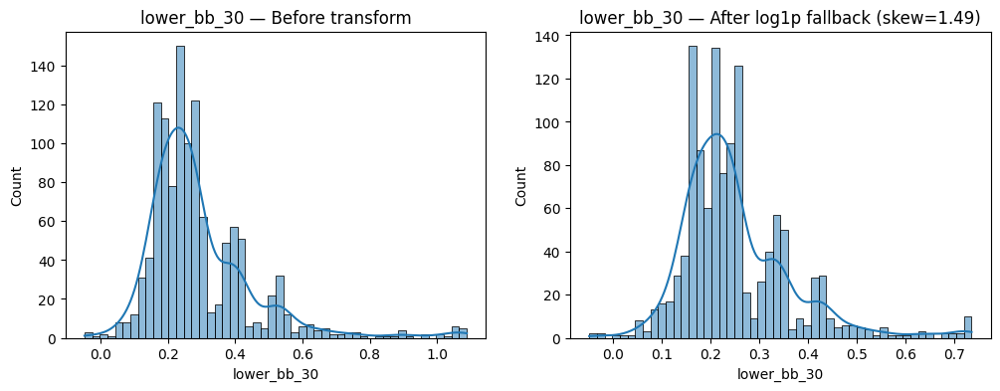

close_lag_30_ma_30: skewness before = 2.09


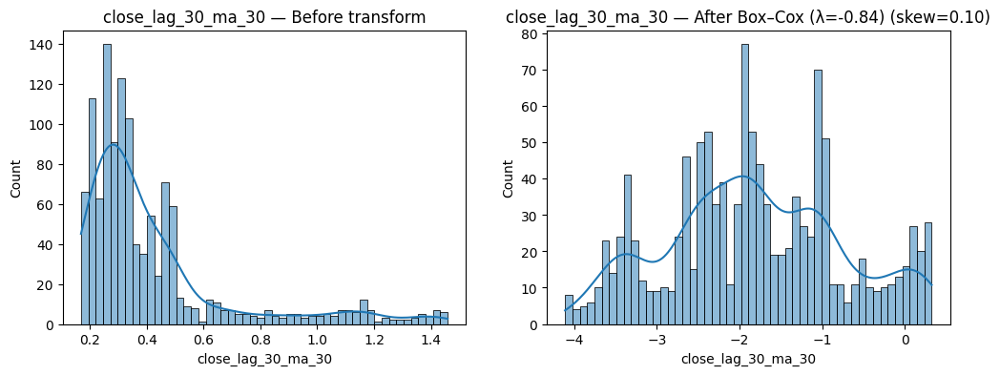

volume_lag_50_ma_15: skewness before = 2.08


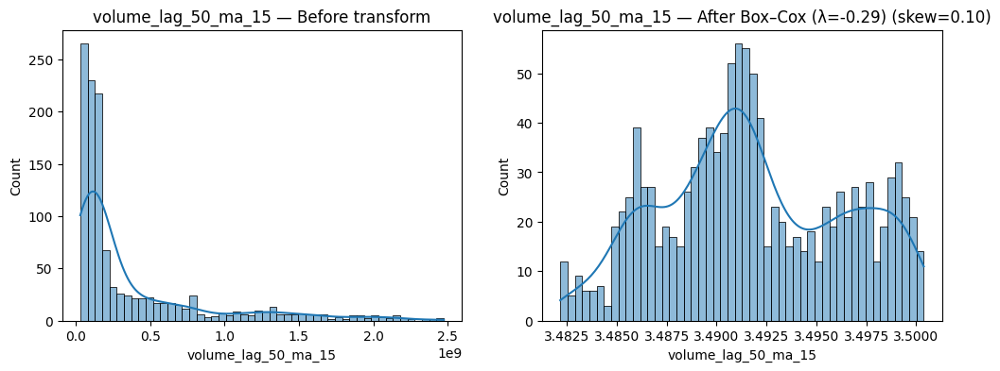

close_lag_50_ma_15: skewness before = 2.07


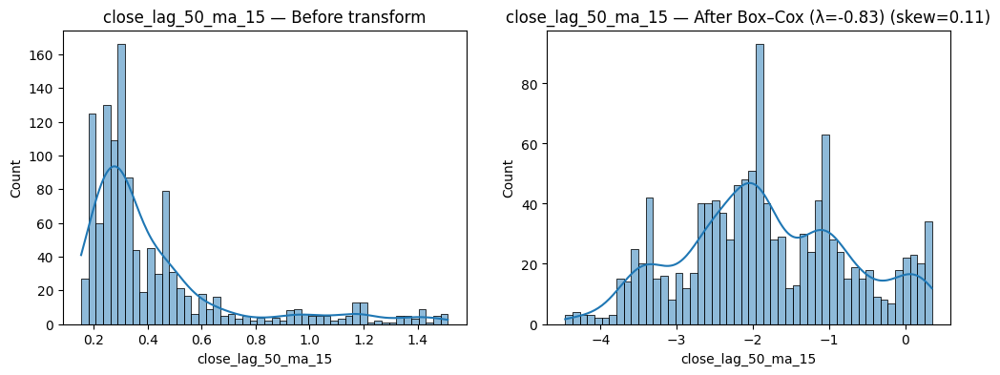

close_lag_50_ma_15_delta: skewness before = 2.03


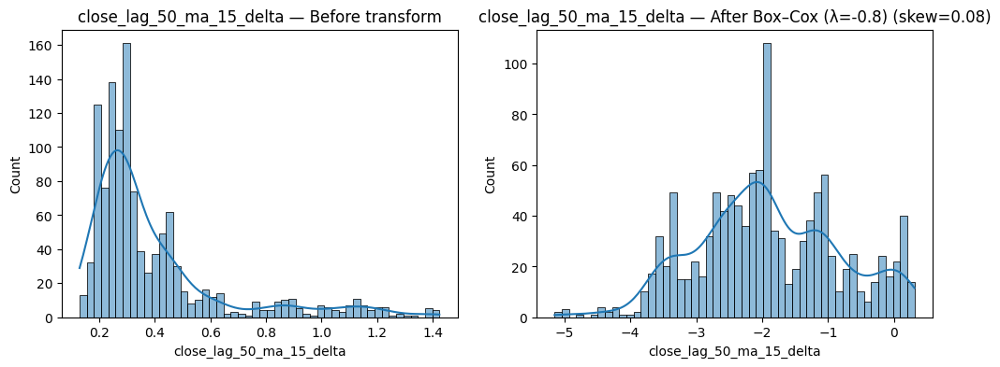

upper_bb_50: skewness before = 2.03


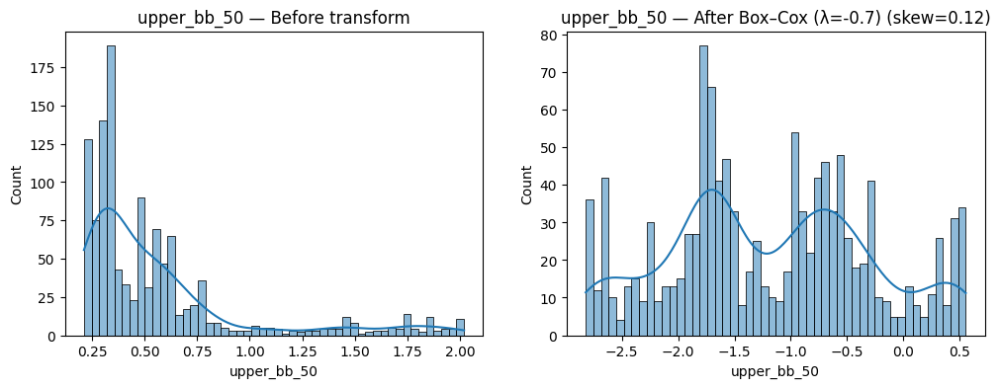

close_lag_5_ma_50: skewness before = 2.02


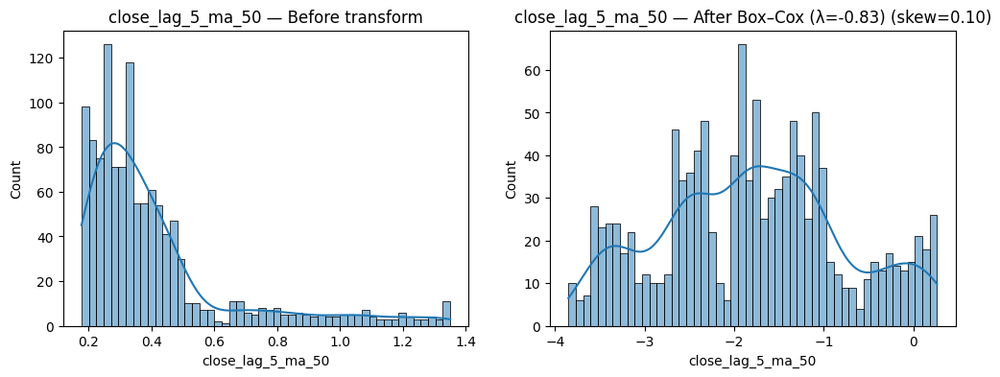

volume_lag_5_ma_21_delta: skewness before = 2.01


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


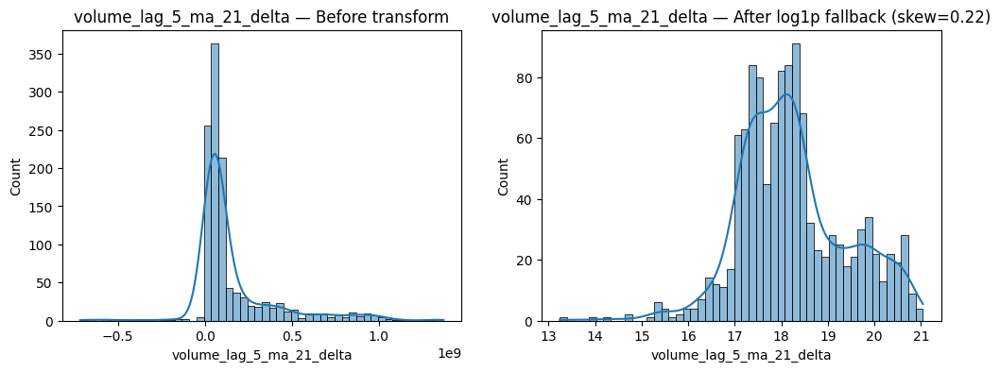

close_lag_50_ma_21: skewness before = 2.01


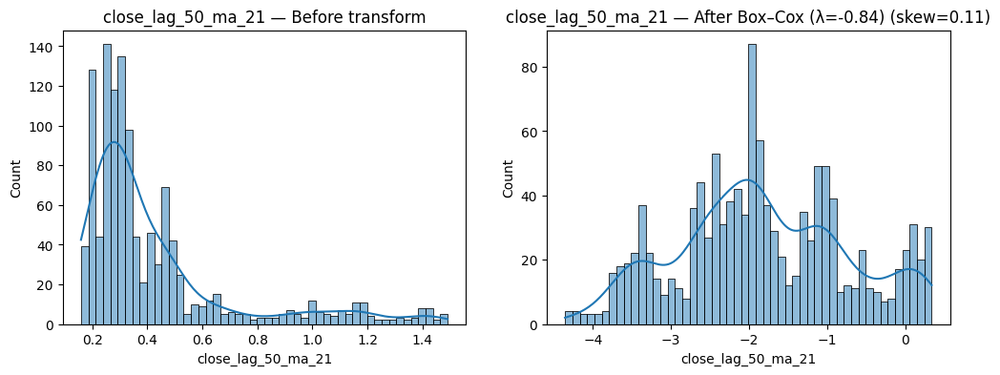

close_lag_50_ma_21_delta: skewness before = 2.00


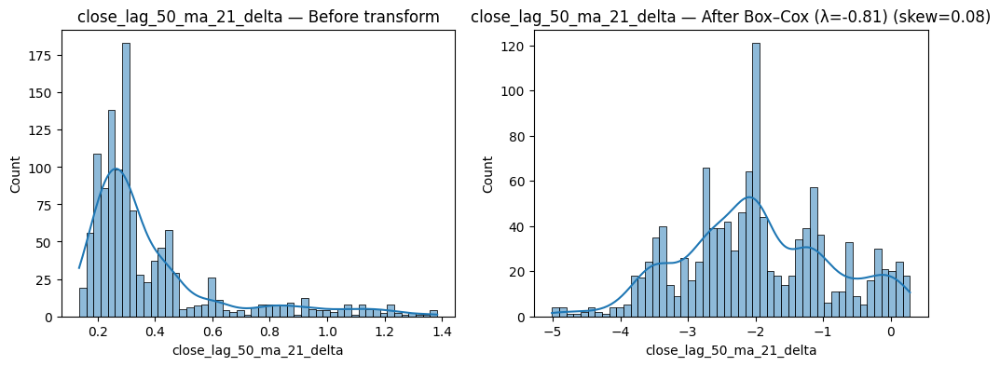

volume_lag_15_ma_21_delta: skewness before = 1.97


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


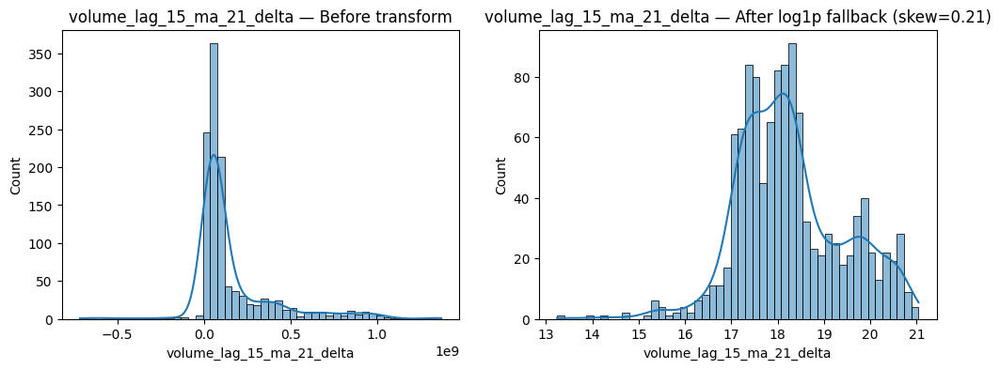

volume_lag_5_ma_21: skewness before = 1.96


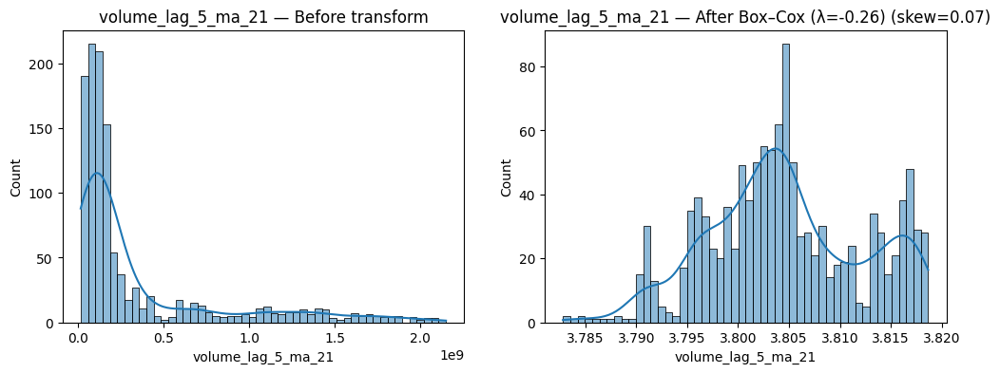

close_lag_15_ma_50: skewness before = 1.96


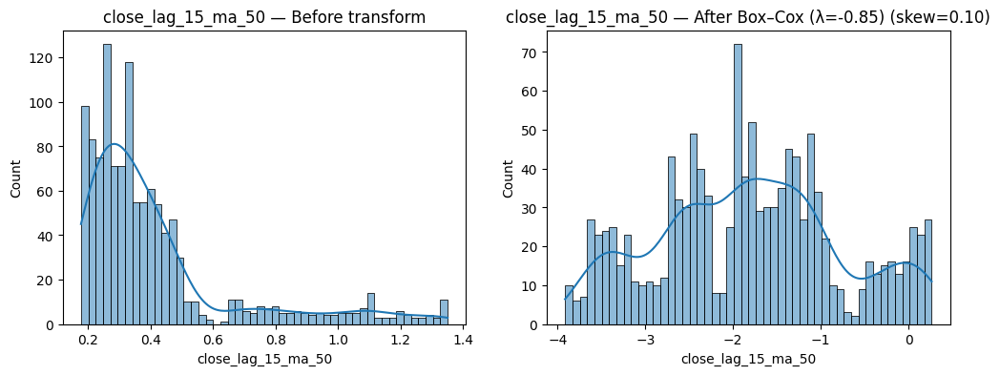

close_lag_50_ma_30_delta: skewness before = 1.95


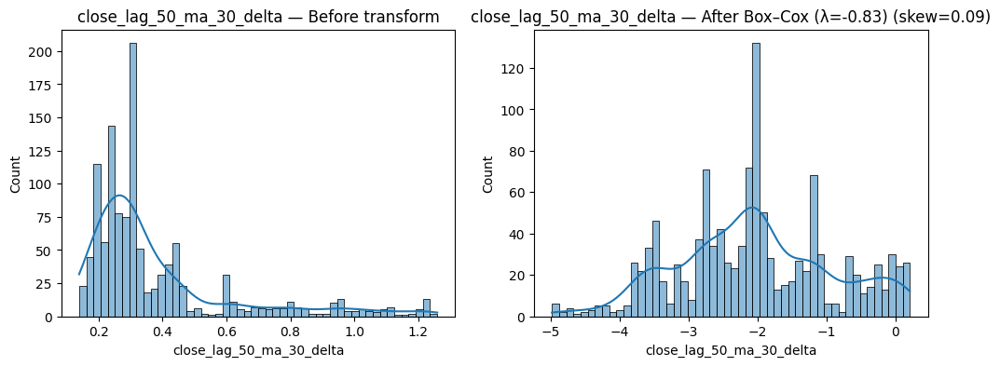

volume_lag_15_ma_21: skewness before = 1.93


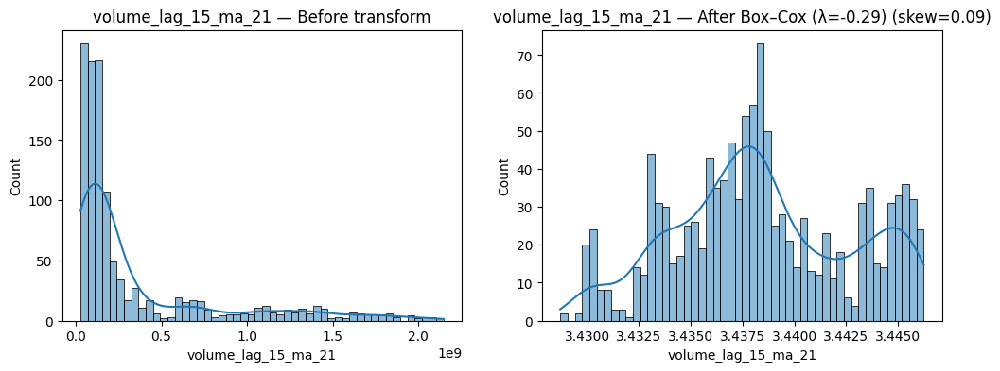

close_lag_50_ma_30: skewness before = 1.93


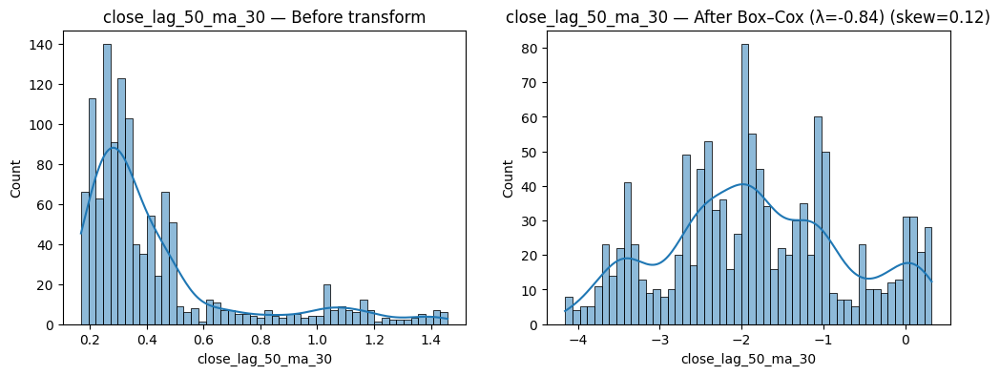

volume_lag_30_ma_21_delta: skewness before = 1.92


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


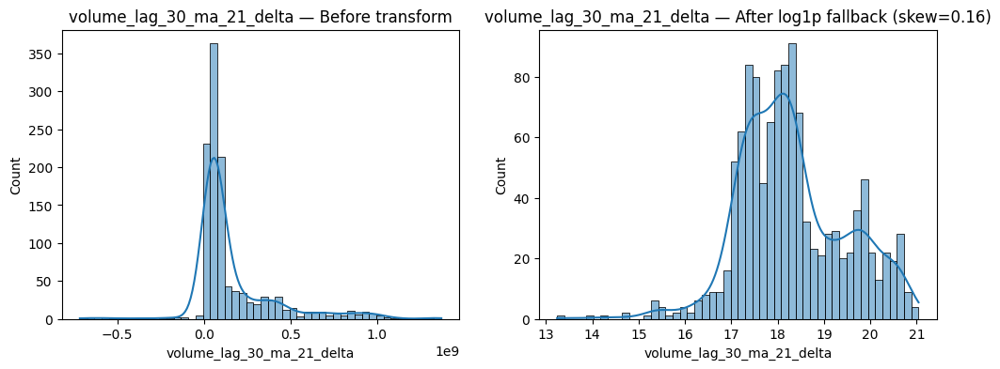

volume_lag_30_ma_21: skewness before = 1.91


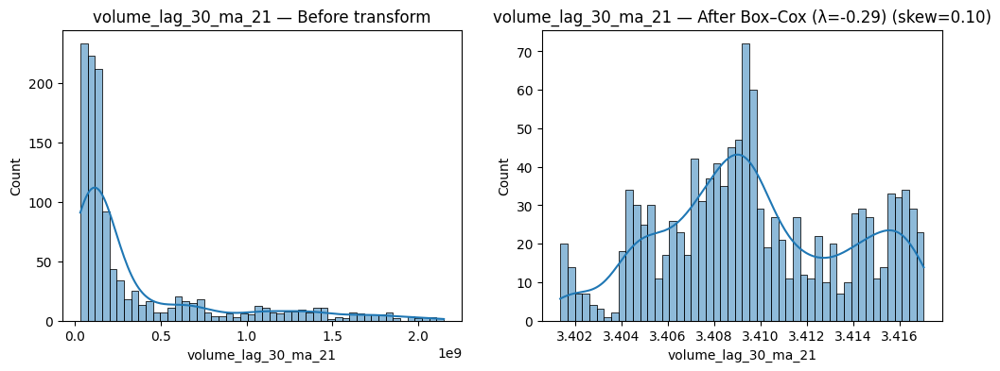

close_lag_5_ma_50_delta: skewness before = 1.90


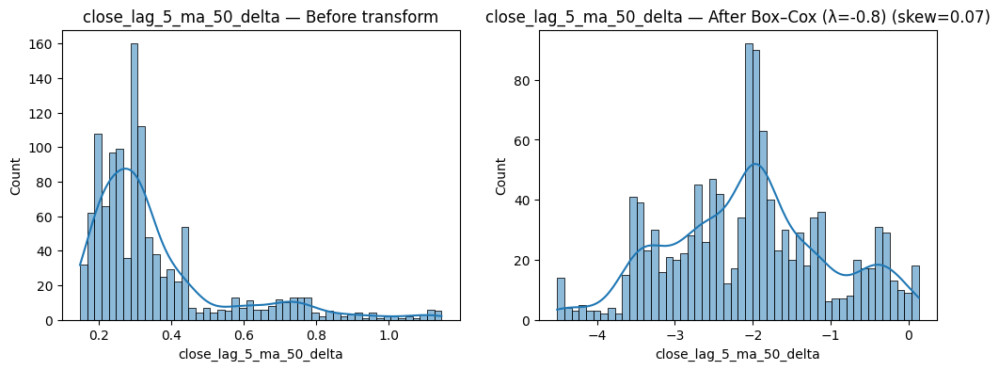

close_lag_15_ma_50_delta: skewness before = 1.90


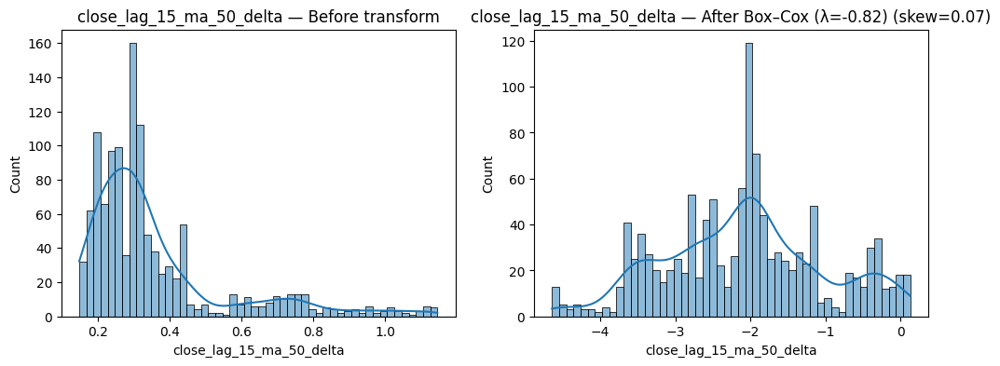

volume_lag_50_ma_21_delta: skewness before = 1.89


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


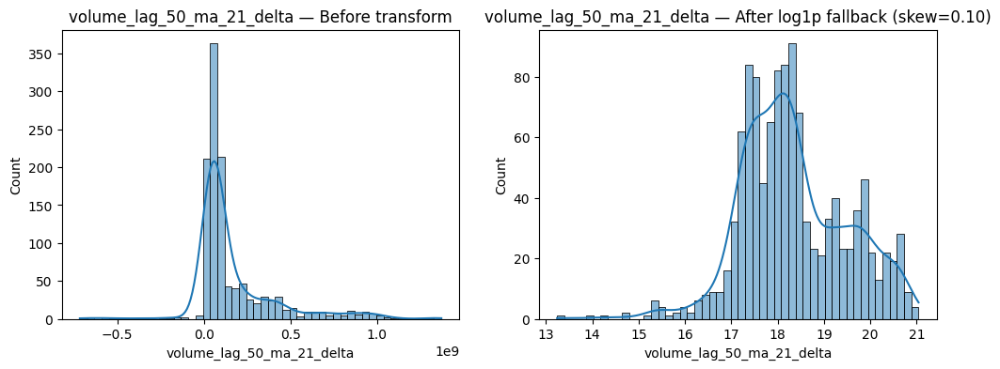

volume_lag_50_ma_21: skewness before = 1.89


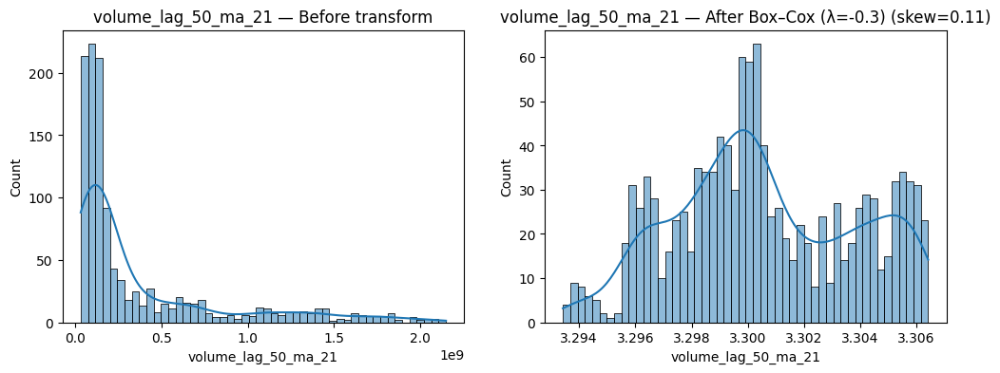

close_lag_30_ma_50: skewness before = 1.86


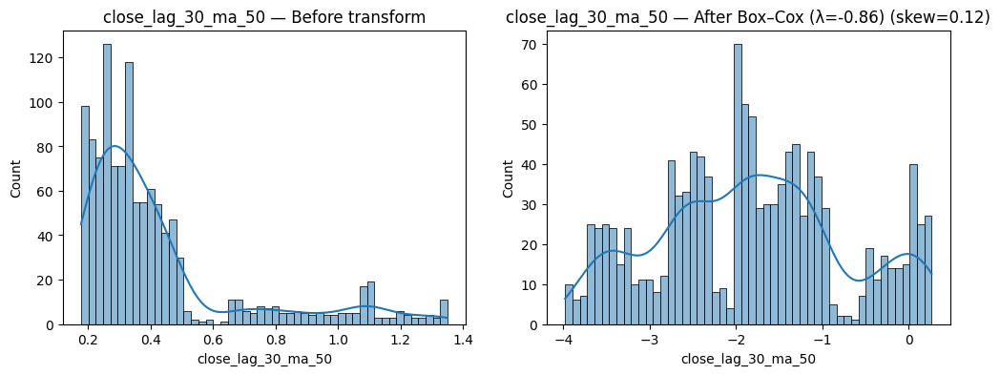

close_lag_30_ma_50_delta: skewness before = 1.84


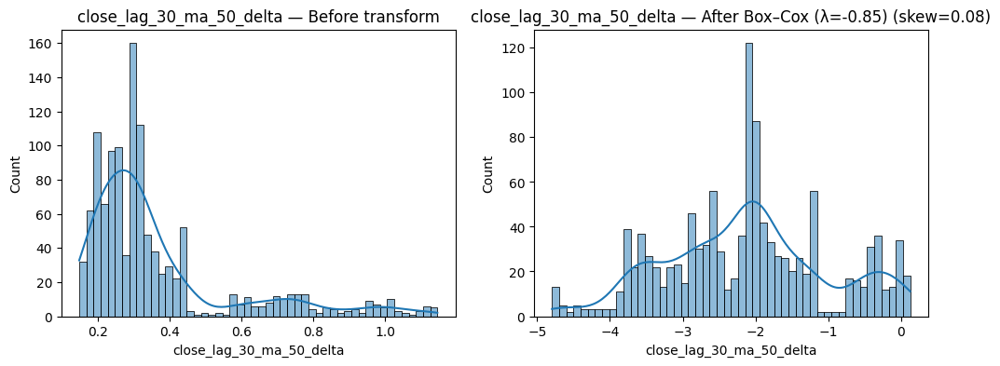

volume_lag_5_ma_30: skewness before = 1.79


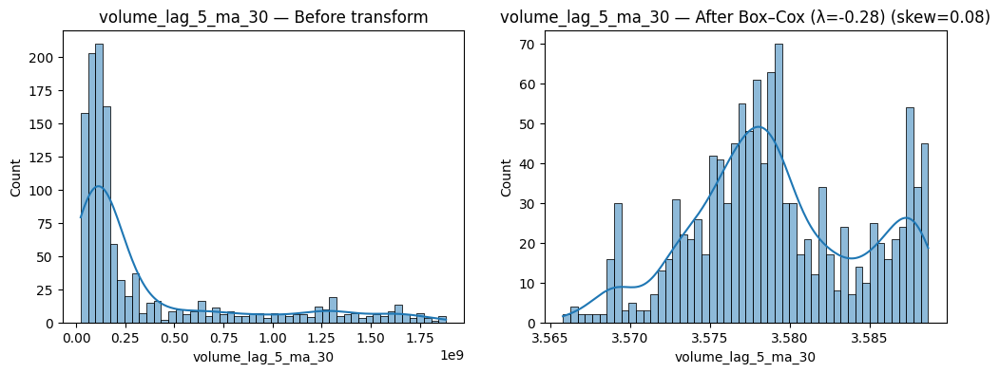

volume_lag_15_ma_30: skewness before = 1.77


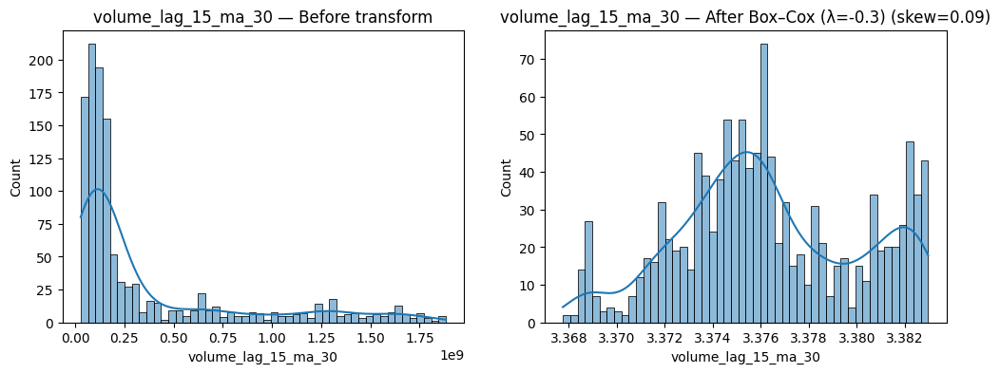

atr_lag5_100: skewness before = 1.75


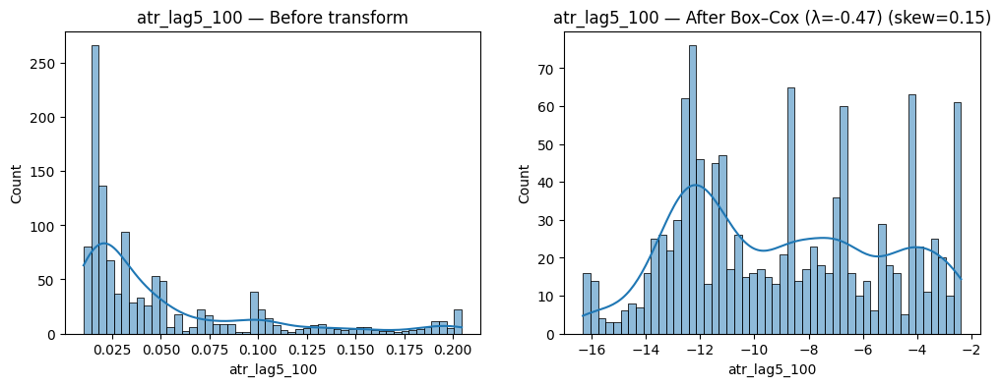

volume_lag_30_ma_30: skewness before = 1.75


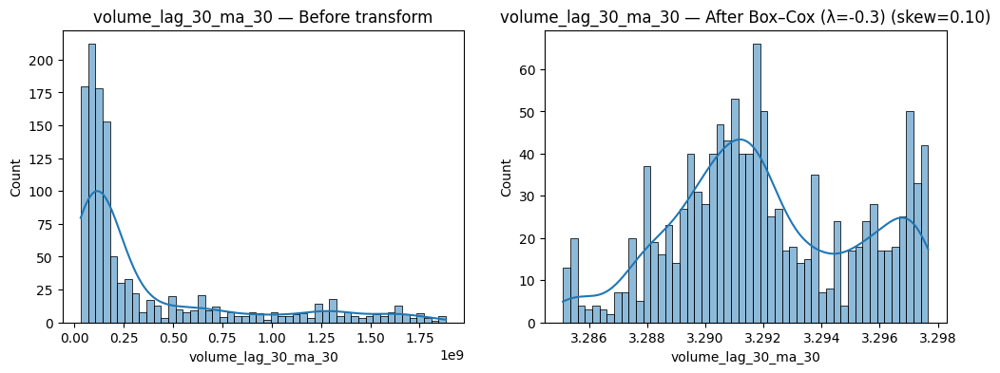

volume_lag_5_ma_30_delta: skewness before = 1.74


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


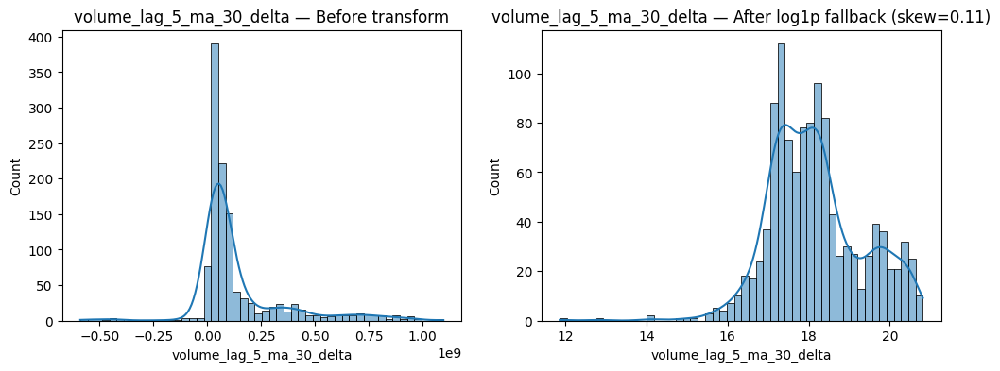

close_lag_30_std_100: skewness before = 1.73


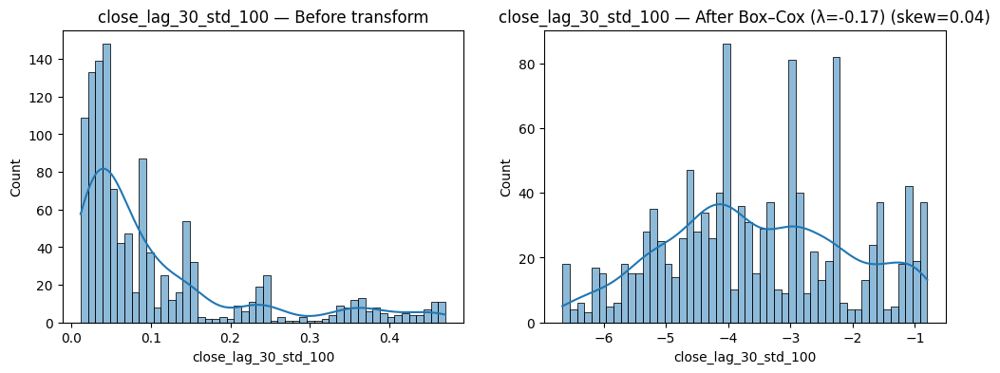

close_lag_15_std_100: skewness before = 1.73


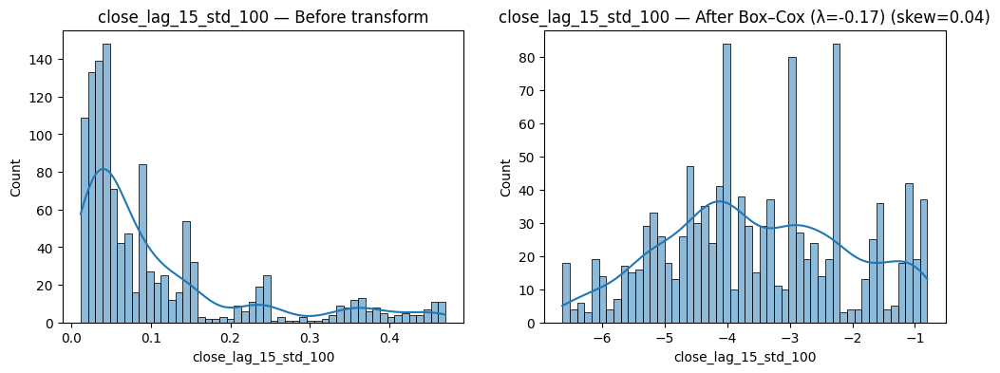

close_lag_5_std_100: skewness before = 1.73


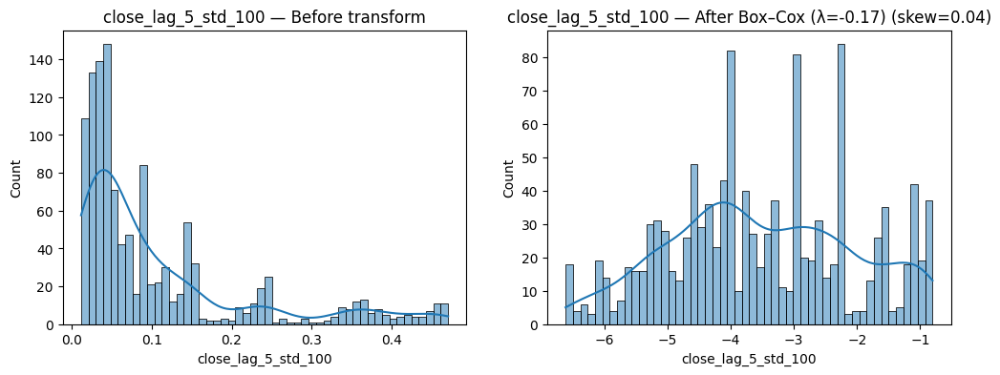

volume_lag_50_ma_30: skewness before = 1.73


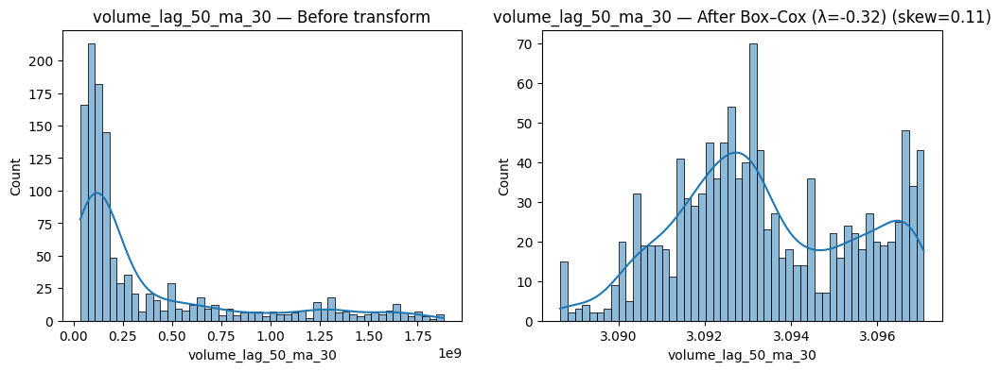

close_lag_50_ma_50_delta: skewness before = 1.73


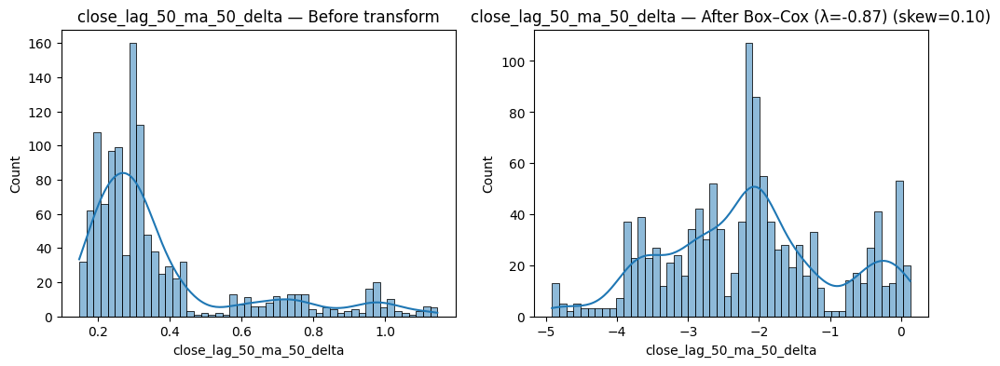

close_lag_50_ma_50: skewness before = 1.72


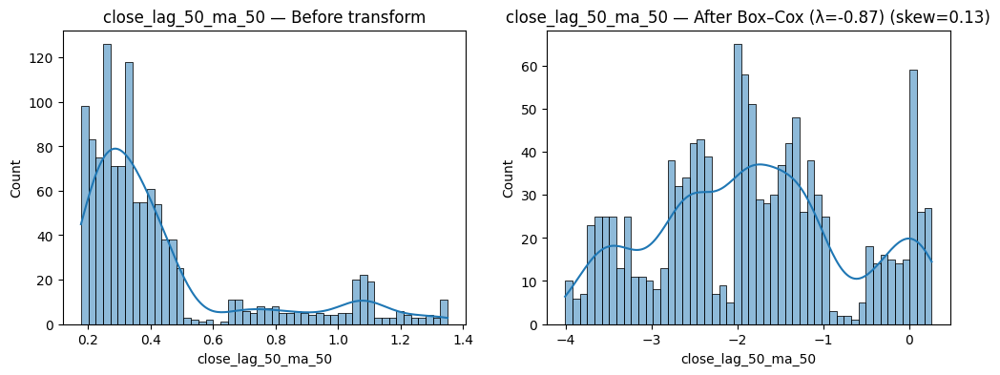

close_lag_50_std_100: skewness before = 1.72


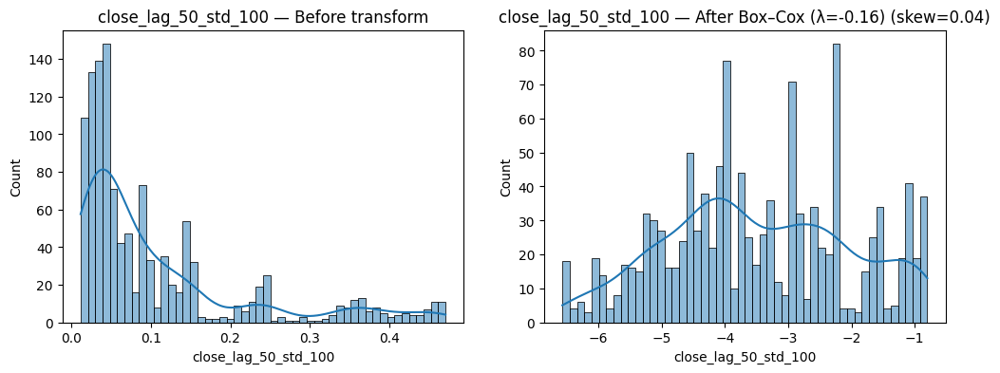

volume_lag_50_std_100: skewness before = 1.70


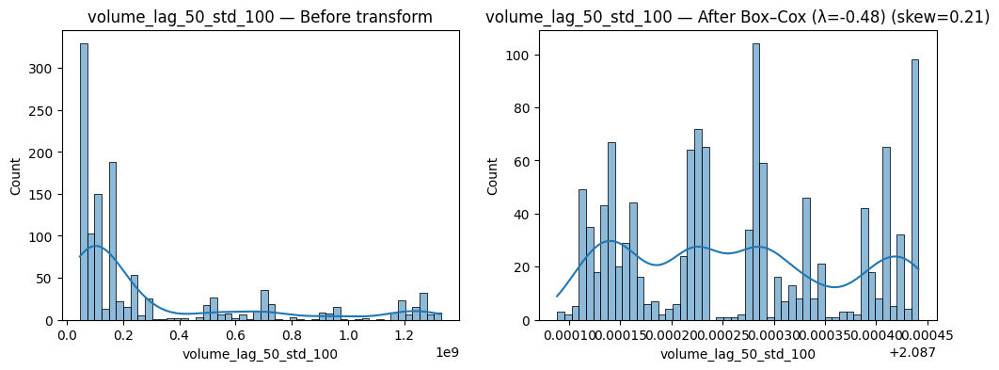

volume_lag_30_std_100: skewness before = 1.70


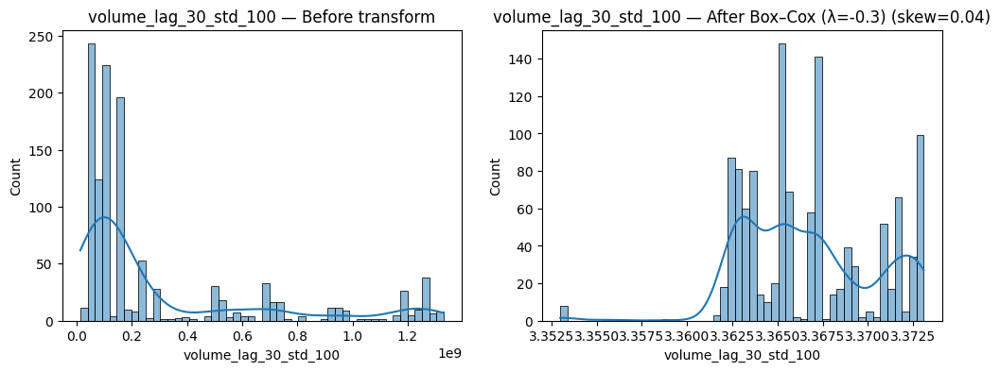

atr_lag15_100: skewness before = 1.70


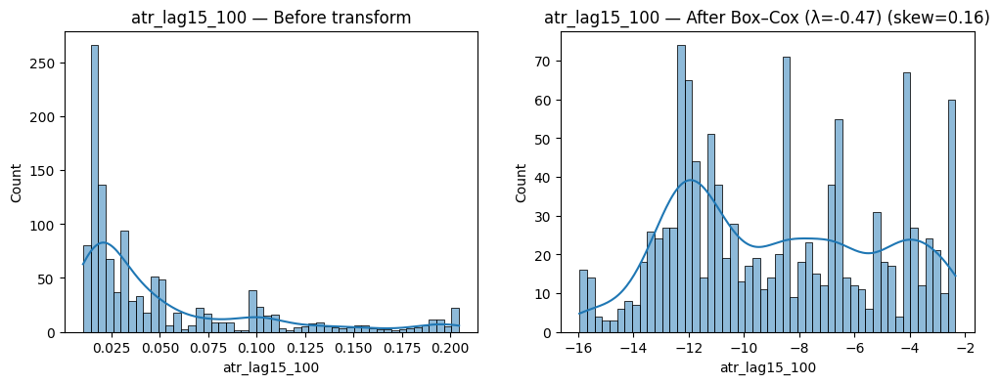

volume_lag_15_std_100: skewness before = 1.70


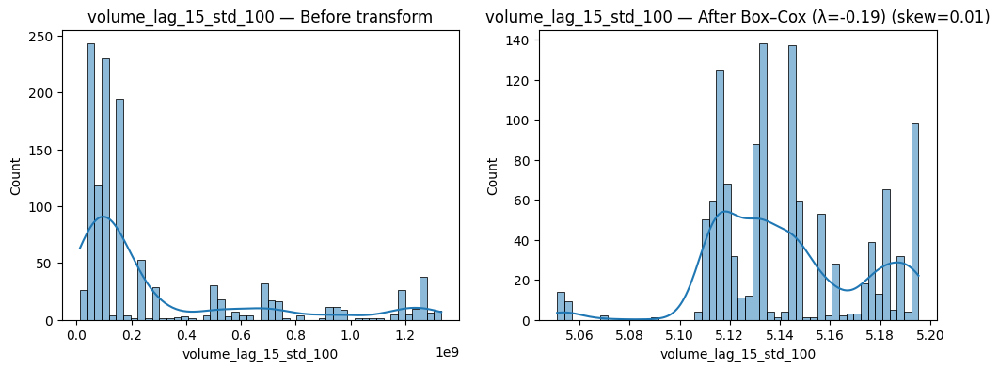

volume_lag_5_std_100: skewness before = 1.70


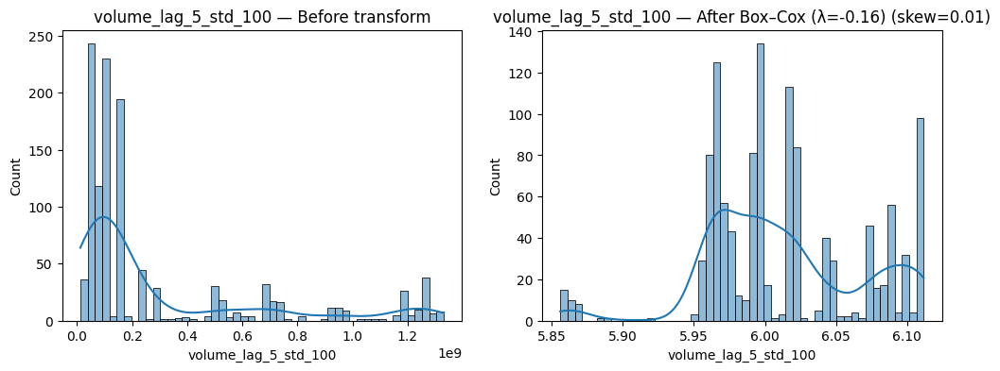

volume_lag_15_ma_30_delta: skewness before = 1.69


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


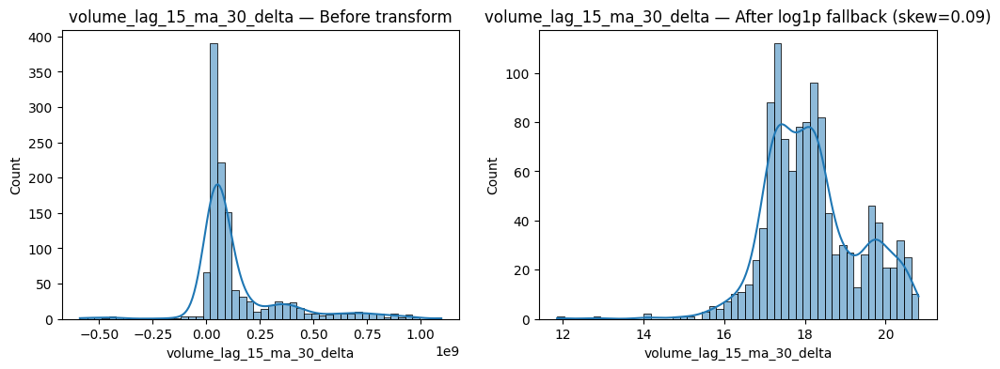

volume_lag_5_ma_50: skewness before = 1.66


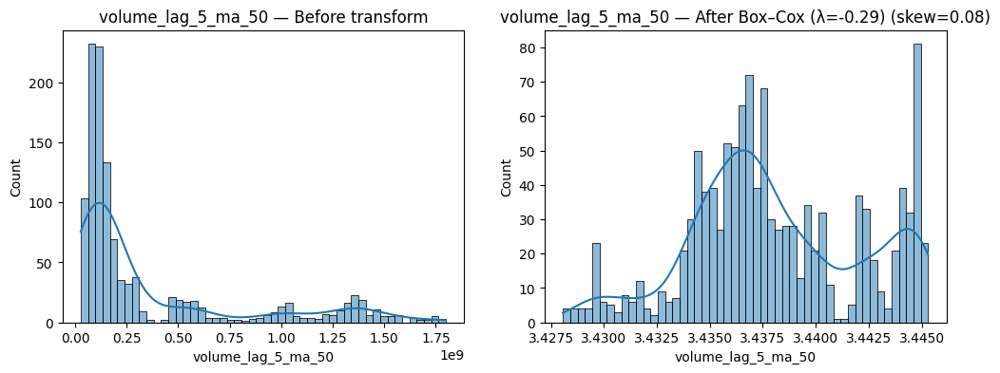

volume_lag_30_ma_30_delta: skewness before = 1.65


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


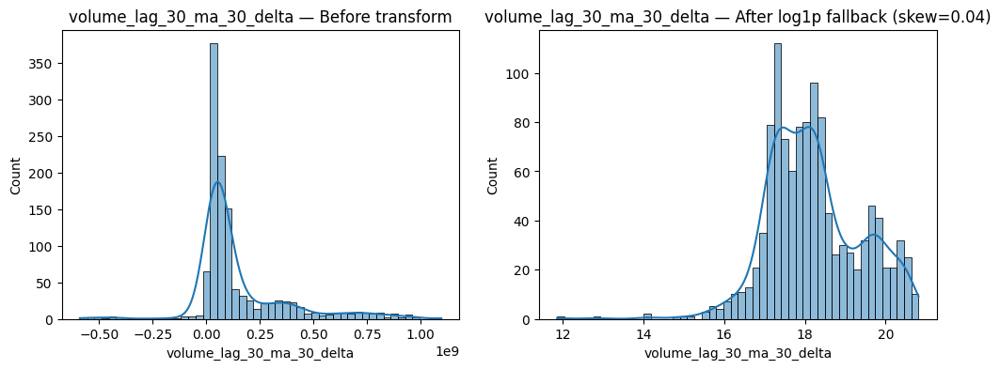

volume_lag_15_ma_50: skewness before = 1.64


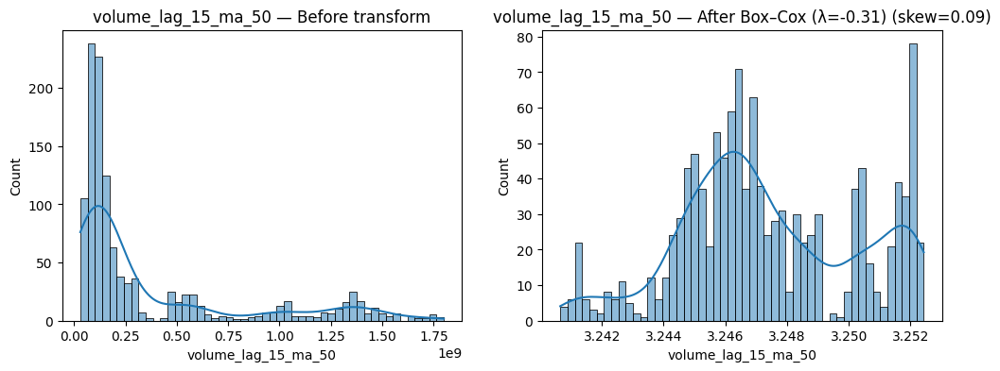

atr_lag30_100: skewness before = 1.64


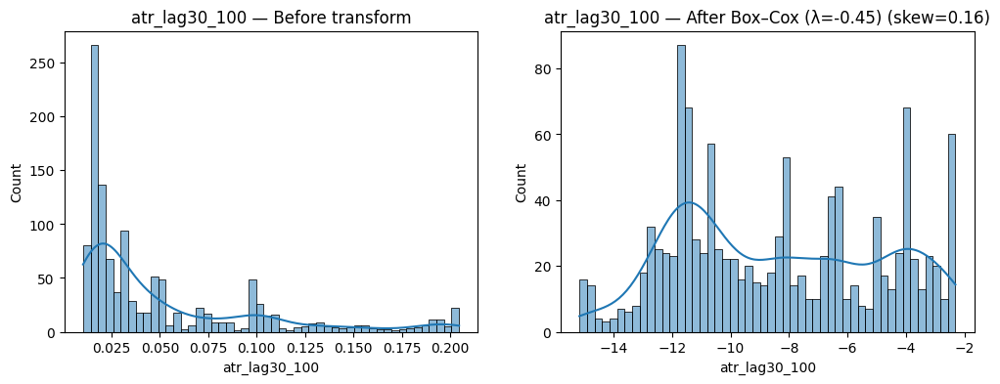

volume_lag_30_ma_50: skewness before = 1.62


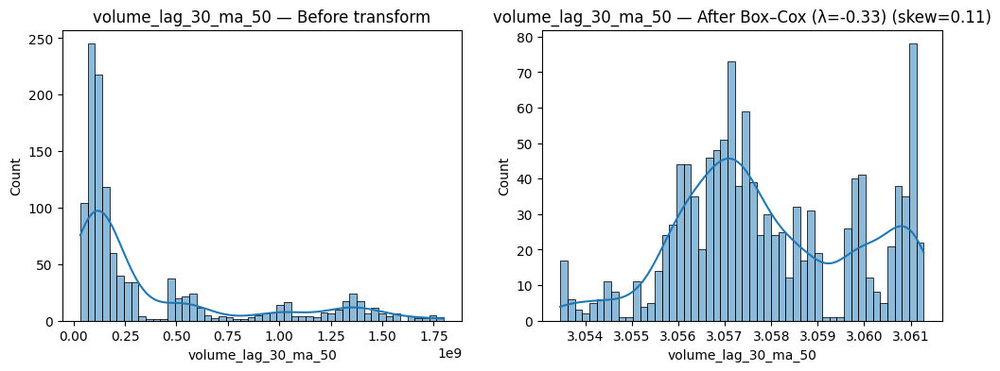

volume_lag_50_ma_30_delta: skewness before = 1.61


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


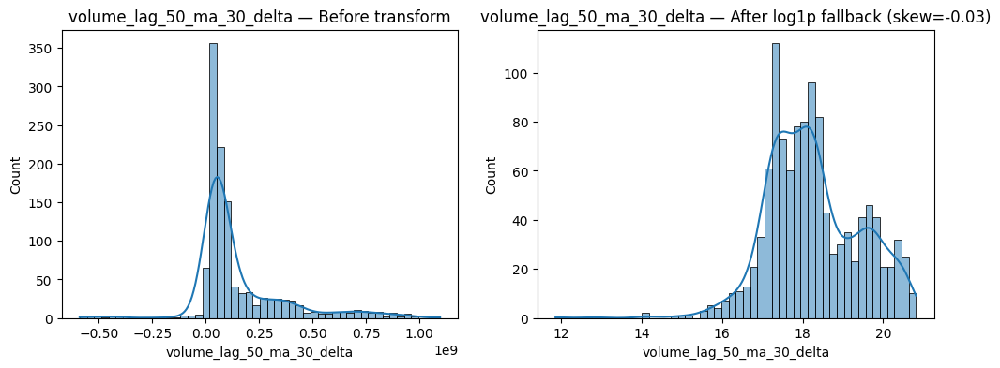

volume_lag_50_ma_50: skewness before = 1.60


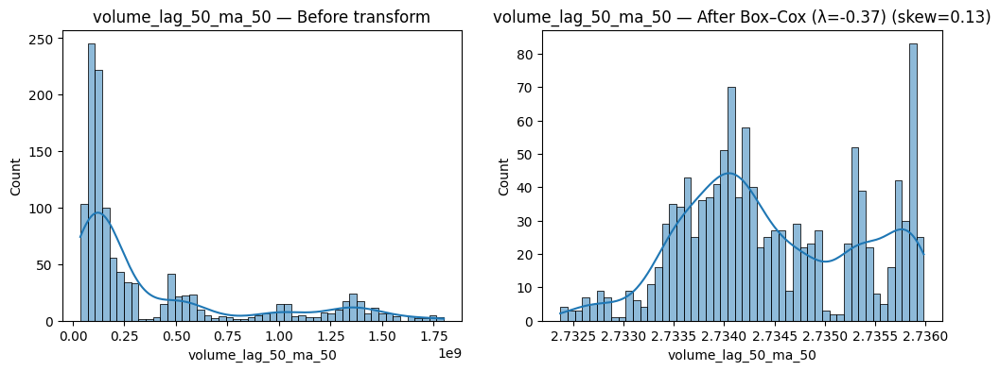

atr_lag50_100: skewness before = 1.57


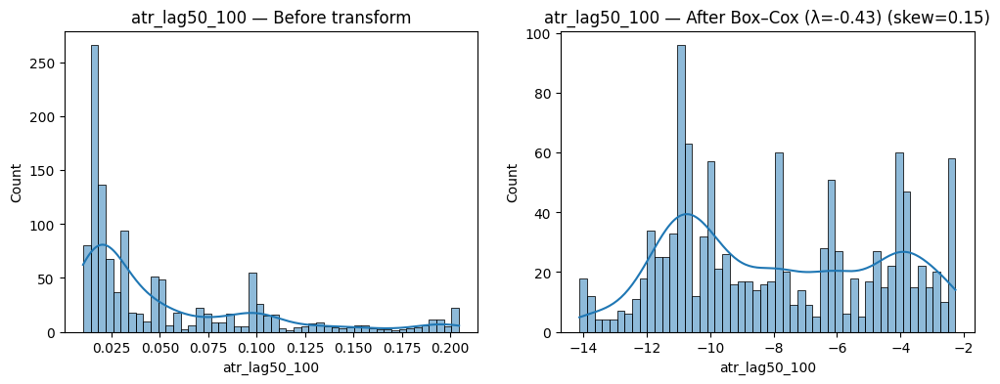

close_lag_30_ma_100_delta: skewness before = 1.55


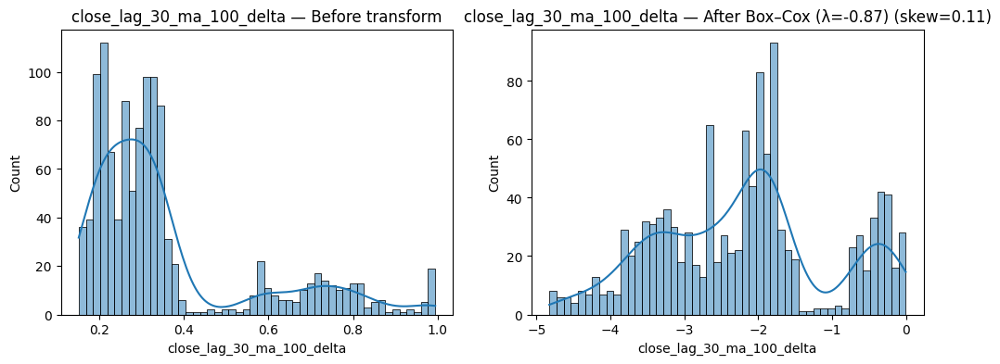

close_lag_15_ma_100_delta: skewness before = 1.54


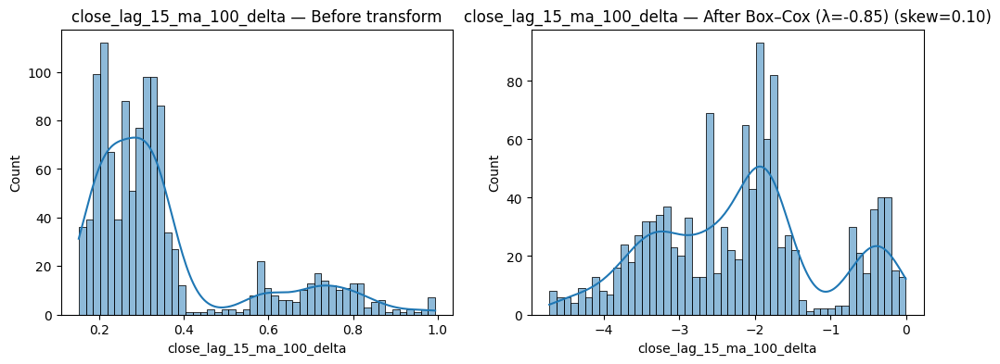

volume_lag_5_ma_50_delta: skewness before = 1.53


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


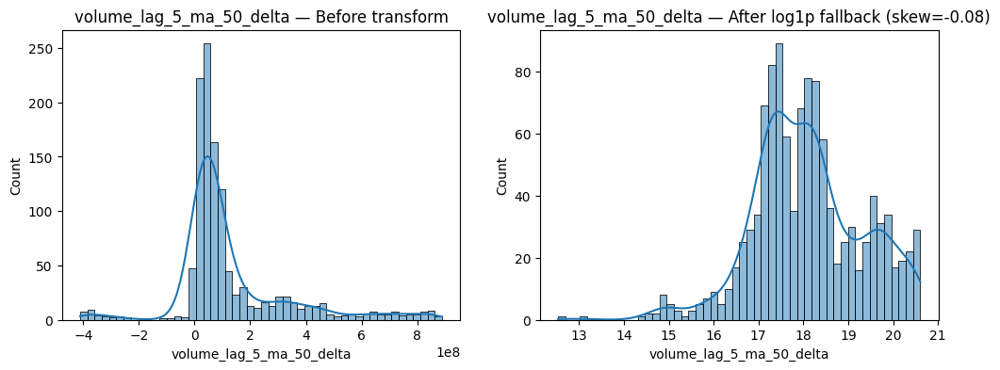

close_lag_5_ma_100_delta: skewness before = 1.50


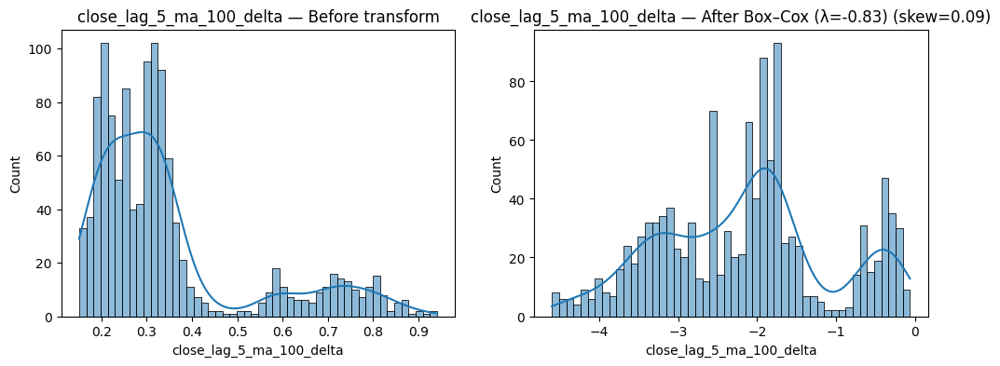

volume_lag_15_ma_50_delta: skewness before = 1.49


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


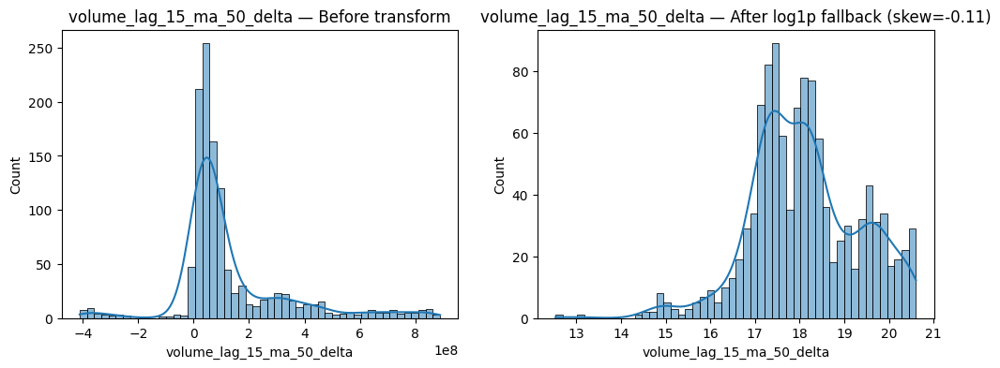

close_lag_5_ma_100: skewness before = 1.49


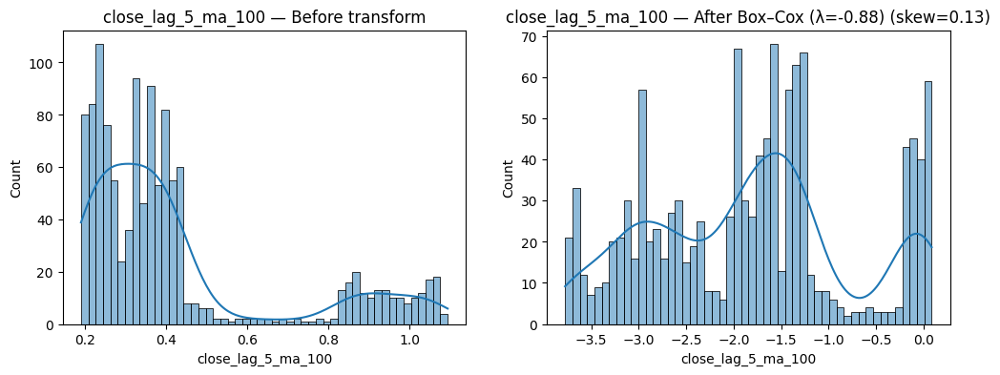

close_lag_50_ma_100_delta: skewness before = 1.48


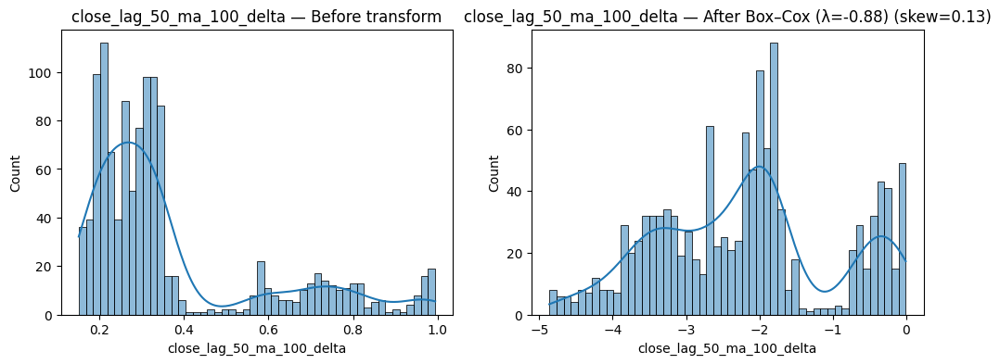

close_lag_15_ma_100: skewness before = 1.46


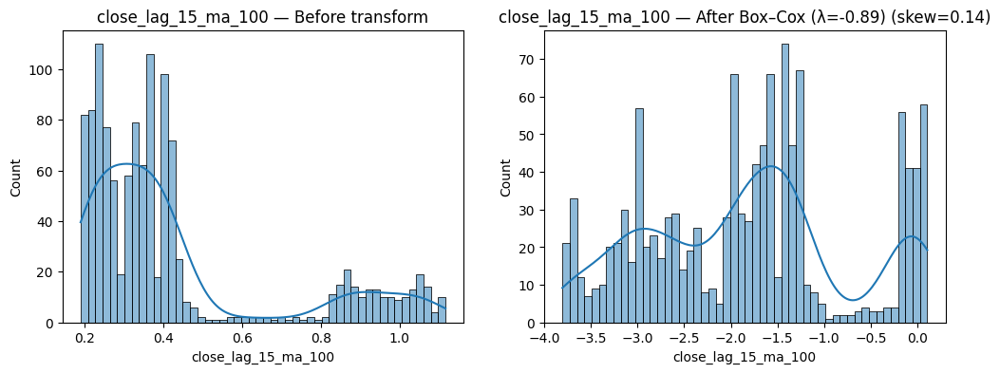

volume_lag_30_ma_50_delta: skewness before = 1.45


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


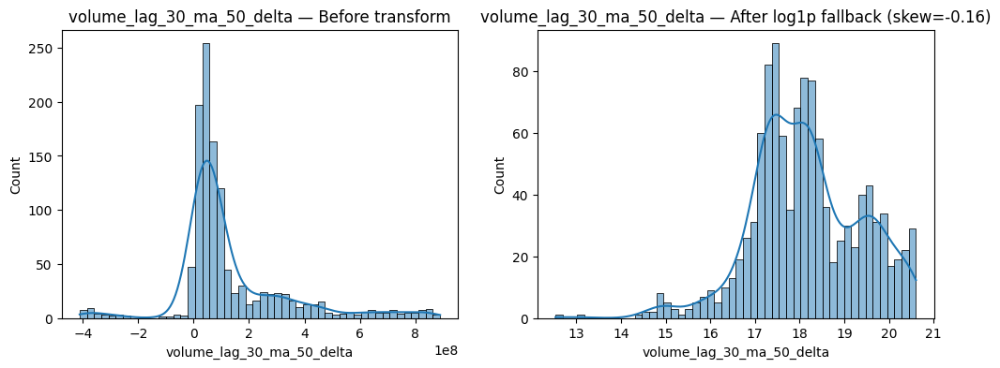

volume_lag_5_ma_100: skewness before = 1.42


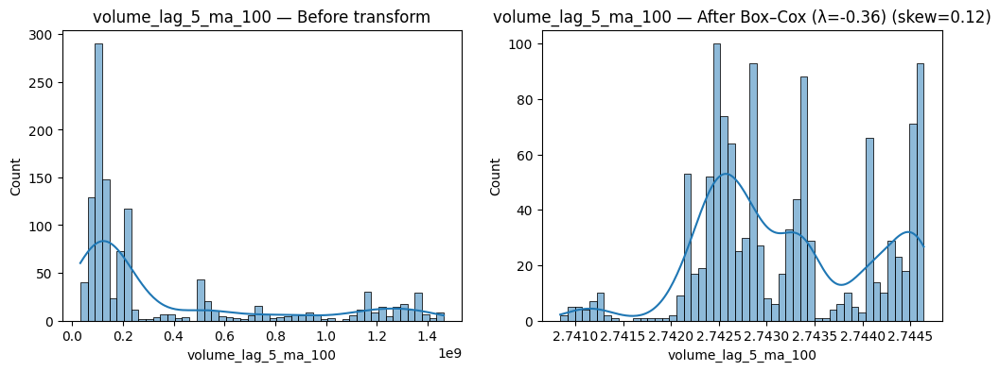

volume_lag_15_ma_100: skewness before = 1.41


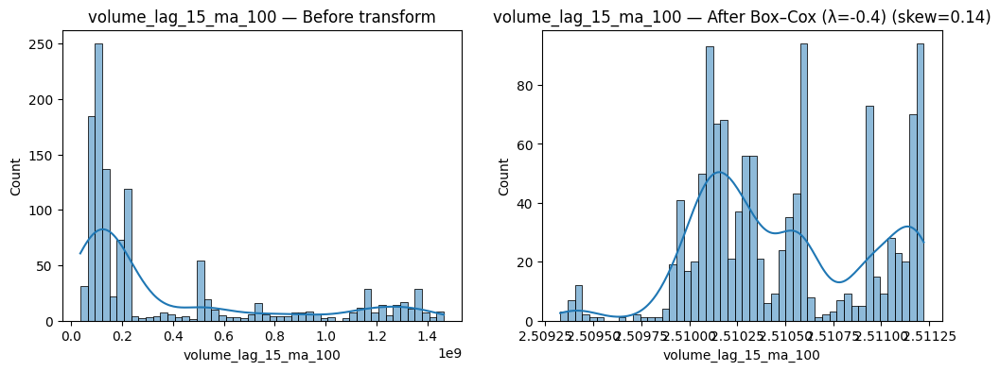

close_lag_30_ma_100: skewness before = 1.41


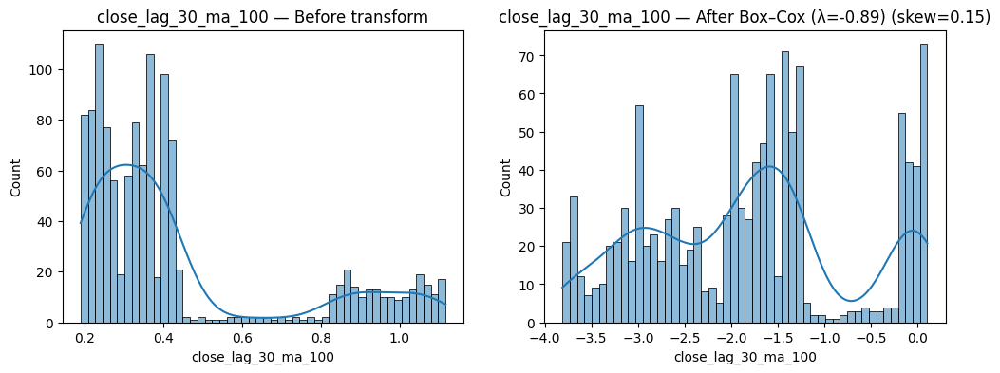

volume_lag_50_ma_50_delta: skewness before = 1.40


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


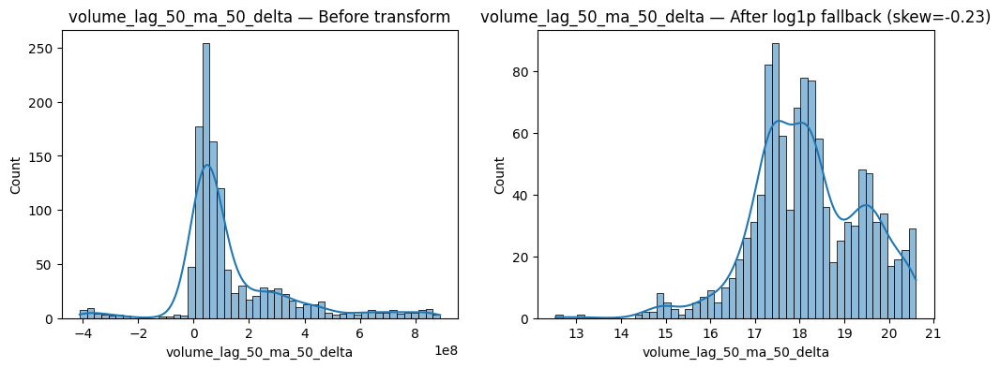

volume_lag_30_ma_100: skewness before = 1.39


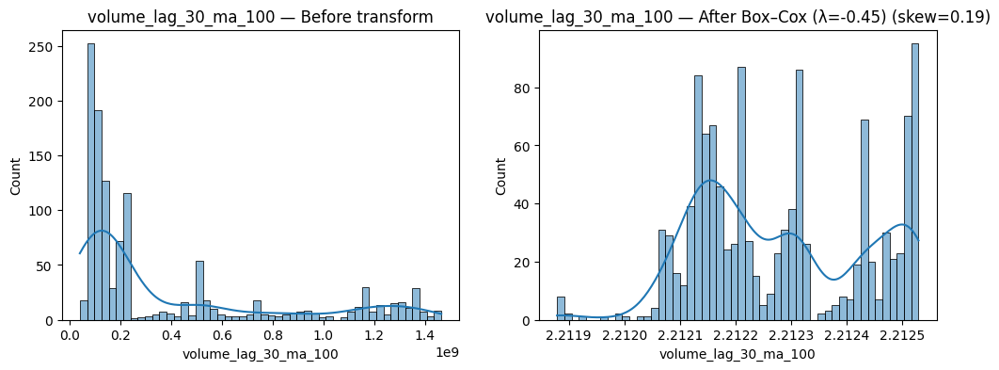

volume_lag_50_ma_100: skewness before = 1.38


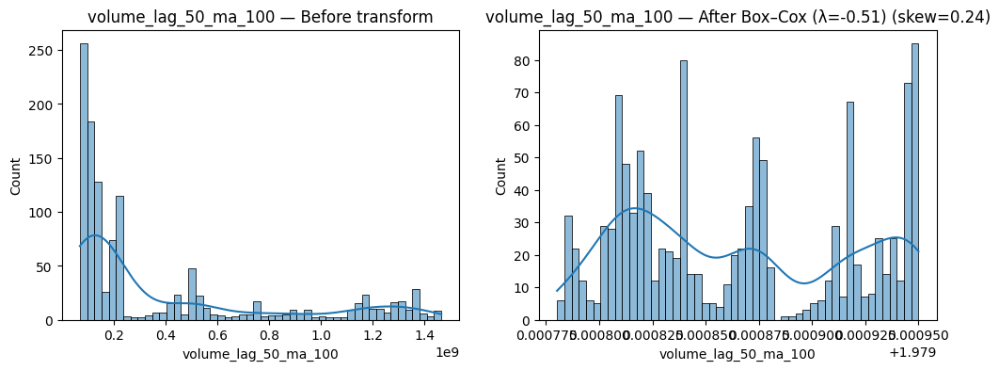

lower_bb_50: skewness before = 1.36


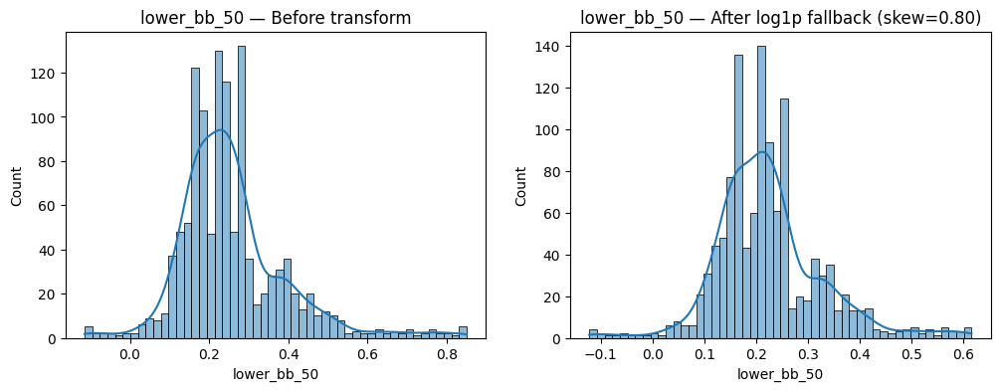

close_lag_50_ma_100: skewness before = 1.30


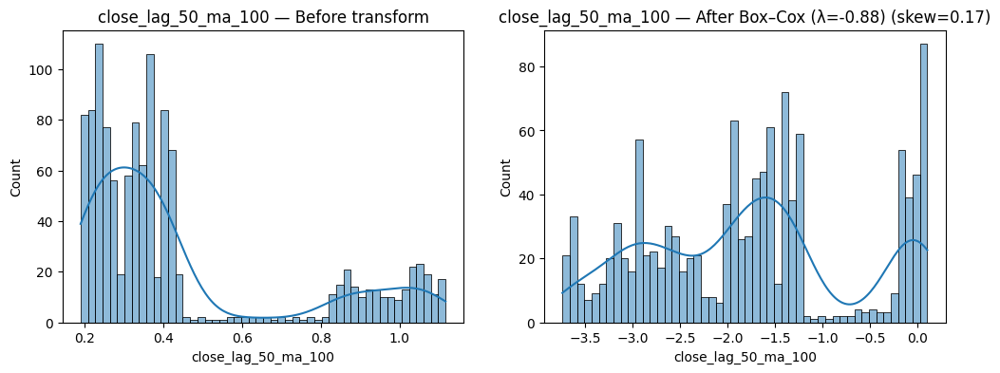

volume_lag_5_ma_100_delta: skewness before = 1.28


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


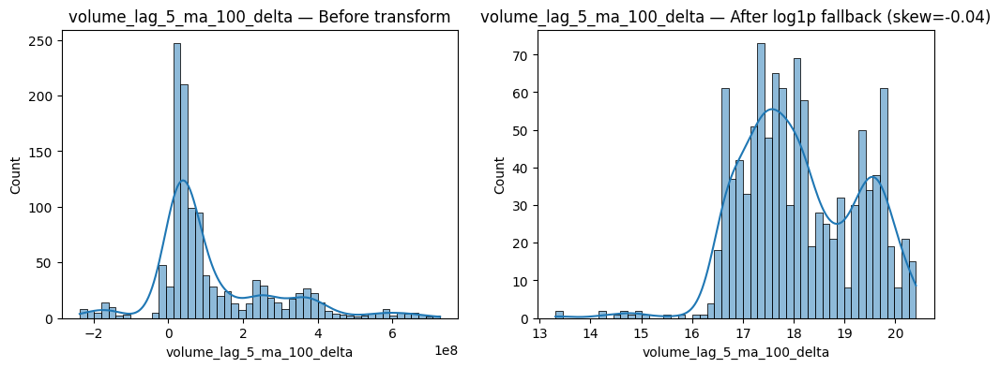

volume_lag_15_ma_100_delta: skewness before = 1.25


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


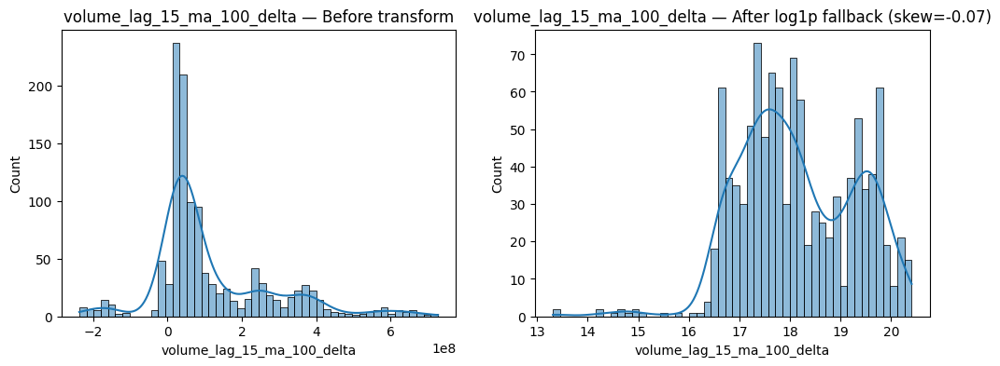

volume_lag_30_ma_100_delta: skewness before = 1.20


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


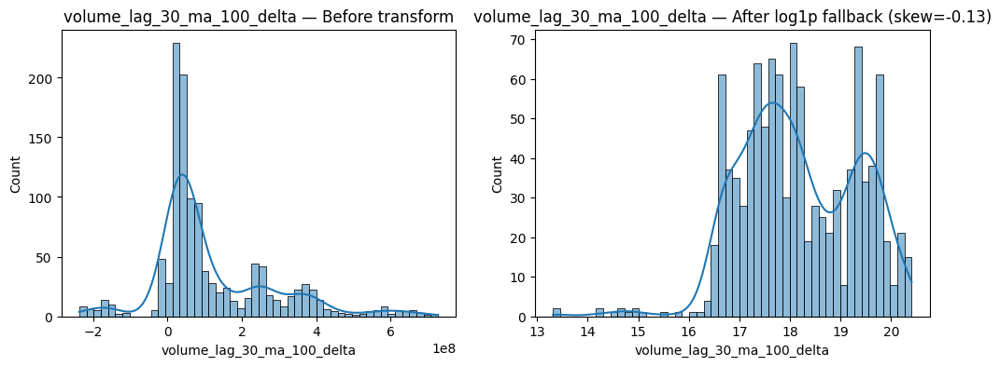

volume_lag_50_ma_100_delta: skewness before = 1.14


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


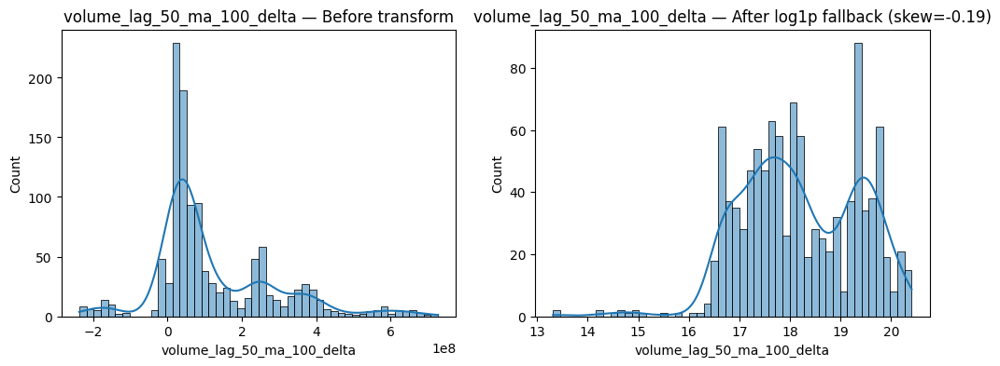


✅ Transformed columns: ['upper_wick', 'volume_lag_5_std_3', 'volume_lag_30_std_3', 'volume_lag_15_std_3', 'volume_lag_50_std_3', 'candle_body', 'lower_wick', 'candle_range', 'volume_lag_5_std_5', 'volume_lag_30_std_5', 'volume_lag_15_std_5', 'volume_lag_50_std_5', 'upper_bb_15_minus_close', 'upper_bb_15_minus_close_lag_1', 'range_pct_prev_close', 'Volume XRP', 'volume_lag_5_std_8', 'volume_lag_30_std_8', 'volume_lag_15_std_8', 'volume_lag_50_std_8', 'close_lag_5_std_3', 'Volume USDT', 'close_lag_15_std_3', 'close_lag_30_std_3', 'close_lag_50_std_3', 'close_lag_5_std_5', 'volume_lag_5_ma_3_delta', 'volume_lag_5_ma_3', 'close_lag_5_std_8', 'volume_lag_15_ma_3', 'volume_lag_5_std_15', 'volume_lag_30_ma_3', 'volume_lag_15_std_15', 'volume_lag_30_std_15', 'volume_lag_50_std_15', 'volume_lag_50_ma_3', 'upper_bb_30_minus_close', 'close_lag_15_std_5', 'bollinger_bandwidth_15', 'upper_bb_30_minus_close_lag_1', 'bollinger_bandwidth_15_lag_1', 'atr_lag5_3', 'close_lag_15_std_8', 'close_lag_30_st

In [5]:
# @title

from scipy.stats import boxcox

def check_and_transform_skewed(df, skew_thresh=1.0):
    """
    Check skewness of numeric columns. For columns with skew > threshold:
    - Try Box–Cox
    - If Box–Cox fails, fallback to log1p
    - If both fail, skip
    Plots before/after histograms. Returns transformed DataFrame + list of transformed columns.
    """
    df = df.copy()
    num_cols = df.select_dtypes(include=[np.number]).columns

    # Filter out likely binary/categorical columns (0/1) by checking nunique
    unique_counts = df[num_cols].nunique()
    non_binary_cols = unique_counts[unique_counts > 2].index.tolist()

    skews = df[non_binary_cols].skew().sort_values(ascending=False)
    skewed_cols = skews[skews > skew_thresh].index.tolist()

    transformed_cols = []

    print(f"\nColumns with skew > {skew_thresh}:\n")
    for col in skewed_cols:
        series = df[col].dropna()

        # safely get skew as a scalar
        skew_before = skews.loc[col]
        if isinstance(skew_before, pd.Series):
            skew_before = skew_before.values[0]
        else:
            skew_before = float(skew_before)

        print(f"{col}: skewness before = {skew_before:.2f}")
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        sns.histplot(series, ax=axes[0], kde=True, bins=50)
        axes[0].set_title(f"{col} — Before transform")

        method = None

        # Try Box–Cox, then log1p fallback
        try:
            transformed_array, lam = boxcox(series.values)
            df.loc[series.index, col] = transformed_array
            method = f"Box–Cox (λ={round(lam,2)})"
        except Exception as e1:
            try:
                df.loc[series.index, col] = np.log1p(series)
                method = "log1p fallback"
            except Exception as e2:
                print(f"⚠️  Could not transform {col}: {e1} | fallback error: {e2}")
                plt.close()
                continue

        transformed_cols.append(col)

        skew_after = df[col].skew()
        sns.histplot(df[col].dropna(), ax=axes[1], kde=True, bins=50)
        axes[1].set_title(f"{col} — After {method} (skew={skew_after:.2f})")
        plt.show()

    print(f"\n✅ Transformed columns: {transformed_cols}")
    return df, transformed_cols



feat_eng, transformed_cols = check_and_transform_skewed(feat_eng)

In [6]:
# @title
model_features = [
    "close_lag_5", "close_lag_15", "close_lag_30", "close_lag_50",
    "volume_lag_5", "volume_lag_15",
    "close_lag_5_ma_5", "close_lag_15_ma_21", "close_lag_30_ma_50", "volume_lag_5_ma_5",
    "close_lag_5_std_5", "close_lag_15_std_21",
    "atr_lag5_21", "atr_lag15_50",
    "candle_body_ratio", "upper_wick_ratio", "lower_wick_ratio", "range_pct_prev_close",
    "bullish_engulfing", "spinning_top",
    "upper_bb_15_minus_close", "lower_bb_15_minus_close",
    "upper_bb_15_minus_close_lag_1", "lower_bb_15_minus_close_lag_1",
    "rsi_5", "rsi_14", "rsi_30",
    "bollinger_bandwidth_15",
  "bollinger_bandwidth_15_lag_1",
  "bollinger_bandwidth_30",
  "bollinger_bandwidth_30_lag_1",
  "bollinger_bandwidth_50",
  "bollinger_bandwidth_50_lag_1",

]

target = 'close'

In [7]:
# @title
feat_eng_clean = feat_eng[model_features + [target]].copy()
# Drop duplicate columns that might have been introduced during feature engineering or selection
feat_eng_clean = feat_eng_clean.loc[:, ~feat_eng_clean.columns.duplicated()]

**Co-Correlations and Correlations to the Target**

In [8]:
# @title
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_features(
    df,
    feature_cols,
    target_col,
    corr_threshold=0.9,
    signal_threshold=0.01,
    plot_heatmap=True
):
    """
    Analyze feature set:
    - find highly correlated feature pairs (|corr| > corr_threshold)
    - find low-signal features (|corr with target| < signal_threshold)
    - optionally plot feature↔feature heatmap
    - return full feature↔target correlations

    Args:
        df: pandas DataFrame
        feature_cols: list of feature column names
        target_col: name of target column
        corr_threshold: float, threshold for inter-feature correlation
        signal_threshold: float, threshold for feature-target correlation
        plot_heatmap: bool, whether to plot feature↔feature heatmap

    Returns: dict
        {
            "high_corr_pairs": [(feature1, feature2, corr_val), ...],
            "low_signal_features": [feature1, feature2, ...],
            "feature_target_corr": pd.Series
        }
    """
    df = df.copy()

    # Check for duplicate column names
    if df.columns.duplicated().any():
        print("⚠️ Warning: Input DataFrame has duplicate column names.")

    # compute feature↔feature correlation matrix
    corr_matrix = df[feature_cols].corr()

    # find high-correlation pairs
    high_corr_pairs = []
    for i, col1 in enumerate(feature_cols):
        for col2 in feature_cols[i+1:]:
            corr_value_selection = corr_matrix.loc[col1, col2]
            if isinstance(corr_value_selection, (pd.Series, pd.DataFrame)):
                corr_val = corr_value_selection.iloc[0]
            else:
                corr_val = corr_value_selection

            if abs(corr_val) > corr_threshold:
                high_corr_pairs.append((col1, col2, corr_val))

    # compute feature↔target correlations
    feature_target_corr = df[feature_cols].corrwith(df[target_col])

    # find low-signal features
    low_signal_features = feature_target_corr[
        feature_target_corr.abs() < signal_threshold
    ].index.tolist()

    # plot heatmap if requested
    if plot_heatmap==True:
        plt.figure(figsize=(12, 10))
        sns.heatmap(
            corr_matrix,
            cmap='coolwarm',
            annot=False,
            cbar=True,
            center=0
        )
        plt.title("Feature ↔ Feature Correlation Heatmap")
        plt.show()

    return {
        "high_corr_pairs": high_corr_pairs,
        "low_signal_features": low_signal_features,
        "feature_target_corr": feature_target_corr
    }


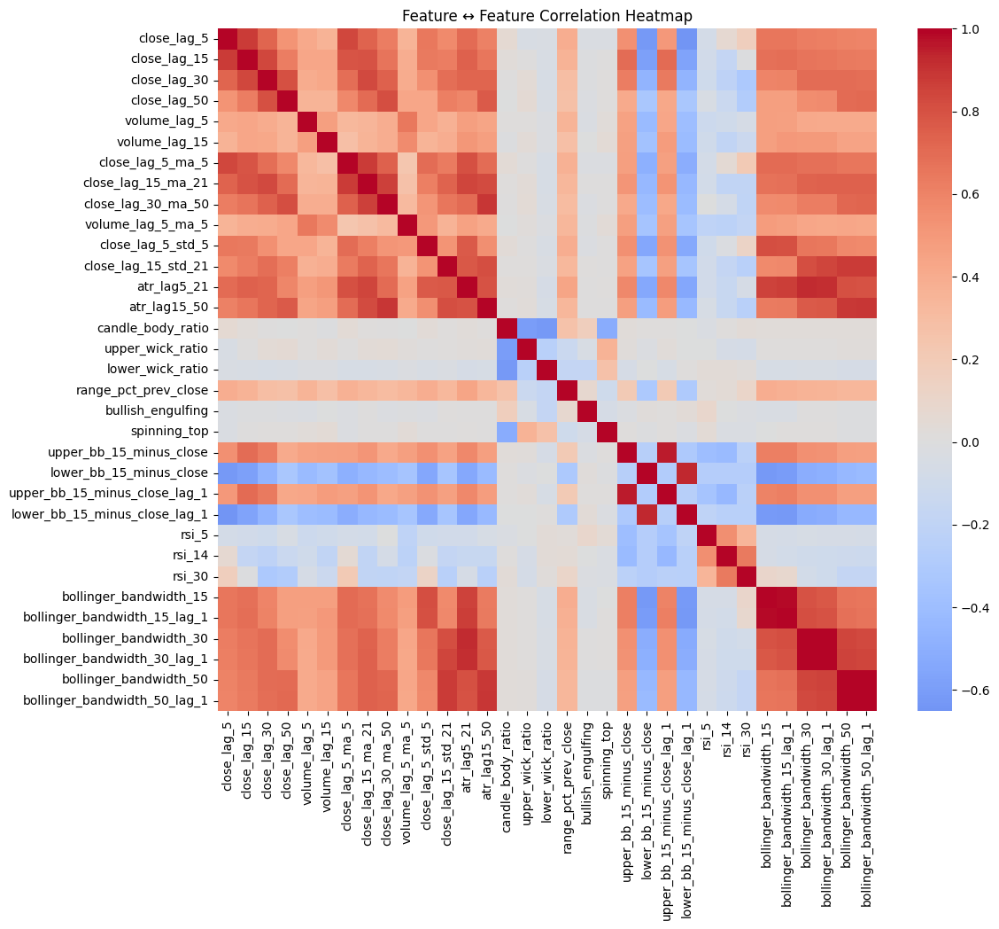

,0
close_lag_5,0.810401
close_lag_15,0.733287
close_lag_30,0.630829
close_lag_50,0.554551
volume_lag_5,0.282033
volume_lag_15,0.261040
close_lag_5_ma_5,0.944630
close_lag_15_ma_21,0.808973
close_lag_30_ma_50,0.720935
volume_lag_5_ma_5,0.164308


In [9]:
# @title
result = analyze_features(
    feat_eng_clean,
    feature_cols=model_features,
    target_col='close',
    corr_threshold=0.9,
    signal_threshold=0.01,
    plot_heatmap=True
)

result["high_corr_pairs"]
result["low_signal_features"]
result["feature_target_corr"]


In [10]:
# @title
# prompt: Get rid of the features that are not correlated with the target and then of the remaining features, get rid of any that are highly correlated to each other.
#may want to get rid of the feature of the pair of correlated features that has the lesser correlation to the target**** not yet implemented.
def filter_features(df, feature_cols, target_col, corr_threshold=0.9, signal_threshold=0.01):
    """
    Filters features based on correlation:
    1. Removes features with low correlation to the target.
    2. From the remaining features, removes one of each pair that are highly correlated to each other.

    Args:
        df: pandas DataFrame.
        feature_cols: list of feature column names.
        target_col: name of the target column.
        corr_threshold: float, threshold for inter-feature correlation.
        signal_threshold: float, threshold for feature-target correlation.

    Returns:
        list: List of names of the selected features.
    """
    df_copy = df[feature_cols + [target_col]].copy()

    # 1. Remove features with low correlation to the target
    feature_target_corr = df_copy[feature_cols].corrwith(df_copy[target_col]).abs()
    high_signal_features = feature_target_corr[feature_target_corr >= signal_threshold].index.tolist()
    print(f"Features kept after removing low signal features ({signal_threshold}): {len(high_signal_features)}")

    if not high_signal_features:
        print("No features remaining after filtering by target correlation.")
        return []

    # Create a correlation matrix for the remaining high-signal features
    corr_matrix = df_copy[high_signal_features].corr().abs()

    # 2. Remove highly correlated features among the remaining
    # Create a mask to avoid redundant pairs and self-correlation
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Find features to drop due to high correlation with another feature
    to_drop_highly_correlated = set()
    for column in upper.columns:
        # Find columns highly correlated with the current column
        highly_correlated_with_col = upper.index[upper[column] >= corr_threshold].tolist()
        # Add the current column to the set if it has high correlation with others
        if highly_correlated_with_col:
            to_drop_highly_correlated.add(column)

    # Determine the final set of features
    final_features = [col for col in high_signal_features if col not in to_drop_highly_correlated]

    print(f"Features dropped due to high inter-correlation ({corr_threshold}): {len(to_drop_highly_correlated)}")
    print(f"Final number of selected features: {len(final_features)}")

    return final_features

# Apply the filtering function
selected_features = filter_features(
    feat_eng_clean,
    feature_cols=model_features,
    target_col='close',
    corr_threshold=0.9, # Keep default or adjust as needed
    signal_threshold=0.01 # Keep default or adjust as needed
)

print("\nSelected features:")
print(selected_features)

# You can now create a new DataFrame with only the selected features and the target
final_df = feat_eng_clean[selected_features + ['close']].copy()
print("\nDataFrame with selected features:")
display(final_df.head())


Features kept after removing low signal features (0.01): 33
Features dropped due to high inter-correlation (0.9): 6
Final number of selected features: 27

Selected features:
['close_lag_5', 'close_lag_15', 'close_lag_30', 'close_lag_50', 'volume_lag_5', 'volume_lag_15', 'close_lag_5_ma_5', 'close_lag_15_ma_21', 'close_lag_30_ma_50', 'volume_lag_5_ma_5', 'close_lag_5_std_5', 'close_lag_15_std_21', 'atr_lag5_21', 'atr_lag15_50', 'candle_body_ratio', 'upper_wick_ratio', 'lower_wick_ratio', 'range_pct_prev_close', 'bullish_engulfing', 'spinning_top', 'upper_bb_15_minus_close', 'lower_bb_15_minus_close', 'rsi_5', 'rsi_14', 'rsi_30', 'bollinger_bandwidth_15', 'bollinger_bandwidth_50']

DataFrame with selected features:


,close_lag_5,close_lag_15,close_lag_30,close_lag_50,volume_lag_5,volume_lag_15,close_lag_5_ma_5,close_lag_15_ma_21,close_lag_30_ma_50,volume_lag_5_ma_5,...,bullish_engulfing,spinning_top,upper_bb_15_minus_close,lower_bb_15_minus_close,rsi_5,rsi_14,rsi_30,bollinger_bandwidth_15,bollinger_bandwidth_50,close
0,0.7327,1.2839,1.1002,1.0483,331894003.6,1.155283e+09,-0.275555,0.165360,0.077656,4.874350,...,0,1,0.361099,-0.228012,58.407080,16.229571,39.492109,-0.426987,-0.304399,-0.327385
1,0.7310,1.2791,1.1408,1.0751,330543019.0,1.408060e+09,-0.302742,0.166201,0.078655,4.873150,...,0,1,0.259089,-0.171322,62.634731,22.130607,38.227633,-0.816931,-0.274345,-0.317290
2,0.7136,1.0901,1.1459,1.0661,398158150.6,6.744075e+08,-0.324081,0.159218,0.079540,4.871717,...,0,0,0.199775,-0.135608,75.360231,27.635914,37.960099,-1.134530,-0.246576,-0.322733
3,0.7380,0.9660,1.1918,1.0902,410656081.9,9.908695e+08,-0.350549,0.149040,0.080525,4.869916,...,0,0,0.178321,-0.108595,45.662848,19.619423,35.824122,-1.331417,-0.219082,-0.349901
4,0.7242,1.0105,1.0712,1.1207,469477766.4,1.131345e+09,-0.358592,0.140893,0.079324,4.871579,...,0,0,0.186579,0.007974,20.681987,23.274520,36.569375,-1.891246,-0.180163,-0.518179


In [12]:
# prompt: scale each feature assuming outliers are okay.

from sklearn.preprocessing import StandardScaler

# Select only the feature columns for scaling (excluding the target variable)
features_to_scale = [col for col in final_df.columns if col != target]

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the selected features and transform them
final_df[features_to_scale] = scaler.fit_transform(final_df[features_to_scale])

print("\nDataFrame after scaling features:")
display(final_df.head())



DataFrame after scaling features:


,close_lag_5,close_lag_15,close_lag_30,close_lag_50,volume_lag_5,volume_lag_15,close_lag_5_ma_5,close_lag_15_ma_21,close_lag_30_ma_50,volume_lag_5_ma_5,...,bullish_engulfing,spinning_top,upper_bb_15_minus_close,lower_bb_15_minus_close,rsi_5,rsi_14,rsi_30,bollinger_bandwidth_15,bollinger_bandwidth_50,close
0,1.279696,3.350232,2.503468,2.159166,-0.019593,1.295685,1.532488,1.940298,1.775359,0.944030,...,-0.27798,2.370677,2.655994,-1.311075,0.254683,-2.093473,-0.895064,1.827922,1.361907,-0.327385
1,1.273119,3.331955,2.650948,2.251344,-0.021773,1.702641,1.504464,1.941128,1.776288,0.896218,...,-0.27798,2.370677,1.744048,-0.827919,0.418820,-1.740802,-0.996848,1.580389,1.385120,-0.317290
2,1.205803,2.612273,2.669473,2.220388,0.087318,0.521506,1.482468,1.934233,1.777110,0.839180,...,-0.27798,-0.421820,1.213802,-0.523539,0.912880,-1.411782,-1.018383,1.378780,1.406568,-0.322733
3,1.300200,2.139721,2.836205,2.303280,0.107482,1.030990,1.455186,1.924184,1.778026,0.767466,...,-0.27798,-0.421820,1.022005,-0.293314,-0.240105,-1.890881,-1.190318,1.253798,1.427803,-0.349901
4,1.246811,2.309169,2.398126,2.408183,0.202384,1.257147,1.446895,1.916140,1.776909,0.833676,...,-0.27798,-0.421820,1.095829,0.700183,-1.209973,-1.672437,-1.130329,0.898423,1.457863,-0.518179


# **2. Goal**

   The goal of this model is to find a function that predicts the future price of XRP crypto using different features about the stock including past prices, moving averages, current and trailing volume, bollinger bands, indicators like RSI, BB band width and other features I have engineered related to volatility and momentum size and direction of the crypto.

# **Linear Regression Models**

In [13]:
# Modeling begins


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA


#estimates R2 for each feature
def get_R2_features(model,test=True):
    #X: global
    features=list(X)
    features.remove("three")

    R_2_train=[]
    R_2_test=[]

    for feature in features:
        model.fit(X_train[[feature]],y_train)

        R_2_test.append(model.score(X_test[[feature]],y_test))
        R_2_train.append(model.score(X_train[[feature]],y_train))

    plt.bar(features,R_2_train,label="Train")
    plt.bar(features,R_2_test,label="Test")
    plt.xticks(rotation=90)
    plt.ylabel("$R^2$")
    plt.legend()
    plt.show()
    print("Training R^2 mean value {} Testing R^2 mean value {} ".format(str(np.mean(R_2_train)),str(np.mean(R_2_test))) )
    print("Training R^2 max value {} Testing R^2 max value {} ".format(str(np.max(R_2_train)),str(np.max(R_2_test))) )

#plots the coefficients
def plot_coef(X,model,name=None):


    plt.bar(X.columns[2:],abs(model.coef_[2:]))
    plt.xticks(rotation=90)
    plt.ylabel("$coefficients$")
    plt.title(name)
    plt.show()
    print("R^2 on training  data ",model.score(X_train, y_train))
    print("R^2 on testing data ",model.score(X_test,y_test))


#distribution of inputs.
def  plot_dis(y,yhat):

    plt.figure()
    ax1 = sns.distplot(y, hist=False, color="r", label="Actual Value")
    sns.distplot(yhat, hist=False, color="b", label="Fitted Values" , ax=ax1)
    plt.legend()

    plt.title('Actual vs Fitted Values')
    plt.xlabel('Price (in dollars)')
    plt.ylabel('Proportion of Cars')

    plt.show()
    plt.close()


In [14]:
final_df.describe()

,close_lag_5,close_lag_15,close_lag_30,close_lag_50,volume_lag_5,volume_lag_15,close_lag_5_ma_5,close_lag_15_ma_21,close_lag_30_ma_50,volume_lag_5_ma_5,...,bullish_engulfing,spinning_top,upper_bb_15_minus_close,lower_bb_15_minus_close,rsi_5,rsi_14,rsi_30,bollinger_bandwidth_15,bollinger_bandwidth_50,close
count,1.185000e+03,1185.000000,1.185000e+03,1.185000e+03,1.185000e+03,1185.000000,1.185000e+03,1.185000e+03,1.185000e+03,1.185000e+03,...,1.185000e+03,1.185000e+03,1185.000000,1.185000e+03,1.185000e+03,1185.000000,1.185000e+03,1.185000e+03,1.185000e+03,1185.000000
mean,-1.199228e-17,0.000000,4.796913e-17,-2.398456e-17,2.398456e-17,0.000000,4.796913e-17,-5.996141e-17,8.394598e-17,4.796913e-17,...,-1.349132e-17,-3.447781e-17,0.000000,-2.398456e-17,-1.199228e-17,0.000000,2.398456e-17,-8.394598e-17,-4.796913e-17,-1.757795
std,1.000422e+00,1.000422,1.000422e+00,1.000422e+00,1.000422e+00,1.000422,1.000422e+00,1.000422e+00,1.000422e+00,1.000422e+00,...,1.000422e+00,1.000422e+00,1.000422,1.000422e+00,1.000422e+00,1.000422,1.000422e+00,1.000422e+00,1.000422e+00,0.971002
min,-1.030761e+00,-1.022728,-1.000837e+00,-9.804146e-01,-5.440114e-01,-0.553213,-2.601781e+00,-2.345500e+00,-1.997867e+00,-3.506881e+00,...,-2.779797e-01,-4.218203e-01,-2.614352,-7.451599e+00,-2.012940e+00,-2.739602,-3.158324e+00,-2.390687e+00,-2.024946e+00,-4.598088
25%,-5.865898e-01,-0.585550,-5.837906e-01,-5.855293e-01,-4.592110e-01,-0.466588,-6.900701e-01,-6.612037e-01,-7.091056e-01,-7.742519e-01,...,-2.779797e-01,-4.218203e-01,-0.480653,-1.220638e-01,-7.414898e-01,-0.725772,-7.575960e-01,-7.189446e-01,-7.491544e-01,-2.421097
50%,-3.487390e-01,-0.351444,-3.604647e-01,-3.740709e-01,-3.523168e-01,-0.357966,-1.041249e-01,-8.792034e-02,-8.667237e-03,-4.713316e-02,...,-2.779797e-01,-4.218203e-01,-0.325529,3.429378e-01,2.109577e-02,0.093714,6.914974e-02,7.382190e-03,-5.895727e-04,-1.853822
75%,2.537029e-01,0.241513,2.051877e-01,1.615230e-01,-3.295467e-02,-0.017423,7.495898e-01,7.432633e-01,6.393404e-01,7.100367e-01,...,-2.779797e-01,-4.218203e-01,0.014084,5.126936e-01,8.101757e-01,0.777767,8.083007e-01,7.052419e-01,7.292770e-01,-1.022080
max,5.542982e+00,5.447514,5.171464e+00,4.863894e+00,1.333364e+01,13.294670,2.265789e+00,2.115060e+00,1.949483e+00,2.272487e+00,...,3.597385e+00,2.370677e+00,7.594244,1.706302e+00,1.869506e+00,2.234092,2.146880e+00,2.449520e+00,2.041219e+00,0.488466


In [15]:
final_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1185 entries, 0 to 1184
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   close_lag_5              1185 non-null   float64
 1   close_lag_15             1185 non-null   float64
 2   close_lag_30             1185 non-null   float64
 3   close_lag_50             1185 non-null   float64
 4   volume_lag_5             1185 non-null   float64
 5   volume_lag_15            1185 non-null   float64
 6   close_lag_5_ma_5         1185 non-null   float64
 7   close_lag_15_ma_21       1185 non-null   float64
 8   close_lag_30_ma_50       1185 non-null   float64
 9   volume_lag_5_ma_5        1185 non-null   float64
 10  close_lag_5_std_5        1185 non-null   float64
 11  close_lag_15_std_21      1185 non-null   float64
 12  atr_lag5_21              1185 non-null   float64
 13  atr_lag15_50             1185 non-null   float64
 14  candle_body_ratio       

In [16]:
X = final_df.drop("close",axis=1)
y = final_df["close"]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2)
print("number of test samples :", X_test.shape[0])
print("number of training samples:",X_train.shape[0])


number of test samples : 237
number of training samples: 948


**Linear Regression**

In [17]:
# create instance of linear regression
lm = LinearRegression()

# train
lm.fit(X_train, y_train)




,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [18]:
#make predictiosn on the test x .
predicted = lm.predict(X_test)

# see the results
print("R^2 on training  data ",lm.score(X_train, y_train))
print("R^2 on testing data ",lm.score(X_test,y_test))

R^2 on training  data  0.9737297116534961
R^2 on testing data  0.97487377932739


/tmp/ipython-input-13-440580712.py:59: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax1 = sns.distplot(y, hist=False, color="r", label="Actual Value")
/tmp/ipython-input-13-440580712.py:60: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(yhat, hist=False, color="b", label="Fitted Values" , a

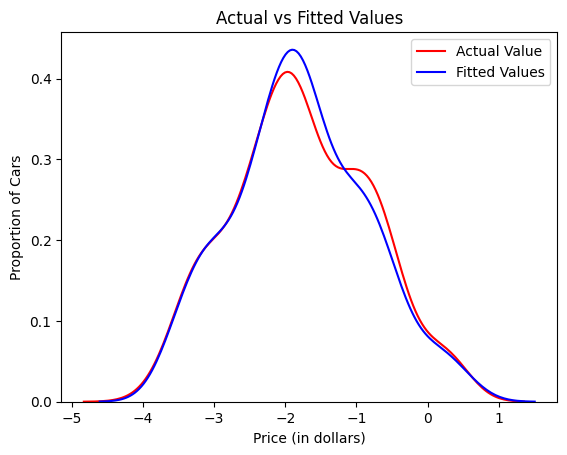

In [19]:
# distribution plot
plot_dis(y_test,predicted)

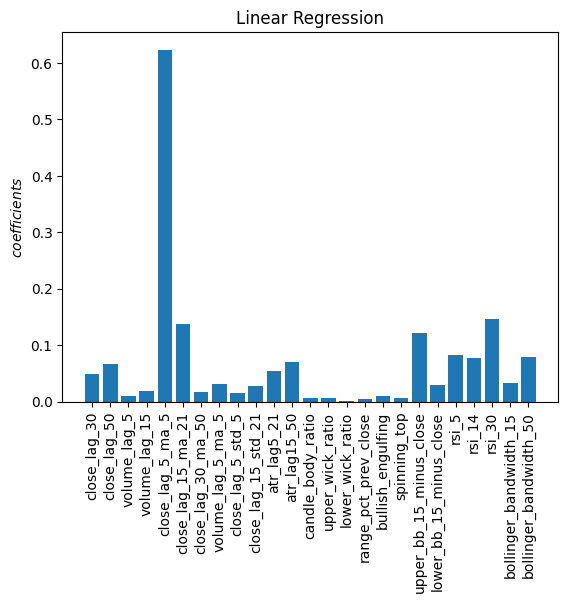

R^2 on training  data  0.9737297116534961
R^2 on testing data  0.97487377932739


In [20]:
plot_coef(X,lm,name="Linear Regression")

**Ridge Regression**

In [21]:
#Ridge regression

rr = Ridge(alpha=0.01)
rr
rr.fit(X_train, y_train)

rr.predict(X_test)

array([-0.51107647, -0.47974769, -2.38158867, -2.68247162, -3.33014628,
       -0.55296557, -3.56903912, -1.84881093, -0.77598727, -3.20374308,
       -1.82910178, -2.28907933, -1.50527279, -2.1760239 , -1.9301345 ,
       -3.27852673, -1.84514326, -1.30181585, -1.45933652, -1.22241328,
       -0.64137693, -3.05100438, -3.10727246, -1.86659506, -1.22646782,
       -0.87319667, -0.97124868, -3.33120389, -0.9144447 , -1.75687907,
       -0.73459985, -0.25889369, -0.99096679, -1.4681944 , -0.76454916,
       -1.3333688 , -1.65381694, -1.16677423,  0.29143238, -2.22006586,
       -3.09142641, -3.15731683, -1.39639677, -1.48203871, -3.34207681,
       -3.01247098, -0.60449964, -1.88049992, -2.98172174, -1.65220357,
       -3.05916684, -2.54025759, -1.39950839,  0.07679543, -1.98106167,
       -1.77903869, -1.62385381, -1.56852845, -1.12356143, -1.8121702 ,
       -0.64326815,  0.39457413, -3.07622506, -2.03841744, -0.9234229 ,
       -2.48433744, -1.35269028, -2.24779148, -2.56398409, -1.17

In [22]:
print("R^2 on training  data ",rr.score(X_train, y_train))
print("R^2 on testing data ",rr.score(X_test,y_test))

R^2 on training  data  0.9737297111071995
R^2 on testing data  0.9748742894648482


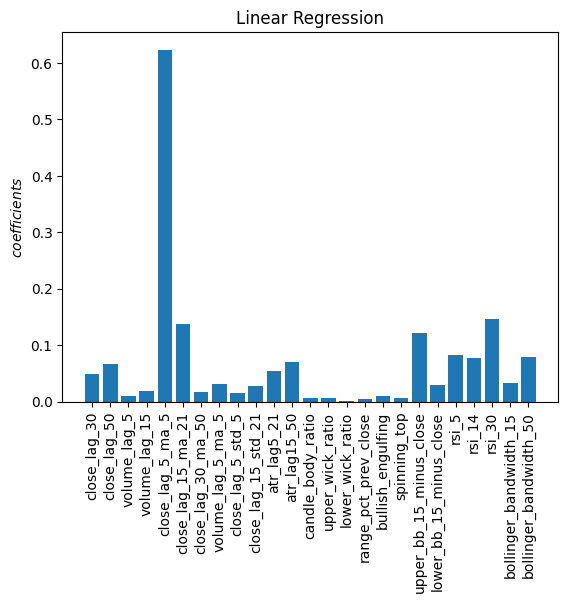

R^2 on training  data  0.9737297116534961
R^2 on testing data  0.97487377932739


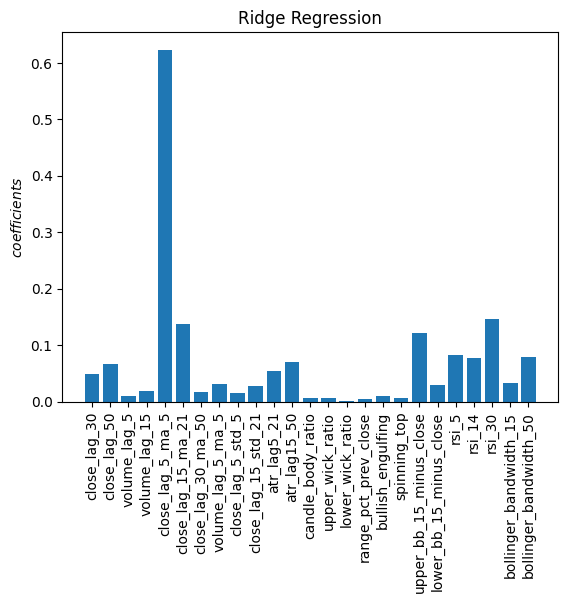

R^2 on training  data  0.9737297111071995
R^2 on testing data  0.9748742894648482


In [23]:
plot_coef(X,lm,name="Linear Regression")
plot_coef(X,rr,name="Ridge Regression")

I have decided to increase alpha in order to effect the coefficients

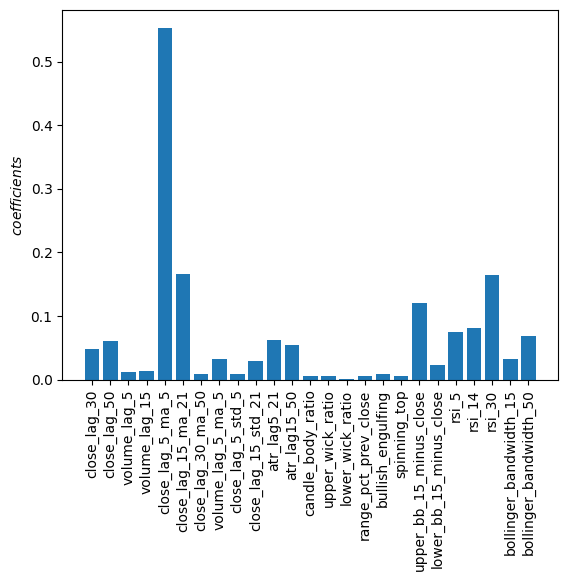

R^2 on training  data  0.9733751901852817
R^2 on testing data  0.9749435457726172


In [24]:
rr = Ridge(alpha=10)   #Ridge(alpha=1)
rr.fit(X_train, y_train)
plot_coef(X,rr)

Ridge and Linear regression were so similar since alpha was low but increasing alpha 100 fold did not change either ... How could this be ?




---

#  Why does increasing alpha in Ridge not change train/test error?

### What you expect:

In Ridge regression (L2 regularization), increasing `alpha`:

* Adds more penalty to large weights.
* Usually increases bias (higher error on training set).
* Usually reduces variance (test error may decrease if overfit).

So normally, **train error increases slightly, test error decreases slightly (up to a point).**

---

#  Why might your train/test errors stay the same even as `alpha` grows?

###  Possible reasons:

---

### 1 **Features already highly correlated or redundant (multicollinear)**

If your predictors are highly correlated trailing indicators, they carry a lot of overlapping information.
 Ridge is designed to shrink weights on correlated predictors — but if the predictors already contribute the same signal, shrinking them slightly doesn’t meaningfully change predictions.

---

### 2 **Low signal-to-noise ratio**

If your predictors don’t have strong predictive power for `y` (e.g., if trailing indicators are very lagged or noisy), then no matter how you adjust weights, the model’s fit won’t improve much.

---

### 3 **Alpha range too small / model insensitive**

If your alpha values are too small relative to the scale of your data, the regularization penalty might not kick in enough to noticeably change anything.
Try testing on a logarithmic scale:

```python
alphas = [0.01, 0.1, 1, 10, 100, 1000]
```

---

### 4 **Data leakage / constant test set**

If your train/test split leaked future info, or your target is strongly autocorrelated, your model might appear to always “know” the answer, and alpha doesn’t matter much.

---

# Summary:

Yes — it could very well be because:

* You’re using *trailing indicators* that already encode most of the signal, and regularization doesn’t change the prediction much.
* Or your features are highly redundant and regularization just spreads weight between them without reducing error.

---

# Next steps:

 Check:

* Feature correlations (you already did — you know they’re highly correlated).
* Try removing redundant indicators and see if test error changes.
* Explore a wider alpha range (`1e-3` to `1e3`).
* Plot learning curves (train vs. test error as a function of alpha).

---


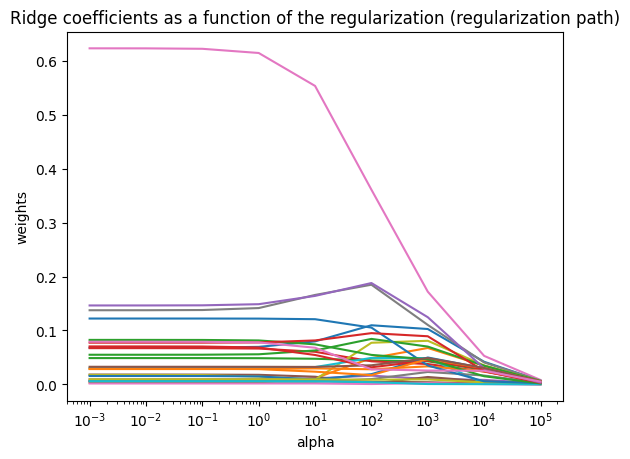

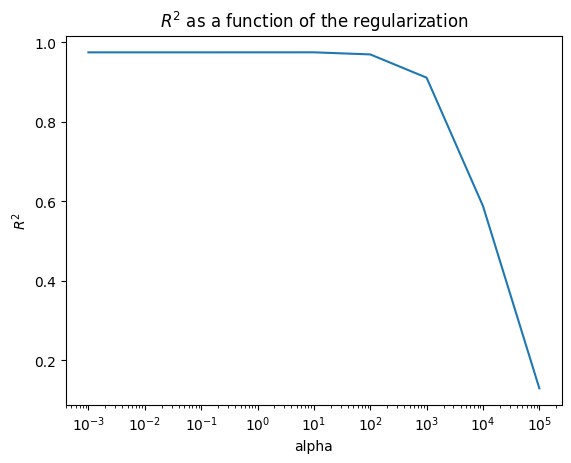

In [25]:
alphas = [0.001,0.01,0.1,1,10,100,1000,10000,10000,100000]
R_2=[]
coefs = []
for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train, y_train)
    coefs.append(abs(ridge.coef_))
    R_2.append(ridge.score(X_test,y_test))


ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale("log")
plt.xlabel("alpha")
plt.ylabel("weights")
plt.title("Ridge coefficients as a function of the regularization (regularization path)")
plt.show()


ax = plt.gca()
ax.plot(alphas, R_2)
ax.set_xscale("log")
plt.xlabel("alpha")
plt.ylabel("$R^2$")
plt.title("$R^2$ as a function of the regularization")
plt.show()

In [26]:
Input=[ ('polynomial', PolynomialFeatures(include_bias=False,degree=2)),('ss',StandardScaler() ), ('model',Ridge(alpha=1))]
pipe = Pipeline(Input)

In [27]:
pipe.fit(X_train, y_train)

,steps,"[('polynomial', ...), ('ss', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,degree,2
,interaction_only,False
,include_bias,False
,order,'C'
,copy,True
,with_mean,True
,with_std,True


In [28]:
param_grid = {
    "polynomial__degree": [1,2,3,4],
    "model__alpha":[0.0001,0.001,0.01,0.1,1,10]
}

In [29]:
search = GridSearchCV(pipe, param_grid, n_jobs=2)

search.fit(X_train, y_train)
search

,estimator,Pipeline(step...ge(alpha=1))])
,param_grid,"{'model__alpha': [0.0001, 0.001, ...], 'polynomial__degree': [1, 2, ...]}"
,scoring,None
,n_jobs,2
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,degree,2


In [30]:
pd.DataFrame(search.cv_results_).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__alpha,param_polynomial__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.013883,0.001346,0.004498,0.000413,0.0001,1,"{'model__alpha': 0.0001, 'polynomial__degree': 1}",0.971425,0.974669,0.970091,0.975863,0.965100,0.971430,0.003795,14
1,0.055483,0.003837,0.007319,0.000555,0.0001,2,"{'model__alpha': 0.0001, 'polynomial__degree': 2}",0.989514,0.992819,0.983795,0.991473,0.969917,0.985504,0.008380,6
2,0.396768,0.029531,0.023515,0.002765,0.0001,3,"{'model__alpha': 0.0001, 'polynomial__degree': 3}",0.974953,0.966319,0.974950,0.974145,0.961420,0.970357,0.005527,18
3,2.618821,0.462050,0.105974,0.014149,0.0001,4,"{'model__alpha': 0.0001, 'polynomial__degree': 4}",0.880168,0.874238,0.940887,0.948987,0.908273,0.910511,0.030478,24
4,0.012901,0.001437,0.004716,0.000431,0.0010,1,"{'model__alpha': 0.001, 'polynomial__degree': 1}",0.971426,0.974669,0.970091,0.975863,0.965100,0.971430,0.003795,13


In [31]:
print("best_score_: ",search.best_score_)
print("best_params_: ",search.best_params_)

best_score_:  0.9944523675435148
best_params_:  {'model__alpha': 1, 'polynomial__degree': 2}


In [32]:

predict = search.predict(X_test)

predict

array([-0.47212672, -0.28381615, -2.39916909, -2.62060839, -3.44379913,
       -0.57000952, -3.54753443, -1.7616377 , -1.11726529, -3.21401645,
       -1.90004284, -2.29102157, -1.31612944, -2.16981536, -1.95551128,
       -3.28469756, -1.87571061, -1.19857767, -1.31400246, -1.12518298,
       -0.68309447, -3.09460859, -3.1116015 , -1.85258985, -1.05869798,
       -0.63898951, -0.80137057, -3.33500678, -0.61666173, -1.75687753,
       -0.75507549, -0.09013617, -1.01544723, -1.63875803, -0.8270118 ,
       -1.44756502, -1.80678511, -1.16525931,  0.2926647 , -2.23289732,
       -3.26517929, -3.20090133, -1.32347112, -1.16979646, -3.34381462,
       -3.11173974, -0.54248639, -1.814488  , -3.19219611, -1.52543985,
       -3.158519  , -2.57722206, -0.75477266, -0.03115286, -1.87093661,
       -1.63923088, -1.61627757, -1.49625407, -1.0439225 , -1.87922653,
       -0.56195908,  0.51680512, -3.15453671, -1.91224295, -0.91681246,
       -2.74526735, -1.26337904, -2.10803416, -2.50024023, -1.13

In [33]:
best=search.best_estimator_
best

,steps,"[('polynomial', ...), ('ss', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,degree,2
,interaction_only,False
,include_bias,False
,order,'C'
,copy,True
,with_mean,True
,with_std,True


In [34]:
predict = best.predict(X_test)
predict

array([-0.47212672, -0.28381615, -2.39916909, -2.62060839, -3.44379913,
       -0.57000952, -3.54753443, -1.7616377 , -1.11726529, -3.21401645,
       -1.90004284, -2.29102157, -1.31612944, -2.16981536, -1.95551128,
       -3.28469756, -1.87571061, -1.19857767, -1.31400246, -1.12518298,
       -0.68309447, -3.09460859, -3.1116015 , -1.85258985, -1.05869798,
       -0.63898951, -0.80137057, -3.33500678, -0.61666173, -1.75687753,
       -0.75507549, -0.09013617, -1.01544723, -1.63875803, -0.8270118 ,
       -1.44756502, -1.80678511, -1.16525931,  0.2926647 , -2.23289732,
       -3.26517929, -3.20090133, -1.32347112, -1.16979646, -3.34381462,
       -3.11173974, -0.54248639, -1.814488  , -3.19219611, -1.52543985,
       -3.158519  , -2.57722206, -0.75477266, -0.03115286, -1.87093661,
       -1.63923088, -1.61627757, -1.49625407, -1.0439225 , -1.87922653,
       -0.56195908,  0.51680512, -3.15453671, -1.91224295, -0.91681246,
       -2.74526735, -1.26337904, -2.10803416, -2.50024023, -1.13

In [35]:
best.score(X_test, y_test)
best.fit(X,y)

,steps,"[('polynomial', ...), ('ss', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,degree,2
,interaction_only,False
,include_bias,False
,order,'C'
,copy,True
,with_mean,True
,with_std,True


**Lasso Regression**

In [36]:
la = Lasso(alpha=0.01)
la.fit(X_train,y_train)
la

,alpha,0.01
,fit_intercept,True
,precompute,False
,copy_X,True
,max_iter,1000
,tol,0.0001
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


In [37]:
predicted = la.predict(X_test)
predicted

array([-0.49050011, -0.42506544, -2.38582109, -2.69361255, -3.35132402,
       -0.52481447, -3.468588  , -1.89571693, -0.86826328, -3.14134251,
       -1.78098921, -2.27795459, -1.50445493, -2.14639617, -1.88716714,
       -3.26422381, -1.87577629, -1.27263954, -1.43229656, -1.18589712,
       -0.70949006, -3.02247959, -3.03156101, -1.83260651, -1.22580382,
       -0.71703605, -0.97761688, -3.34453426, -0.91155313, -1.7571717 ,
       -0.79721276, -0.24271141, -1.09126514, -1.49099999, -0.73770077,
       -1.2903064 , -1.67965312, -1.0901135 ,  0.32890099, -2.21744654,
       -3.09168013, -3.08798025, -1.37452212, -1.53483247, -3.25402751,
       -2.99945315, -0.63990541, -1.88394169, -3.00359374, -1.64587133,
       -3.00774136, -2.5662072 , -1.36979234,  0.07802504, -1.97093682,
       -1.82236663, -1.58869318, -1.52101066, -1.14997162, -1.82328754,
       -0.66808171,  0.33571877, -3.06505093, -2.0467314 , -0.96533994,
       -2.44935773, -1.33614415, -2.26050909, -2.48332479, -1.19

In [38]:
print("R^2 on training  data ",lm.score(X_train, y_train))
print("R^2 on testing data ",lm.score(X_test,y_test))

R^2 on training  data  0.9737297116534961
R^2 on testing data  0.97487377932739


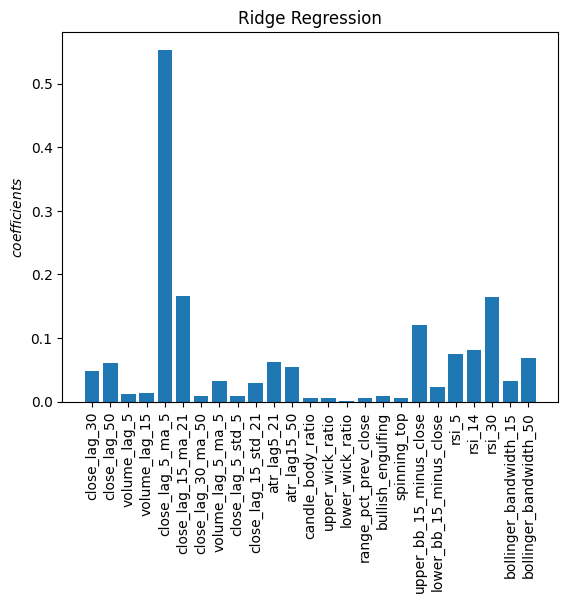

R^2 on training  data  0.9733751901852817
R^2 on testing data  0.9749435457726172


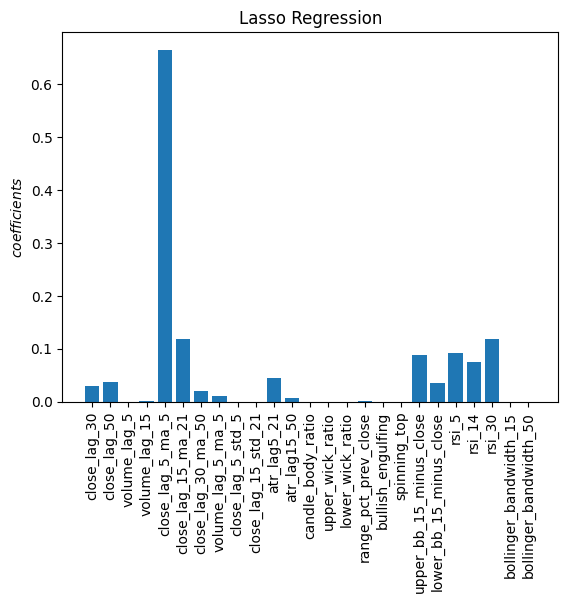

R^2 on training  data  0.9713886675656391
R^2 on testing data  0.9730088016983662


In [39]:
plot_coef(X,rr,name="Ridge Regression")
plot_coef(X,la,name="Lasso Regression")

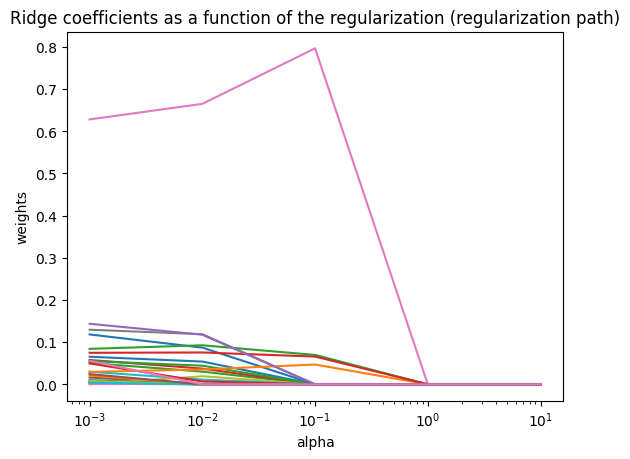

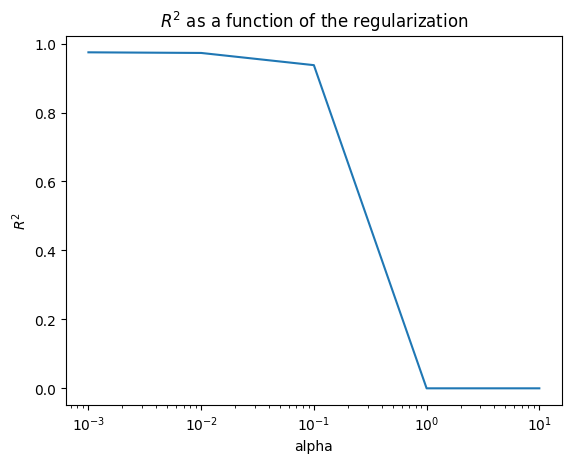

In [40]:
alphas = [0.001,0.01,0.1,1,10]
R_2=[]
coefs = []
for alpha in alphas:
    la=Lasso(alpha=alpha)

    la.fit(X_train, y_train)
    coefs.append(abs(la.coef_))
    R_2.append(la.score(X_test,y_test))


ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale("log")
plt.xlabel("alpha")
plt.ylabel("weights")
plt.title("Ridge coefficients as a function of the regularization (regularization path)")
plt.show()


ax = plt.gca()
ax.plot(alphas, R_2)
ax.set_xscale("log")
plt.xlabel("alpha")
plt.ylabel("$R^2$")
plt.title("$R^2$ as a function of the regularization")
plt.show()

In [41]:
Input=[ ('polynomial', PolynomialFeatures(include_bias=False,degree=2)),('ss',StandardScaler() ), ('model',Lasso(alpha=1, tol = 0.2))]
pipe = Pipeline(Input)

In [42]:
pipe.fit(X_train, y_train)
pipe.predict(X_test)

array([-1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75530964,
       -1.75530964, -1.75530964, -1.75530964, -1.75530964, -1.75

In [43]:
print("R^2 on training  data ",pipe.score(X_train, y_train))
print("R^2 on testing data ",pipe.score(X_test,y_test))

R^2 on training  data  0.0
R^2 on testing data  -0.00016886376686620075


In [44]:
param_grid = {
    "polynomial__degree": [ 1, 2,3,4,5],
    "model__alpha":[0.0001,0.001,0.01,0.1,1,10]
}

In [45]:
search = GridSearchCV(pipe, param_grid, n_jobs=1)
search.fit(X_train, y_train)

,estimator,"Pipeline(step...1, tol=0.2))])"
,param_grid,"{'model__alpha': [0.0001, 0.001, ...], 'polynomial__degree': [1, 2, ...]}"
,scoring,None
,n_jobs,1
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,degree,5


In [46]:
best=search.best_estimator_
best

,steps,"[('polynomial', ...), ('ss', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,degree,5
,interaction_only,False
,include_bias,False
,order,'C'
,copy,True
,with_mean,True
,with_std,True


In [47]:
best.score(X_test,y_test)

0.9630936906580917

**Elastic Net**

In [48]:
enet = ElasticNet(alpha=0.1, l1_ratio=0.01)
enet.fit(X_train,y_train)

,alpha,0.1
,l1_ratio,0.01
,fit_intercept,True
,precompute,False
,max_iter,1000
,copy_X,True
,tol,0.0001
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


In [49]:

predicted=enet.predict(X_test)
predicted

array([-0.65668571, -0.44687382, -2.44205362, -2.7483082 , -3.3200836 ,
       -0.64320146, -3.46750871, -1.94295481, -0.83336663, -3.09080415,
       -1.73270878, -2.29850219, -1.64839321, -2.26601271, -1.98804082,
       -3.17878257, -1.96774987, -1.32559511, -1.54501717, -1.25309646,
       -0.68543373, -3.0032757 , -3.0370268 , -1.92744395, -1.36655359,
       -0.75858771, -1.01318819, -3.26466662, -0.94753846, -1.76955302,
       -0.7640032 , -0.22660258, -1.06115021, -1.4627119 , -0.79290703,
       -1.3446862 , -1.65891465, -1.27581842,  0.31031906, -2.33289302,
       -3.05285614, -3.0564577 , -1.43335407, -1.36294155, -3.13757438,
       -2.94215106, -0.66596139, -1.92529039, -2.99424405, -1.67514695,
       -2.91744272, -2.54609866, -1.3548952 ,  0.08573836, -2.1187744 ,
       -1.88052867, -1.66095599, -1.68838367, -1.25074214, -1.88607057,
       -0.72657866,  0.45724105, -3.08308329, -2.11853805, -0.96784063,
       -2.30524352, -1.43097957, -2.23827985, -2.43270834, -1.25

In [50]:
print("R^2 on training  data ", enet.score(X_train, y_train))
print("R^2 on testing data ", enet.score(X_test,y_test))

R^2 on training  data  0.9668025160580827
R^2 on testing data  0.9698844033714602


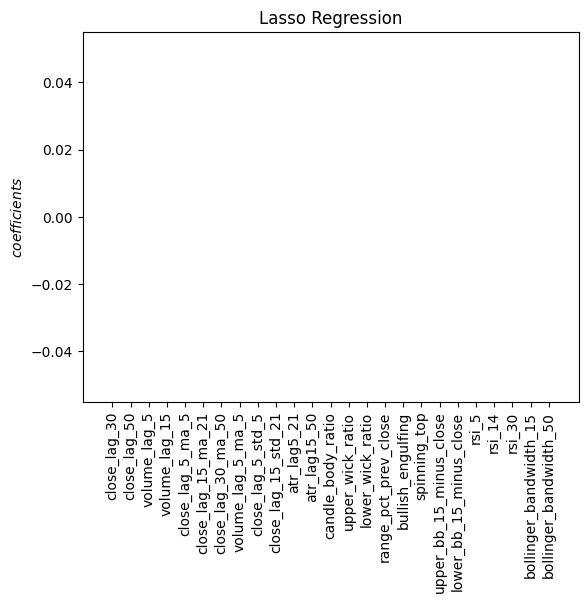

R^2 on training  data  0.0
R^2 on testing data  -0.00016886376686620075


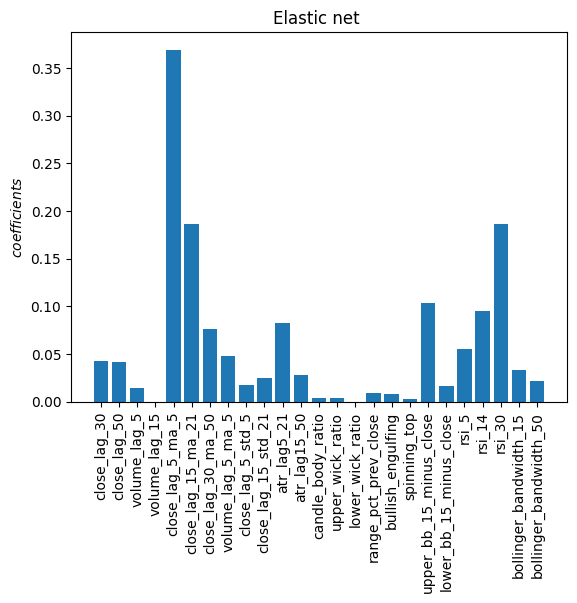

R^2 on training  data  0.9668025160580827
R^2 on testing data  0.9698844033714602


In [51]:
plot_coef(X,la,name="Lasso Regression")
plot_coef(X,enet,name="Elastic net ")

## graph that leads to error

In [52]:
param_grid = {
    "polynomial__degree": [ 1, 2,3,4,5],
    "model__alpha":[0.0001,0.001,0.01,0.1,1,10],
    "model__l1_ratio":[0.1,0.25,0.5,0.75,0.9]
}


**Principle Component Analaysis**

In this example, we will explore Principal Component Analysis to reduce the dimensionality of our data. We will do so by creating a Pipeline object first, then applying standard scaling and performing PCA, and then applying Elastic Net Regularization with the following parametrs: tol=0.2, alpha=0.1 and l1_ratio=0.1. Finally, we will fit the model using the training data, then calculate the  R2  on the training and testing data sets.

In [54]:
pca = PCA()
pca.fit(X_train)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [55]:
X_train_hat = pca.transform(X_train)
print(X_train_hat.shape)

(948, 27)


In [56]:
X_train_hat_PCA = pd.DataFrame(columns=[f'Projection  on Component {i+1}' for i in range(len(X_train.columns))], data=X_train_hat)
X_train_hat_PCA.head()

,Projection on Component 1,Projection on Component 2,Projection on Component 3,Projection on Component 4,Projection on Component 5,Projection on Component 6,Projection on Component 7,Projection on Component 8,Projection on Component 9,Projection on Component 10,...,Projection on Component 18,Projection on Component 19,Projection on Component 20,Projection on Component 21,Projection on Component 22,Projection on Component 23,Projection on Component 24,Projection on Component 25,Projection on Component 26,Projection on Component 27
0,-2.250948,2.150443,1.056587,0.182811,0.469564,0.379022,-0.292308,-0.173887,-0.084956,0.230961,...,0.171904,0.473003,0.241631,0.210896,0.188208,0.105584,0.182621,0.074270,0.135526,-8.675334e-16
1,3.907467,2.132630,0.557923,0.126093,0.202231,-1.472884,-0.336029,-0.419176,0.625738,-0.559263,...,0.045616,-0.224167,-0.337843,-0.300172,0.096525,0.226583,-0.049823,-0.011268,0.116483,8.554624e-16
2,-3.657111,-0.423382,-0.886188,0.437902,2.039579,-1.567436,0.445999,-0.559538,1.063431,-0.325442,...,-0.024054,-0.554284,-0.684036,-0.273971,0.040478,-0.006777,-0.238117,0.126760,-0.103864,-8.487593e-17
3,-0.203753,0.833619,-0.029542,-0.446861,0.102448,0.486130,-0.443095,1.087885,0.246831,-0.112761,...,0.237185,-0.170697,-0.265256,-0.384241,-0.065056,0.140844,-0.050160,-0.149121,0.052573,5.902125e-16
4,-0.074844,1.021767,-1.954612,-1.654670,1.906763,-1.149881,0.559948,0.512742,-0.785058,-0.075278,...,0.255483,-0.127917,0.151705,0.069352,-0.303805,0.108449,0.130909,-0.068432,0.009861,-2.134542e-15


Text(0.5, 1.0, 'Component-wise variance and cumulative explained variance')

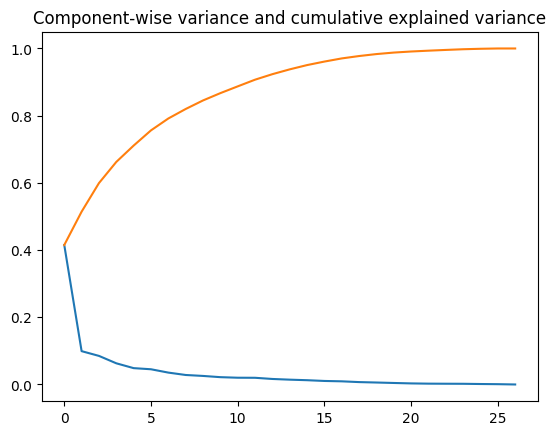

In [57]:
plt.plot(pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title("Component-wise variance and cumulative explained variance")

In [58]:
N = 20
X_train_hat_PCA = X_train_hat_PCA.iloc[:, :N]

In [59]:
enet = ElasticNet(tol = 0.2, alpha=100, l1_ratio=0.75)
enet.fit(X_train_hat_PCA, y_train)

,alpha,100
,l1_ratio,0.75
,fit_intercept,True
,precompute,False
,max_iter,1000
,copy_X,True
,tol,0.2
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


In [65]:
# prompt: Import 30 days of hour data from yahoo finance.

!pip install yfinance
import yfinance as yf

# Define the ticker symbol for XRP
ticker_symbol = "XRP-USD"

# Get the data for the last 30 days, at 1-hour intervals
# Note: yfinance's hourly data support might be limited or inconsistent for all tickers/periods.
# You might need to use daily data or a dedicated crypto data source for more reliable granular data.
xrp_data = yf.download(
    tickers=ticker_symbol,
    period="30d",
    interval="1h" # Requesting 1-hour data
)

# Display the first few rows of the downloaded data
print(xrp_data.head())

# Display information about the dataframe
xrp_data.info()


from sklearn.model_selection import train_test_split

X = xrp_data.drop("Close",axis=1)
y = xrp_data["Close"]

# Assuming 'final_df' is your DataFrame containing features and the target 'close'
# X will be features, y will be the target

# Split data without shuffling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

print("number of test samples :", X_test.shape[0])
print("number of training samples:",X_train.shape[0])

# You might want to reset the index after splitting if needed, but for time series,
# keeping the original index might be helpful for plotting or analysis later.
# X_train = X_train.reset_index(drop=True)
# X_test = X_test.reset_index(drop=True)
# y_train = y_train.reset_index(drop=True)
# y_test = y_test.reset_index(drop=True)

#Must craft my indicators before split;

/tmp/ipython-input-65-1281456965.py:12: FutureWarning: YF.download() has changed argument auto_adjust default to True
  xrp_data = yf.download(
[*********************100%***********************]  1 of 1 completed

Price                         Close      High       Low      Open  Volume
Ticker                      XRP-USD   XRP-USD   XRP-USD   XRP-USD XRP-USD
Datetime                                                                 
2025-06-21 00:00:00+00:00  2.118639  2.122988  2.117877  2.120339       0
2025-06-21 01:00:00+00:00  2.125002  2.128412  2.118516  2.118617       0
2025-06-21 02:00:00+00:00  2.127167  2.128247  2.123714  2.125073       0
2025-06-21 03:00:00+00:00  2.131610  2.132226  2.126958  2.127074       0
2025-06-21 04:00:00+00:00  2.122665  2.131327  2.122545  2.131327       0
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 717 entries, 2025-06-21 00:00:00+00:00 to 2025-07-20 20:00:00+00:00
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   (Close, XRP-USD)   717 non-null    float64
 1   (High, XRP-USD)    717 non-null    float64
 2   (Low, XRP-USD)     717 non-null    float64
 3   (Open, XRP